## Importing libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings, joblib, gc, re, time
warnings.filterwarnings('ignore')
from scipy.stats import probplot
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, FunctionTransformer, PowerTransformer, OneHotEncoder,LabelEncoder
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.pipeline import Pipeline
from feature_engine.selection import DropConstantFeatures, DropDuplicateFeatures, DropCorrelatedFeatures 
from sklearn.feature_selection import SelectKBest, f_regression, SelectPercentile, SelectFromModel, RFE, SequentialFeatureSelector
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, ExtraTreesRegressor, HistGradientBoostingRegressor, BaggingRegressor, VotingRegressor, StackingRegressor
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet, BayesianRidge, HuberRegressor, PassiveAggressiveRegressor, SGDRegressor, PoissonRegressor, RANSACRegressor, TheilSenRegressor, GammaRegressor, ARDRegression, TweedieRegressor
from sklearn.neighbors import KNeighborsRegressor, RadiusNeighborsRegressor
from sklearn.svm import SVR, LinearSVR, NuSVR
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor, XGBRFRegressor
from yellowbrick.regressor import PredictionError, ResidualsPlot
from sklearn.impute import SimpleImputer
from feature_engine.outliers import Winsorizer
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from ngboost import NGBRegressor
from sklearn.neural_network import MLPRegressor
import skopt
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from mlxtend.plotting import plot_decision_regions
import skopt
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from mlxtend.plotting import plot_decision_regions


## Reading the dataset

In [2]:
df = pd.read_csv('Super_Store_data.csv',encoding='latin-1')
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,1,CA-2016-152156,11/8/2016,11/11/2016,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136
1,2,CA-2016-152156,11/8/2016,11/11/2016,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820
2,4,US-2015-108966,10/11/2015,10/18/2015,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310
3,6,CA-2014-115812,6/9/2014,6/14/2014,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,...,90032,West,FUR-FU-10001487,Furniture,Furnishings,Eldon Expressions Wood and Plastic Desk Access...,48.8600,7,0.00,14.1694
4,11,CA-2014-115812,6/9/2014,6/14/2014,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,...,90032,West,FUR-TA-10001539,Furniture,Tables,Chromcraft Rectangular Conference Tables,1706.1840,9,0.20,85.3092


## Data Exploration

In [3]:
print('Shape of Dataset:',df.shape)

Shape of Dataset: (2121, 21)


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2121 entries, 0 to 2120
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Row ID         2121 non-null   int64  
 1   Order ID       2121 non-null   object 
 2   Order Date     2121 non-null   object 
 3   Ship Date      2121 non-null   object 
 4   Ship Mode      2121 non-null   object 
 5   Customer ID    2121 non-null   object 
 6   Customer Name  2121 non-null   object 
 7   Segment        2121 non-null   object 
 8   Country        2121 non-null   object 
 9   City           2121 non-null   object 
 10  State          2121 non-null   object 
 11  Postal Code    2121 non-null   int64  
 12  Region         2121 non-null   object 
 13  Product ID     2121 non-null   object 
 14  Category       2121 non-null   object 
 15  Sub-Category   2121 non-null   object 
 16  Product Name   2121 non-null   object 
 17  Sales          2121 non-null   float64
 18  Quantity

# Data Preprocessing

In [5]:
df['Order Date'] = pd.to_datetime(df['Order Date'],errors='coerce')
df['Ship Date'] = pd.to_datetime(df['Ship Date'],errors='coerce')

In [6]:
df.set_index('Row ID',inplace=True)

In [7]:
df.nunique().sort_values()

Category            1
Country             1
Segment             3
Sub-Category        4
Ship Mode           4
Region              4
Discount           11
Quantity           14
State              48
City              371
Product ID        375
Product Name      380
Postal Code       454
Customer Name     707
Customer ID       707
Order Date        889
Ship Date         960
Sales            1636
Order ID         1764
Profit           1777
dtype: int64

In [8]:
# Drop values
df.drop(columns=['Country','Category', # as it contains single value
                ],inplace=True)

In [9]:
df.isna().sum()

Order ID         0
Order Date       0
Ship Date        0
Ship Mode        0
Customer ID      0
Customer Name    0
Segment          0
City             0
State            0
Postal Code      0
Region           0
Product ID       0
Sub-Category     0
Product Name     0
Sales            0
Quantity         0
Discount         0
Profit           0
dtype: int64

***No Null values are present in the dataset***

In [10]:
df.duplicated().any()

True

In [11]:
df = df.drop_duplicates()

In [12]:
df.drop(['Order ID','Customer ID','Customer Name','Product ID'],axis=1,inplace=True)# we dont need these columns

## Exploratory Data Analysis

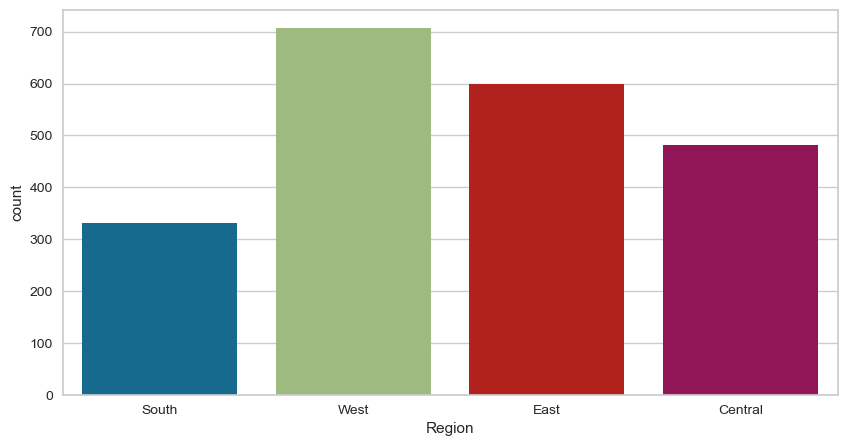

In [13]:
plt.figure(figsize=(10,5))
sns.countplot(x='Region',data=df)
plt.show()

A significant number of customers belong to the Western region while the Southern region has the least number of customers.

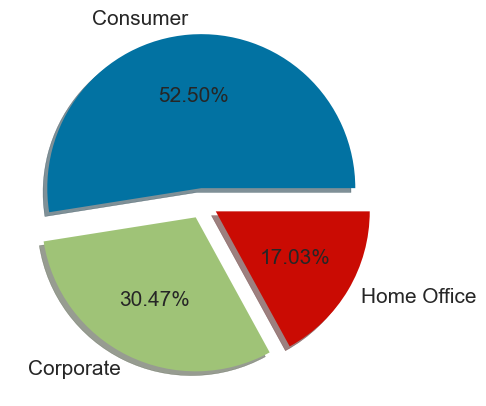

In [14]:
plt.figure(figsize=(10,5))
labels = df['Segment'].value_counts().keys()
values = df['Segment'].value_counts().values

plt.pie(values,labels=labels,autopct='%1.2f%%',shadow=True,explode=[0.1,0.1,0.1],textprops={'fontsize': 15})
plt.show()

More than half of the entire population belongs to the Consumer segment.

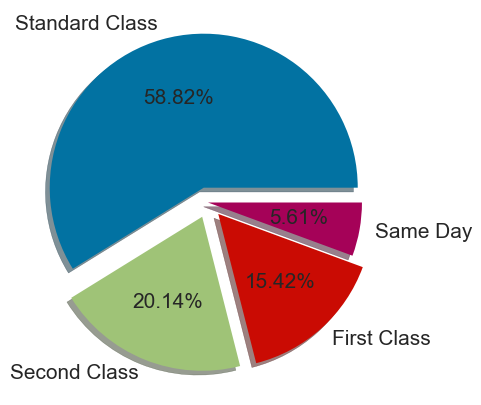

In [15]:
plt.figure(figsize=(10,5))
labels = df['Ship Mode'].value_counts().keys()
values = df['Ship Mode'].value_counts().values

plt.pie(values,labels=labels,autopct='%1.2f%%',shadow=True,explode=[0.1,0.1,0.1,0],textprops={'fontsize': 15})
plt.show()

A significant number of orders were delivered via the Standard shipping mode whereas First Class and Second Class shipping modes were less frequently used.

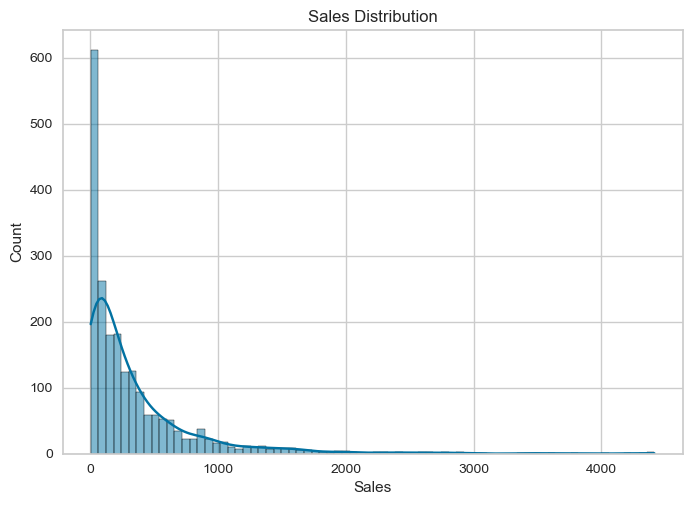

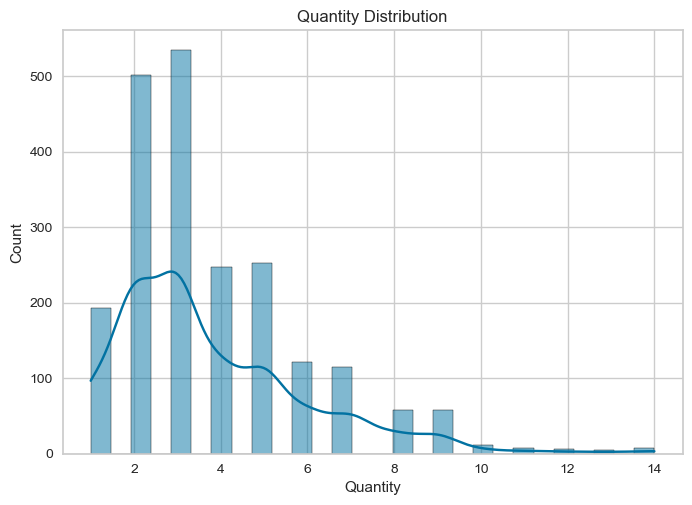

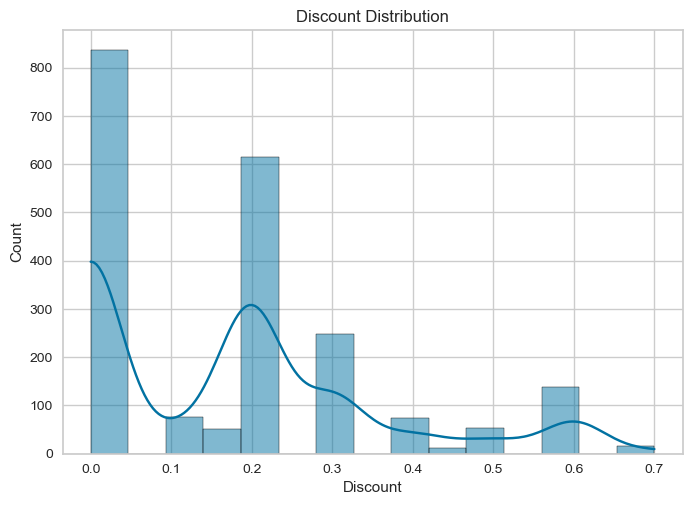

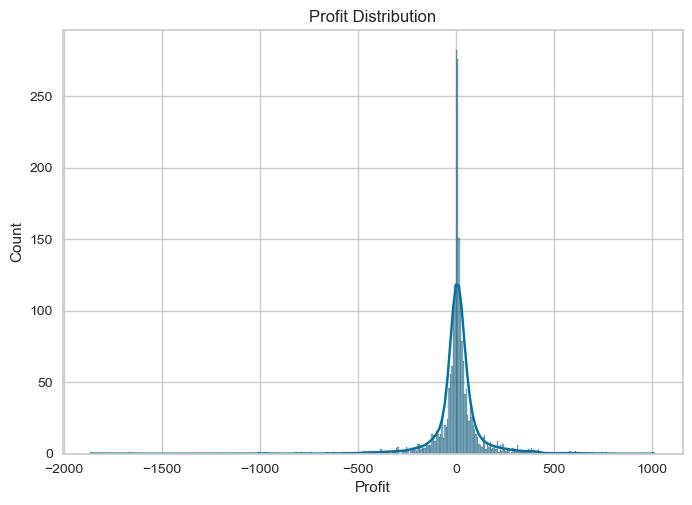

In [16]:
# Sales distribution
sns.histplot(df['Sales'], kde=True)
plt.title('Sales Distribution')
plt.show()

# Quantity distribution
sns.histplot(df['Quantity'], kde=True)
plt.title('Quantity Distribution')
plt.show()

# Discount distribution
sns.histplot(df['Discount'], kde=True)
plt.title('Discount Distribution')
plt.show()

# Profit distribution
sns.histplot(df['Profit'], kde=True)
plt.title('Profit Distribution')
plt.show()

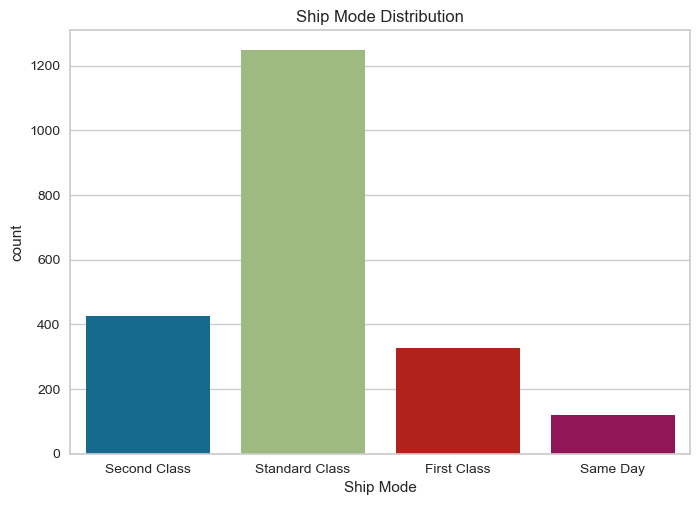

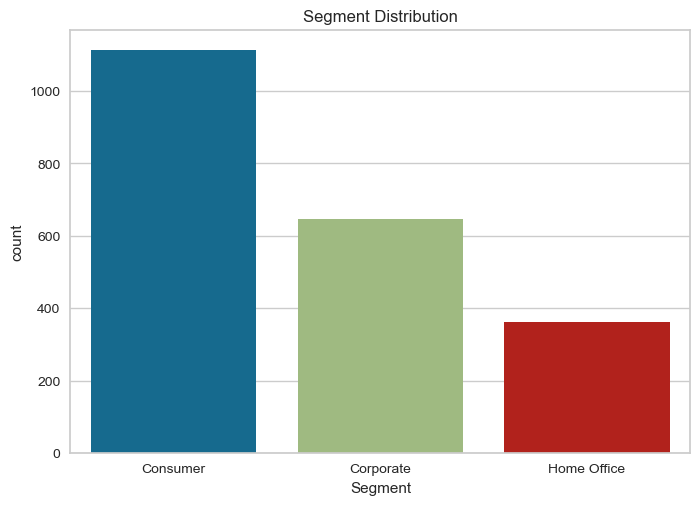

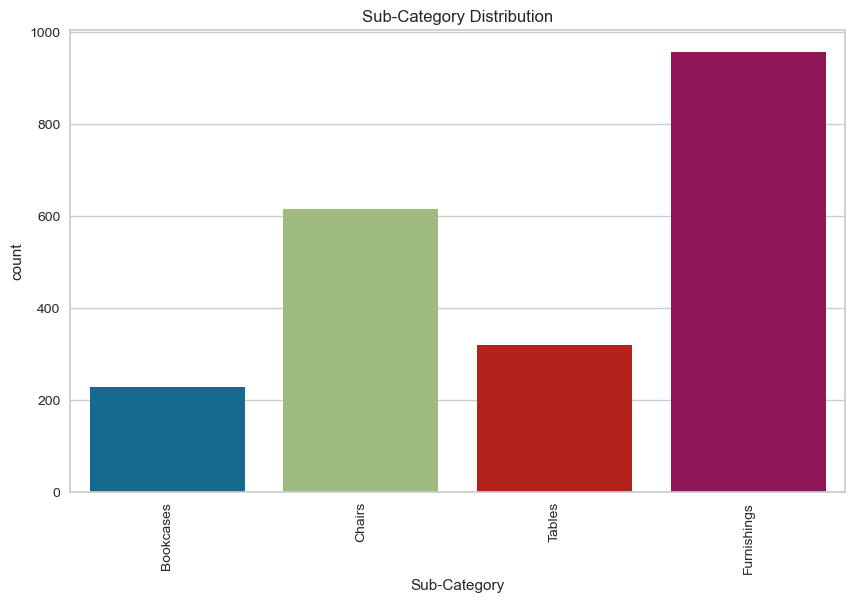

In [17]:
# Ship Mode distribution
sns.countplot(x='Ship Mode', data=df)
plt.title('Ship Mode Distribution')
plt.show()

# Segment distribution
sns.countplot(x='Segment', data=df)
plt.title('Segment Distribution')
plt.show()


# Sub-Category distribution
plt.figure(figsize=(10, 6))
sns.countplot(x='Sub-Category', data=df)
plt.title('Sub-Category Distribution')
plt.xticks(rotation=90)
plt.show()


Standard Class has the highest count, indicating it is the most frequently used shipping mode.

Consumers has the highest count.

Furnishings are most preffered furniture type

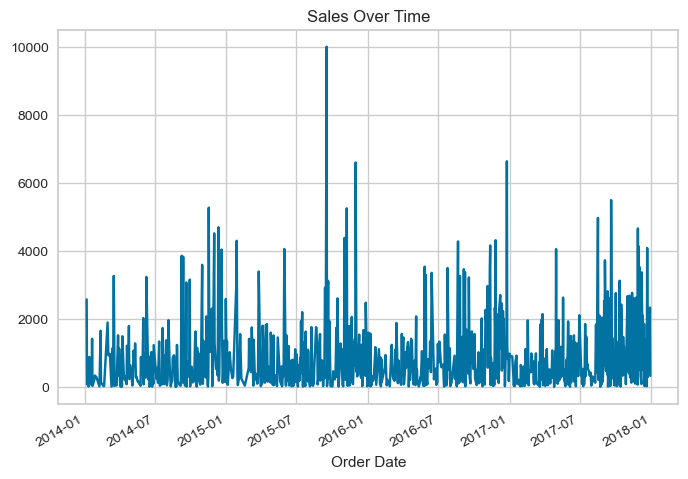

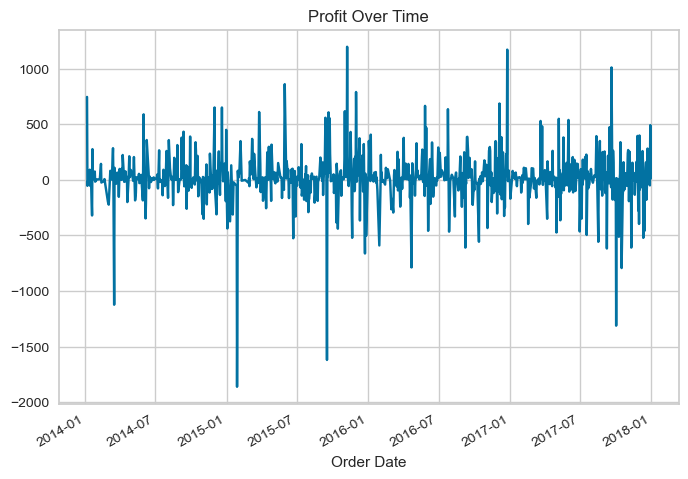

In [18]:
# Sales over time
sales_over_time = df.groupby('Order Date')['Sales'].sum()
sales_over_time.plot()
plt.title('Sales Over Time')
plt.show()

# Profit over time
profit_over_time = df.groupby('Order Date')['Profit'].sum()
profit_over_time.plot()
plt.title('Profit Over Time')
plt.show()


The highest sales appears to occur in late 2015 and also we are seeing greater loss in early 2015

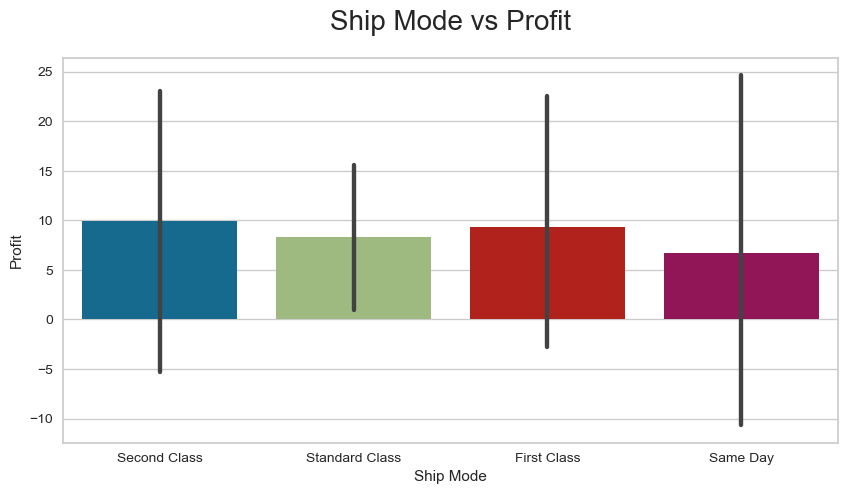

In [19]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Profit',data=df)
plt.title('Ship Mode vs Profit',pad=20,fontsize=20)
plt.show()

The First Class was the chart highlights that while Standard Class is the most profitable, First Class actually results in a loss. This could be useful for making decisions about which shipping modes to prioritize or reconsider.

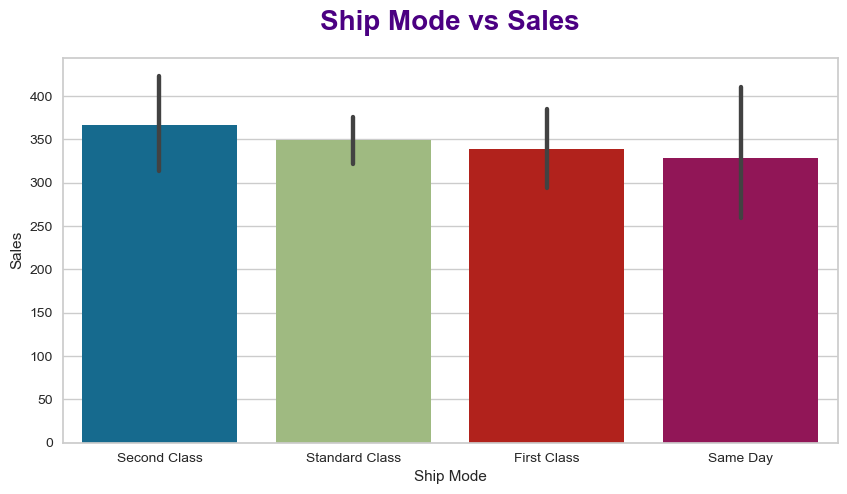

In [20]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Sales',data=df)
plt.title('Ship Mode vs Sales',pad=20,fontsize=20,fontweight='bold',color='indigo')
plt.show()

The shipping modes that generated the highest sales are Second Class and Same Day whereas Standard Class and First Class generated the least sales.

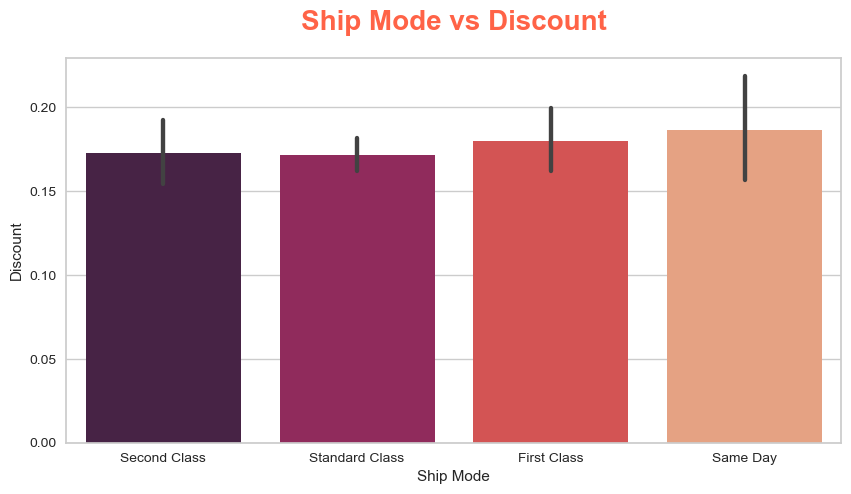

In [21]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Discount',data=df,palette='rocket')
plt.title('Ship Mode vs Discount',pad=20,fontsize=20,fontweight='bold',color='tomato')
plt.show()

The maximum discount was offered on products that were delivered via the Same Day followed by First Class shipping mode whereas the minimum discount was given on products that were shipped via the Standard Class.

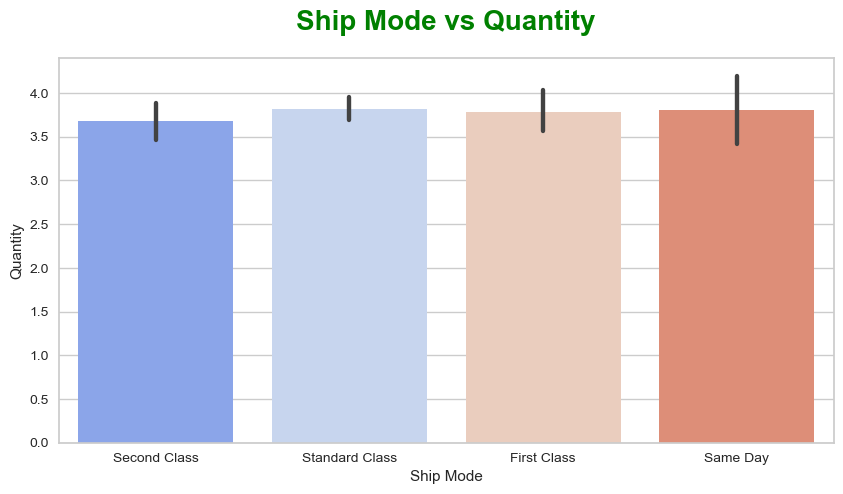

In [22]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Quantity',data=df,palette='coolwarm')
plt.title('Ship Mode vs Quantity',pad=20,fontsize=20,fontweight='bold',color='green')
plt.show()

The highest quantities of products were shipped via the Same Day followed by First Class and Standard Class shipping modes whereas the least quantities were shipped through the Second Class shipping mode.

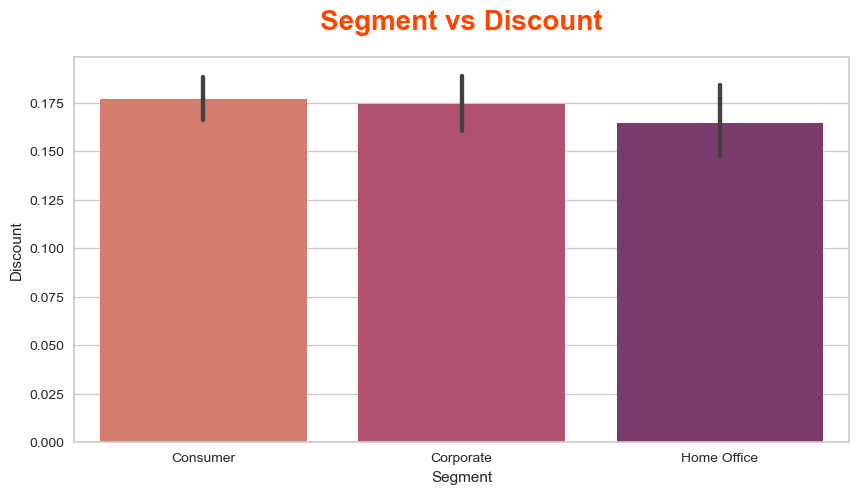

In [23]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Discount',data=df,palette='flare')
plt.title('Segment vs Discount',pad=20,fontsize=20,fontweight='bold',color='orangered')
plt.show()

The highest discount was given on the orders made by Consumer and Corporate segments whereas those made by Home Office provided the least discount.

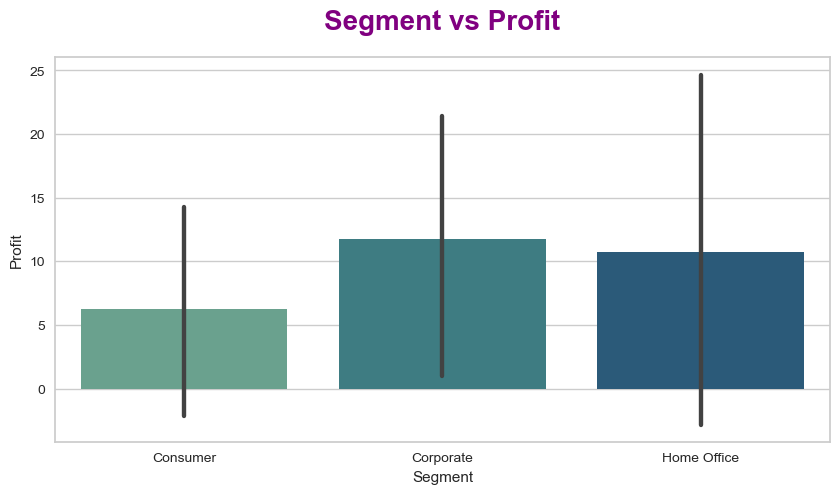

In [24]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Profit',data=df,palette='crest')
plt.title('Segment vs Profit',pad=20,fontsize=20,fontweight='bold',color='purple')
plt.show()

The orders made by Home Office segment generated the highest profit whereas those made by Consumer and Corporate segments generated the least profit.

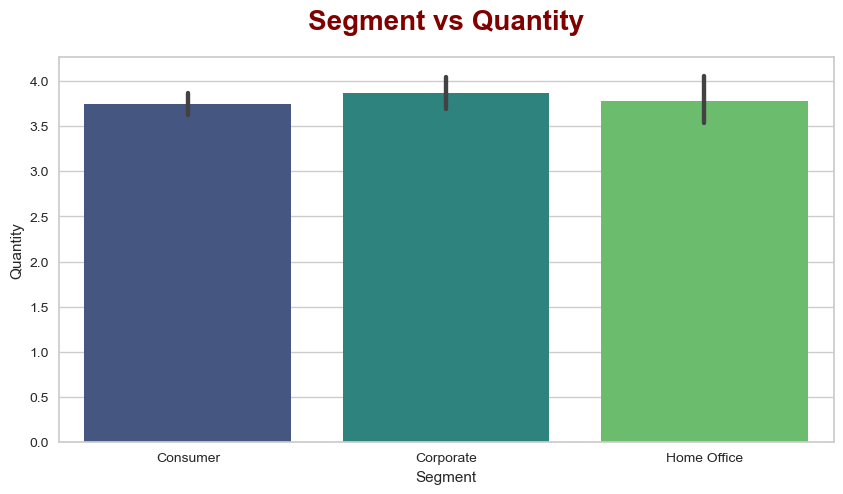

In [25]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Quantity',data=df,palette='viridis')
plt.title('Segment vs Quantity',pad=20,fontsize=20,fontweight='bold',color='maroon')
plt.show()

The highest quantities of products were purchased by the Corporate segment whereas the lowest quantities were purchased by the Consumer segment.

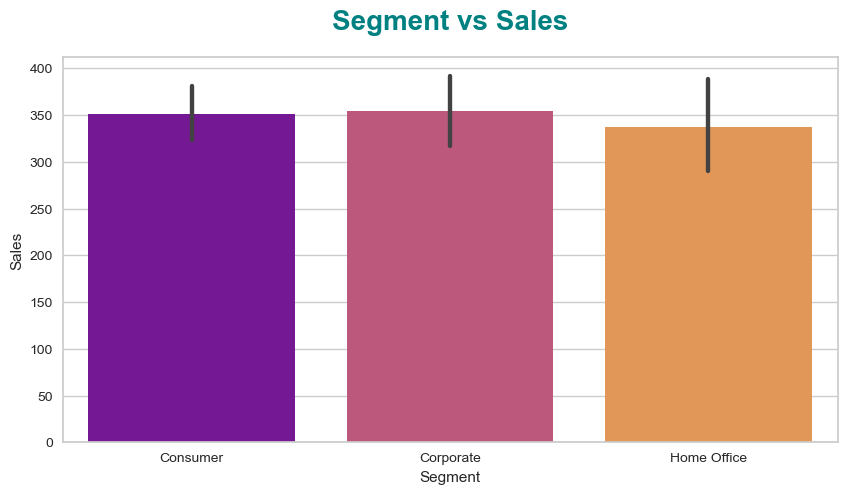

In [26]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Sales',data=df,palette='plasma')
plt.title('Segment vs Sales',pad=20,fontsize=20,fontweight='bold',color='teal')
plt.show()

The orders made by the Consumer segment generated the maximum sales whereas those made by the HOme Office segment generated the minimum sales.

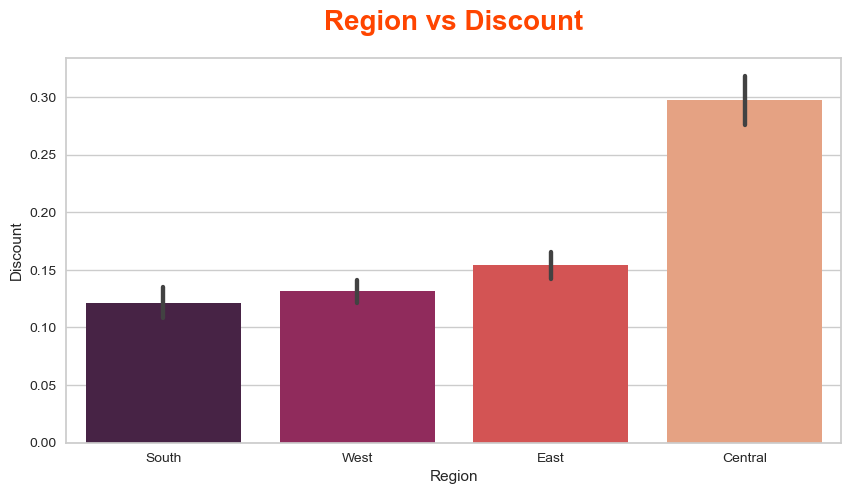

In [27]:
plt.figure(figsize=(10,5))
sns.barplot(x='Region',y='Discount',data=df,palette='rocket')
plt.title('Region vs Discount',pad=20,fontsize=20,fontweight='bold',color='orangered')
plt.show()

A substantial discount was offered on the orders made in the Central region whereas the least discount was given on those made in the South region.

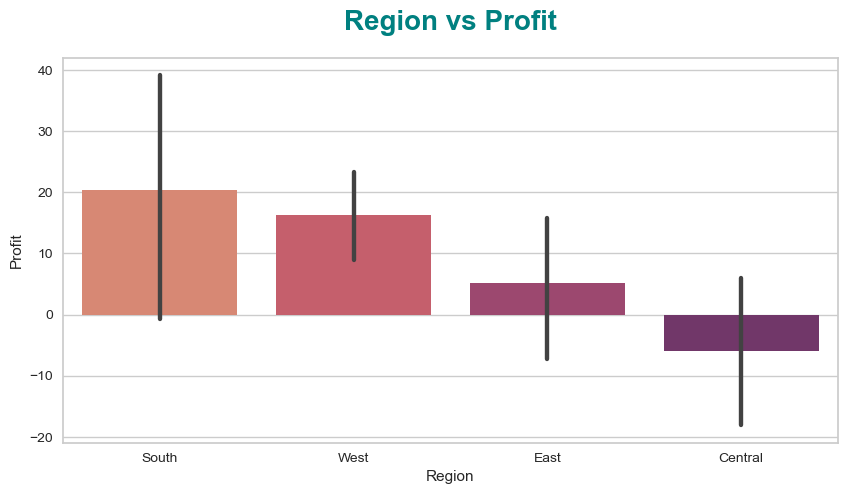

In [28]:
plt.figure(figsize=(10,5))
sns.barplot(x='Region',y='Profit',data=df,palette='flare')
plt.title('Region vs Profit',pad=20,fontsize=20,fontweight='bold',color='teal')
plt.show()

The largest profit was recorded in the South region while the lowest profit was obtained in the Central region.

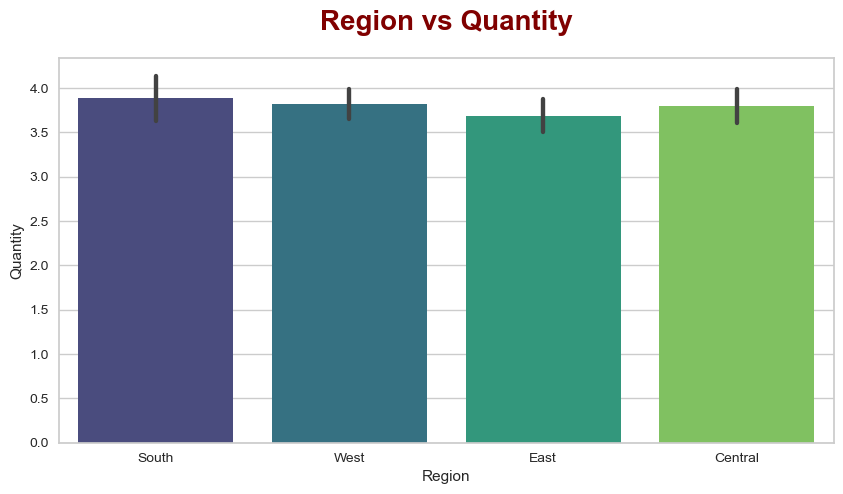

In [29]:
plt.figure(figsize=(10,5))
sns.barplot(x='Region',y='Quantity',data=df,palette='viridis')
plt.title('Region vs Quantity',pad=20,fontsize=20,fontweight='bold',color='maroon')
plt.show()

The highest quantities of products were purchased in the Southern and Western regions whereas the lowest quantities were ordered in the Eastern region. However, there is overall a minimal difference in the quantities of products ordered across all regions.

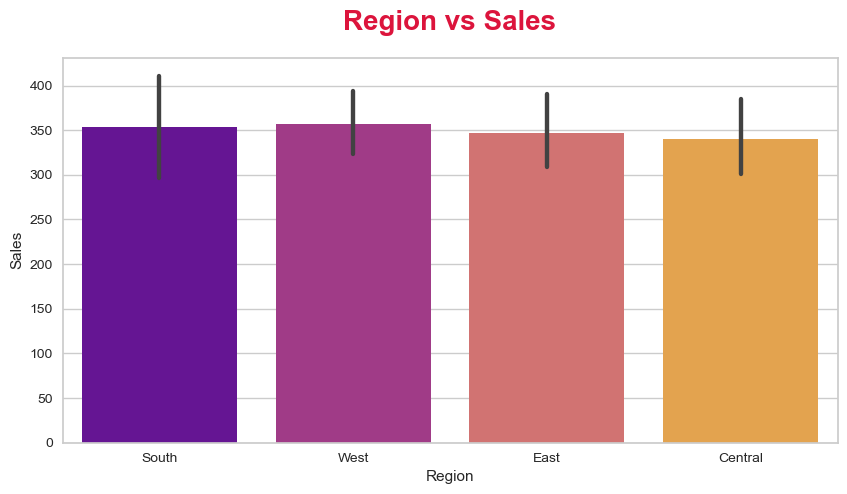

In [30]:
plt.figure(figsize=(10,5))
sns.barplot(x='Region',y='Sales',data=df,palette='plasma')
plt.title('Region vs Sales',pad=20,fontsize=20,fontweight='bold',color='crimson')
plt.show()

The highest sales were recorded in the South and East regions while the lowest sales were observed in the Central region.

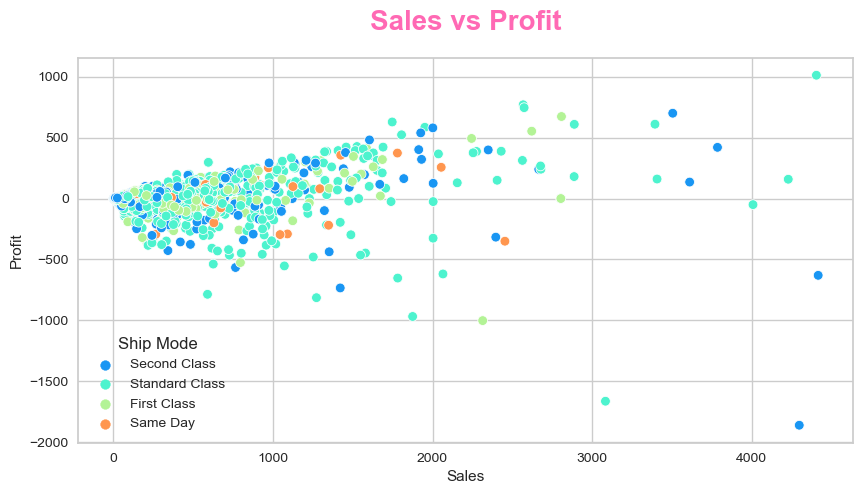

In [31]:
plt.figure(figsize=(10,5))
fig = sns.scatterplot(x='Sales',y='Profit',data=df,hue='Ship Mode',palette='rainbow')
plt.title('Sales vs Profit',pad=20,fontsize=20,fontweight='bold',color='hotpink')
plt.show()


General Trend: There is a positive correlation between sales and profit, meaning higher sales generally lead to higher profits.

Variance: There is significant variance in profit at different sales levels, with some instances of high sales corresponding to negative profits.

Shipping Modes: Different shipping modes show varied profitability. For example, some data points for First Class show negative profits even at higher sales levels.

In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2120 entries, 1 to 9991
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Order Date    2120 non-null   datetime64[ns]
 1   Ship Date     2120 non-null   datetime64[ns]
 2   Ship Mode     2120 non-null   object        
 3   Segment       2120 non-null   object        
 4   City          2120 non-null   object        
 5   State         2120 non-null   object        
 6   Postal Code   2120 non-null   int64         
 7   Region        2120 non-null   object        
 8   Sub-Category  2120 non-null   object        
 9   Product Name  2120 non-null   object        
 10  Sales         2120 non-null   float64       
 11  Quantity      2120 non-null   int64         
 12  Discount      2120 non-null   float64       
 13  Profit        2120 non-null   float64       
dtypes: datetime64[ns](2), float64(3), int64(2), object(7)
memory usage: 248.4+ KB


## Feature Engineering

In [33]:
df['Profit Margin'] = df['Profit']/df['Sales']
df['Discounted Profit'] = df['Profit']-df['Profit']*df['Discount']
df['Discount Percentage'] = df['Discount']/df['Sales']*100
df['Operating Expenses'] = df['Sales'] - df['Profit']
df['Net Profit'] = df['Profit'] - df['Discount']

In [34]:
df['Order Year'] = df['Order Date'].dt.year
df['Order Month'] = df['Order Date'].dt.month
df['Order Day'] = df['Order Date'].dt.day
df['Order Weekday'] = df['Order Date'].dt.dayofweek
df['Ship Year'] = df['Ship Date'].dt.year
df['Ship Month'] = df['Ship Date'].dt.month
df['Ship Day'] = df['Ship Date'].dt.day
df['Ship Weekday'] = df['Ship Date'].dt.dayofweek
df.drop(['Order Date','Ship Date'],axis=1,inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2120 entries, 1 to 9991
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Ship Mode            2120 non-null   object 
 1   Segment              2120 non-null   object 
 2   City                 2120 non-null   object 
 3   State                2120 non-null   object 
 4   Postal Code          2120 non-null   int64  
 5   Region               2120 non-null   object 
 6   Sub-Category         2120 non-null   object 
 7   Product Name         2120 non-null   object 
 8   Sales                2120 non-null   float64
 9   Quantity             2120 non-null   int64  
 10  Discount             2120 non-null   float64
 11  Profit               2120 non-null   float64
 12  Profit Margin        2120 non-null   float64
 13  Discounted Profit    2120 non-null   float64
 14  Discount Percentage  2120 non-null   float64
 15  Operating Expenses   2120 non-null   float6

# Categerical Encoding

In [35]:
categorical_columns = ['Ship Mode', 'Segment', 'City', 'State', 'Region','Sub-Category']
label_encoder = LabelEncoder()
for column in categorical_columns:
    df[column] = label_encoder.fit_transform(df[column])

In [36]:
def onehotencode(data: pd.DataFrame,col: str) -> pd.DataFrame:
    encoder = OneHotEncoder(drop='first',sparse_output=False,max_categories=10)
    encoded_data = encoder.fit_transform(data[[col]])
    encoded_data = pd.DataFrame(encoded_data,columns=encoder.get_feature_names_out())
    return encoded_data

In [37]:
for col in ['Ship Mode','Segment','State','City','Region','Sub-Category','Product Name']:
    encoded_data = onehotencode(df,col)
    df = pd.concat([df,encoded_data],axis=1)
    df.drop(col,axis=1,inplace=True)

In [38]:
transformer = ColumnTransformer(transformers=[
    ('log_transform',FunctionTransformer(np.log1p),['Quantity','Profit','Discounted Profit','Net Profit']),
    ('sqrt_transform',FunctionTransformer(np.sqrt),['Discount']),
    ('power_transform',PowerTransformer(),['Profit Margin','Discount Percentage','Operating Expenses'])
],remainder='passthrough')
transformer

ColumnTransformer(remainder='passthrough',
                  transformers=[('log_transform',
                                 FunctionTransformer(func=<ufunc 'log1p'>),
                                 ['Quantity', 'Profit', 'Discounted Profit',
                                  'Net Profit']),
                                ('sqrt_transform',
                                 FunctionTransformer(func=<ufunc 'sqrt'>),
                                 ['Discount']),
                                ('power_transform', PowerTransformer(),
                                 ['Profit Margin', 'Discount Percentage',
                                  'Operating Expenses'])])

### Feature Transformation

In [39]:
skewed_cols = ['Quantity',
 'Discount',
 'Profit',
 'Profit Margin',
 'Discounted Profit',
 'Discount Percentage',
 'Operating Expenses',
 'Net Profit',
 'Order Day',
 'Order Weekday',
 'Order Month',
 'Ship Day']

Skewness of Quantity: 1.344664480025432
Kurtosis of Quantity: 2.219889224439534


posx and posy should be finite values
posx and posy should be finite values


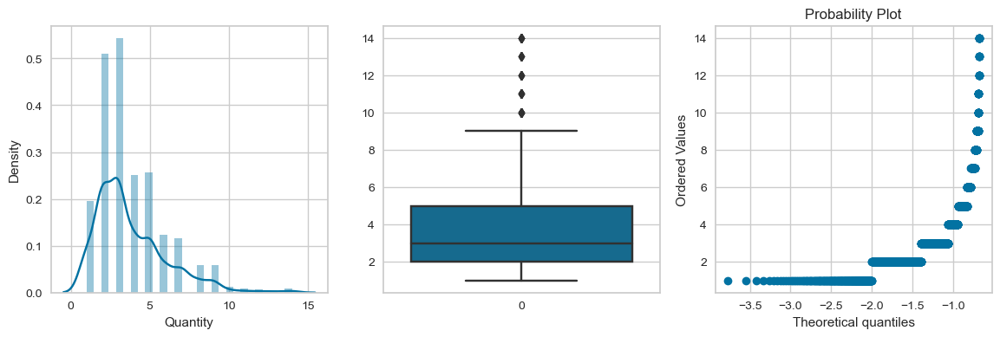

Skewness of Discount: 0.9429737723740191
Kurtosis of Discount: 0.22054787047311342


posx and posy should be finite values
posx and posy should be finite values


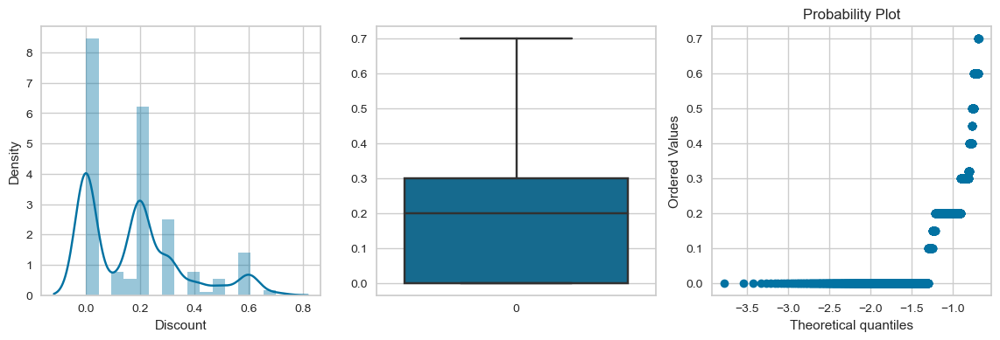

Skewness of Profit: -2.2851695502891607
Kurtosis of Profit: 36.98609990779247


posx and posy should be finite values
posx and posy should be finite values


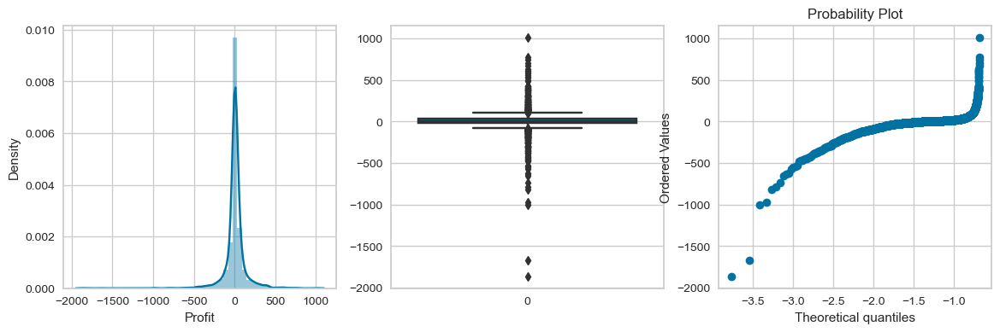

Skewness of Profit Margin: -1.8845772132984566
Kurtosis of Profit Margin: 5.319767654528766


posx and posy should be finite values
posx and posy should be finite values


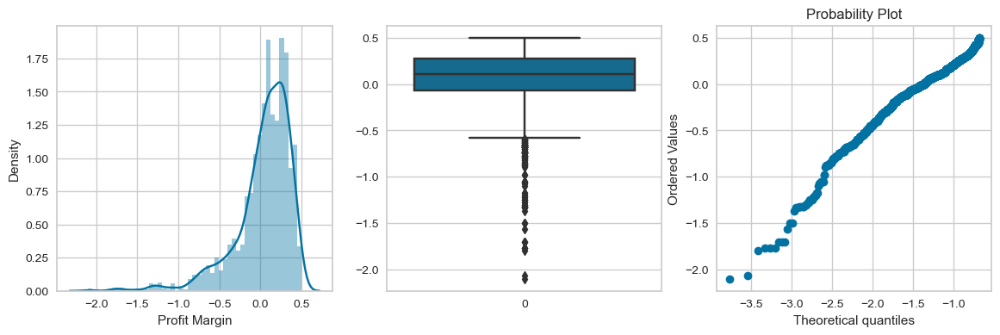

Skewness of Discounted Profit: 1.0000669022694124
Kurtosis of Discounted Profit: 22.300585911035377


posx and posy should be finite values
posx and posy should be finite values


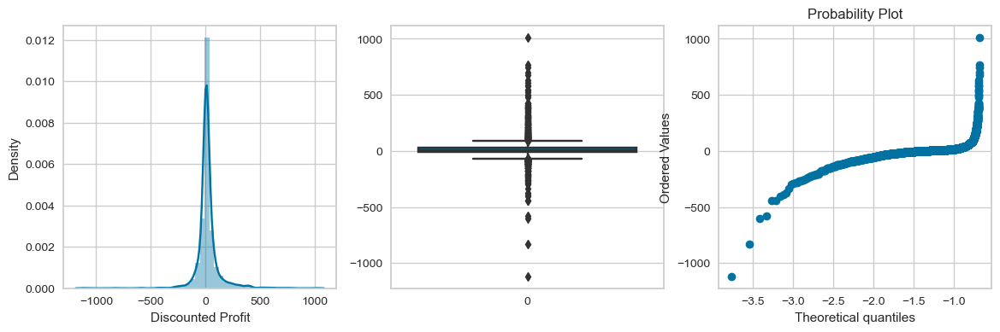

Skewness of Discount Percentage: 9.84839960227529
Kurtosis of Discount Percentage: 126.02346273087481


posx and posy should be finite values
posx and posy should be finite values


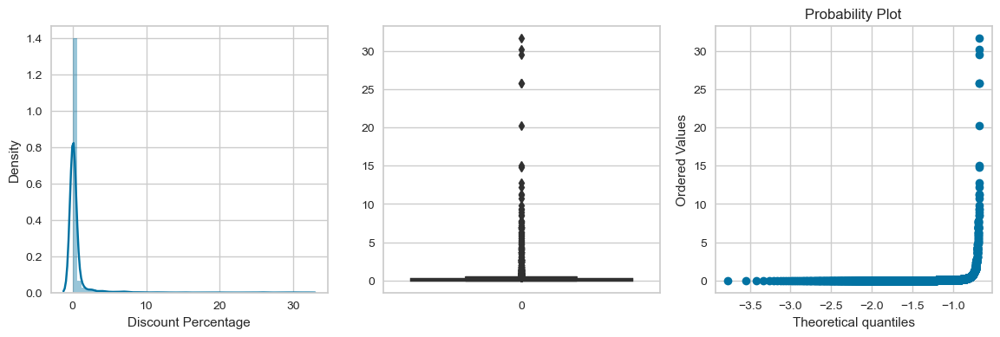

Skewness of Operating Expenses: 3.821283775559385
Kurtosis of Operating Expenses: 24.052444835690167


posx and posy should be finite values
posx and posy should be finite values


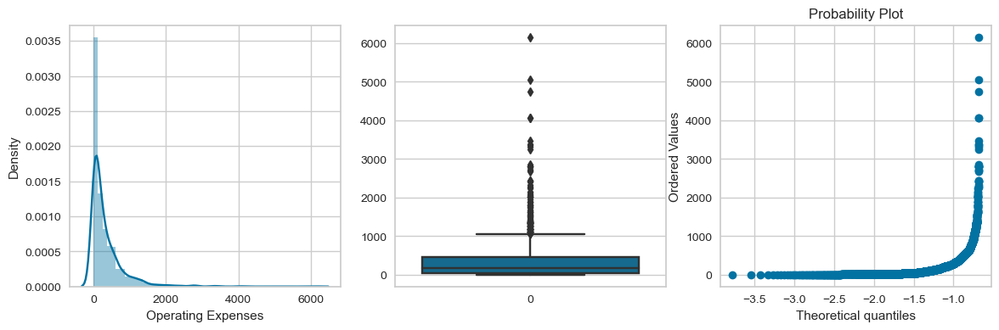

Skewness of Net Profit: -2.2828429999208937
Kurtosis of Net Profit: 36.917583988232295


posx and posy should be finite values
posx and posy should be finite values


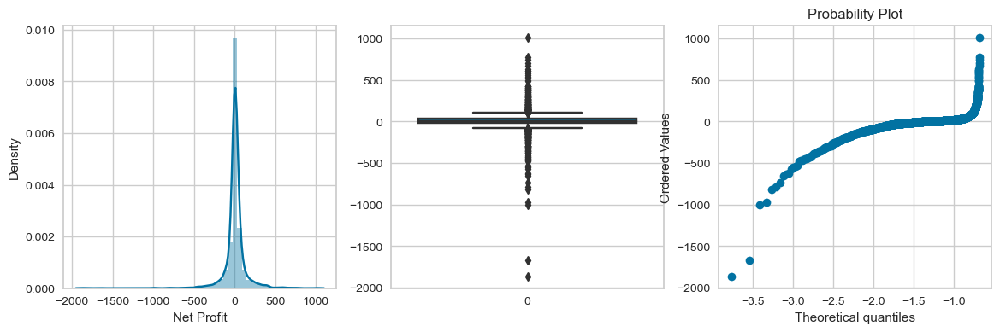

Skewness of Order Day: -0.003445134959434103
Kurtosis of Order Day: -1.1819971838266976


posx and posy should be finite values
posx and posy should be finite values


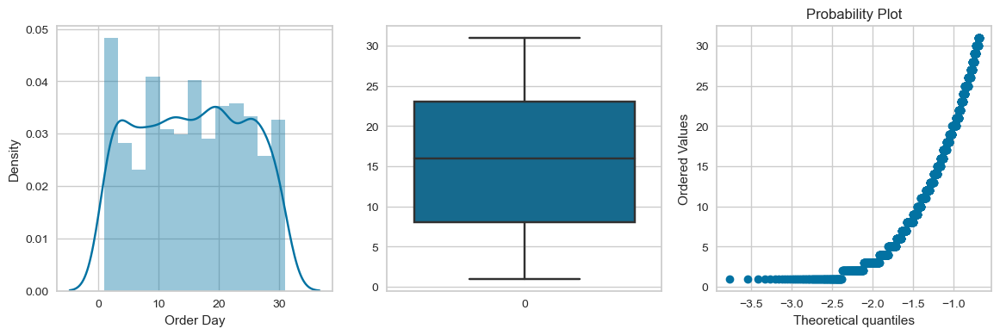

Skewness of Order Weekday: -0.20673219934545864
Kurtosis of Order Weekday: -1.343229360952844


posx and posy should be finite values
posx and posy should be finite values


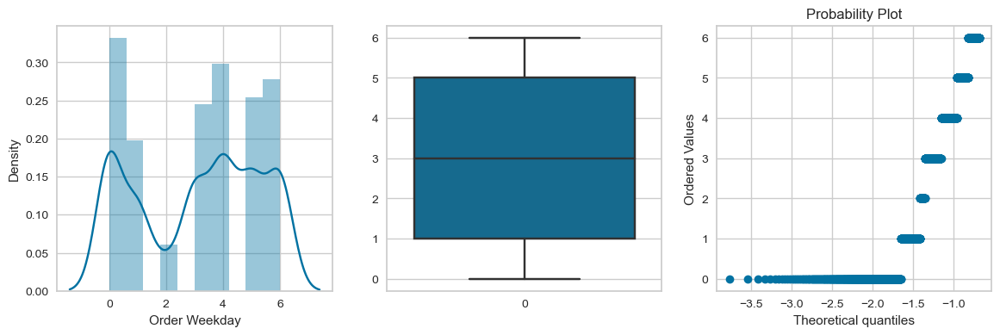

Skewness of Order Month: -0.4708398772355008
Kurtosis of Order Month: -0.9683209897543938


posx and posy should be finite values
posx and posy should be finite values


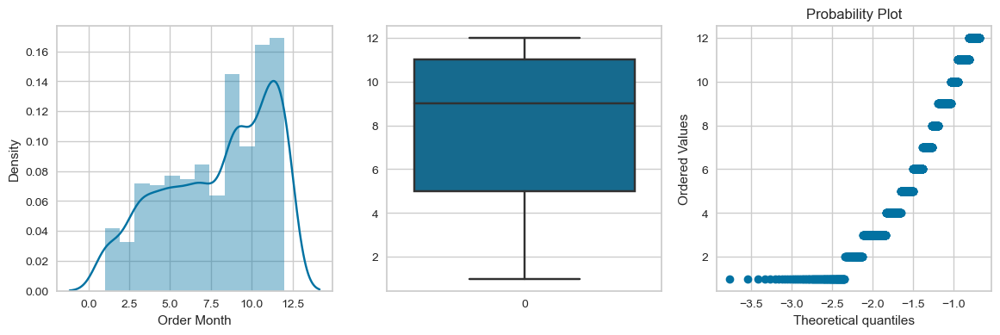

Skewness of Ship Day: -0.010846879815162325
Kurtosis of Ship Day: -1.1909747202007392


posx and posy should be finite values
posx and posy should be finite values


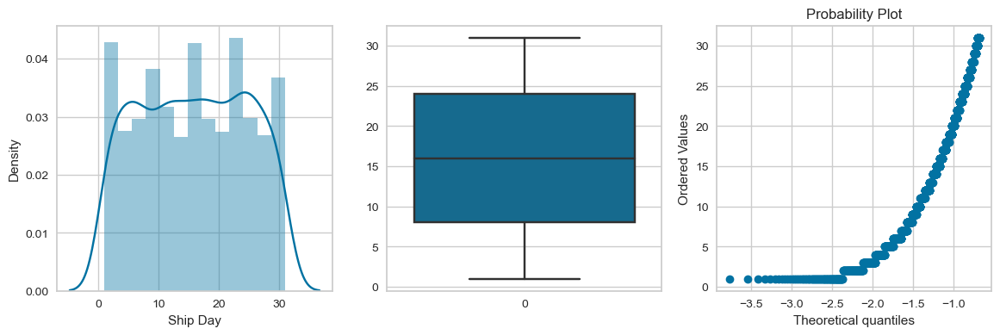

In [40]:
for col in skewed_cols:
    print(f"Skewness of {col}:",df[col].skew())
    print(f"Kurtosis of {col}:",df[col].kurt())
    plt.subplots(nrows=1,ncols=2,figsize=(14,4))
    plt.subplot(1,3,1)
    sns.distplot(df[col])
    plt.subplot(1,3,2)
    sns.boxplot(df[col])
    plt.subplot(1,3,3)
    probplot(df[col],plot=plt,dist='norm',rvalue=True)
    plt.show()

In [41]:
def apply_transform(data,col,transformer):
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    sns.distplot(data[col])
    plt.subplot(132)
    sns.boxplot(data[col])
    plt.subplot(133)
    probplot(data[col],rvalue=True,dist='norm',plot=plt)
    plt.suptitle(f"{col} Before Transform")
    plt.show()
    col_tf = transformer.fit_transform(data[[col]])
    col_tf = np.array(col_tf).reshape(col_tf.shape[0])
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    sns.distplot(col_tf)
    plt.subplot(132)
    sns.boxplot(col_tf)
    plt.subplot(133)
    probplot(col_tf,rvalue=True,dist='norm',plot=plt)
    plt.suptitle(f"{col} After Transform")
    plt.show()
    gc.collect();

posx and posy should be finite values
posx and posy should be finite values


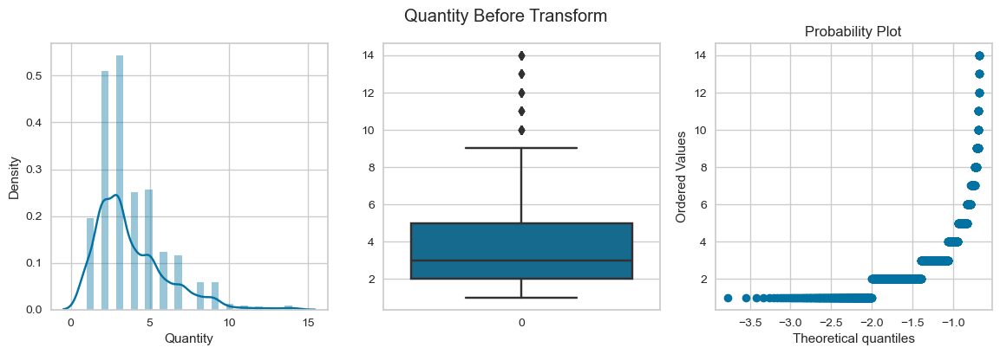

posx and posy should be finite values
posx and posy should be finite values


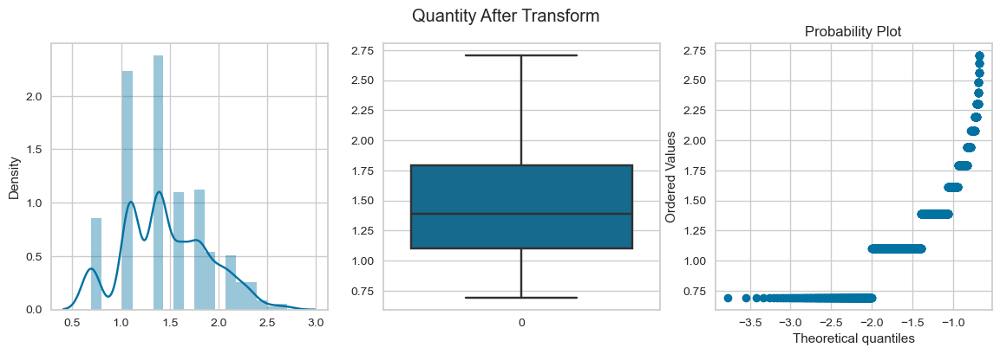

posx and posy should be finite values
posx and posy should be finite values


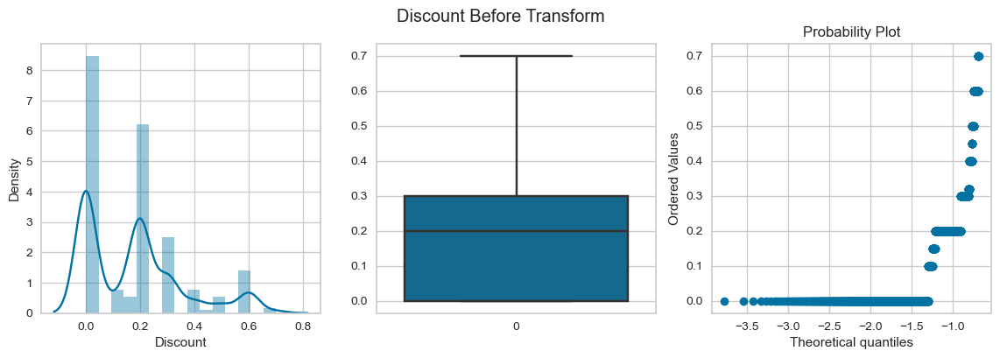

posx and posy should be finite values
posx and posy should be finite values


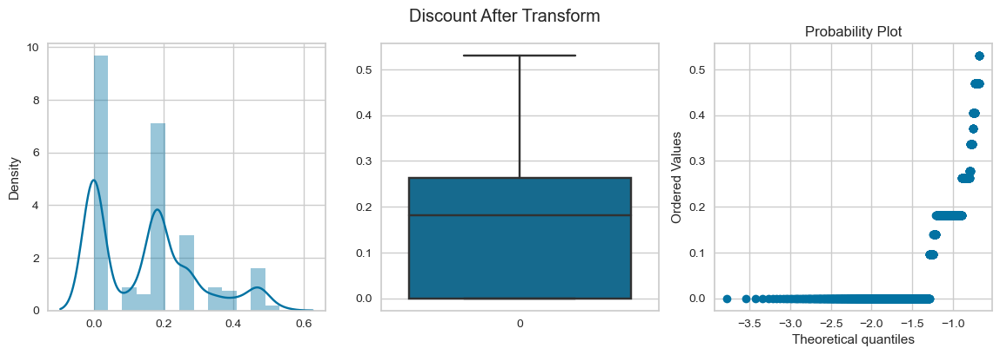

posx and posy should be finite values
posx and posy should be finite values


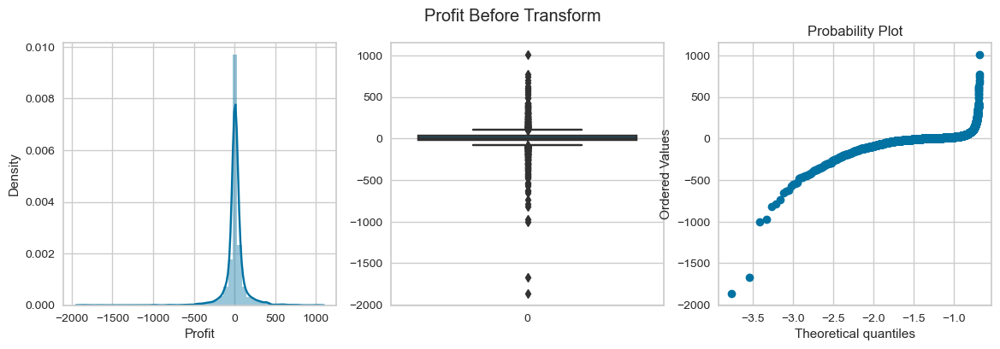

posx and posy should be finite values
posx and posy should be finite values


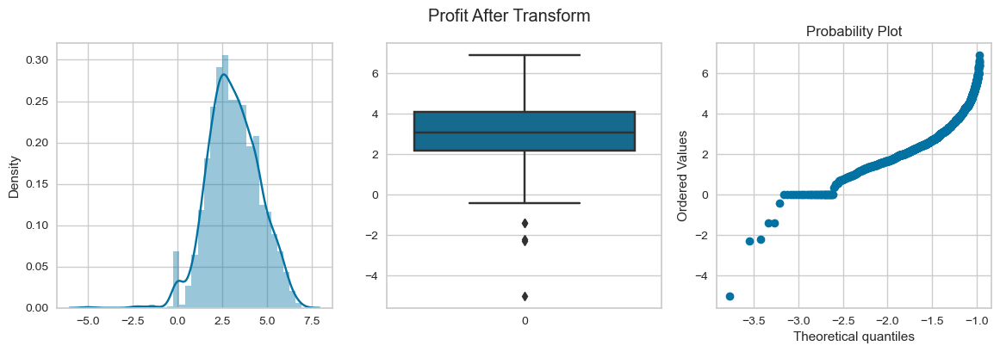

posx and posy should be finite values
posx and posy should be finite values


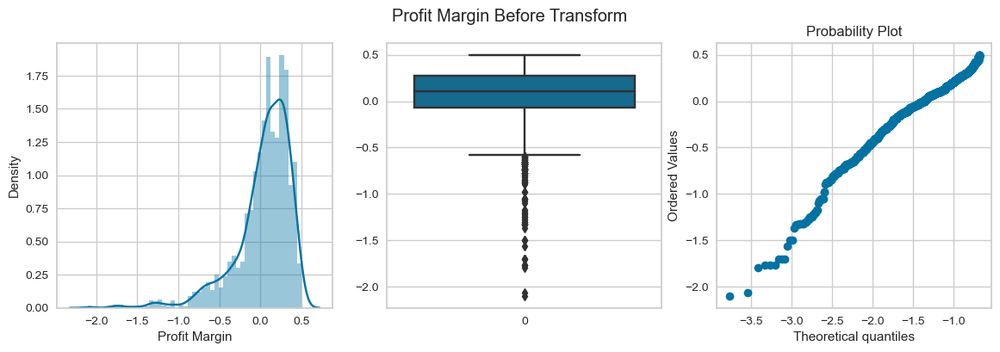

posx and posy should be finite values
posx and posy should be finite values


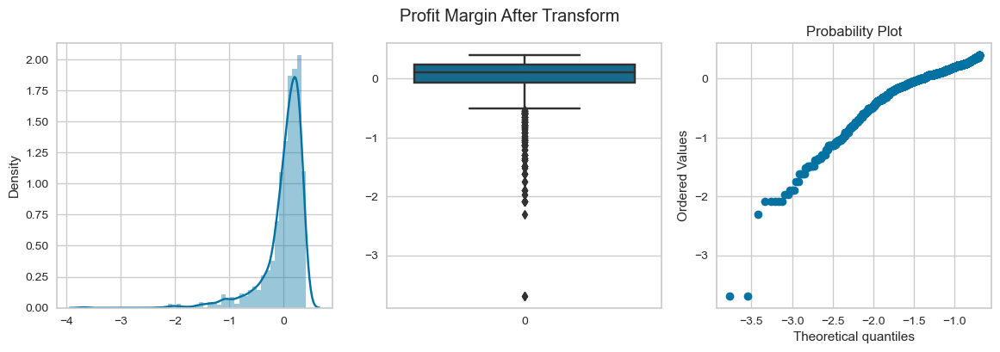

posx and posy should be finite values
posx and posy should be finite values


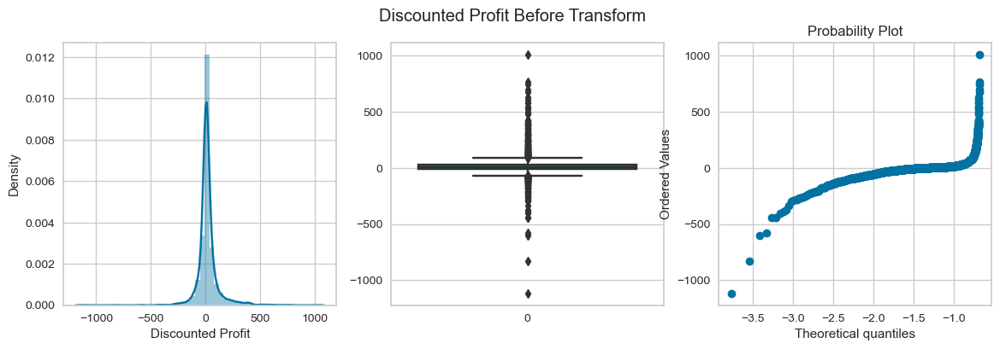

posx and posy should be finite values
posx and posy should be finite values


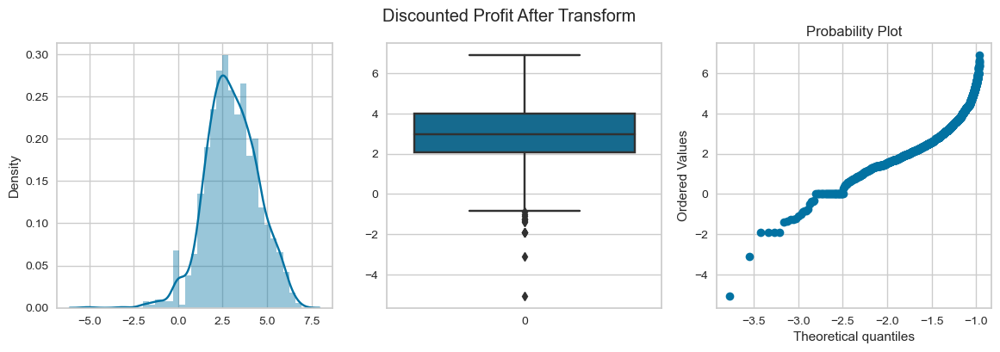

posx and posy should be finite values
posx and posy should be finite values


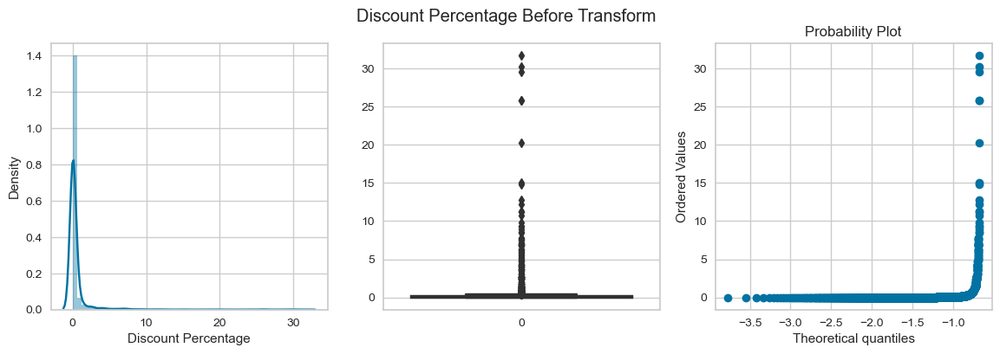

posx and posy should be finite values
posx and posy should be finite values


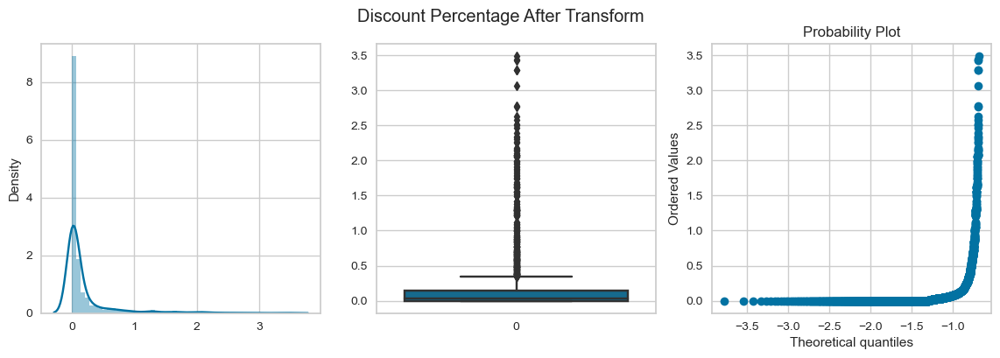

posx and posy should be finite values
posx and posy should be finite values


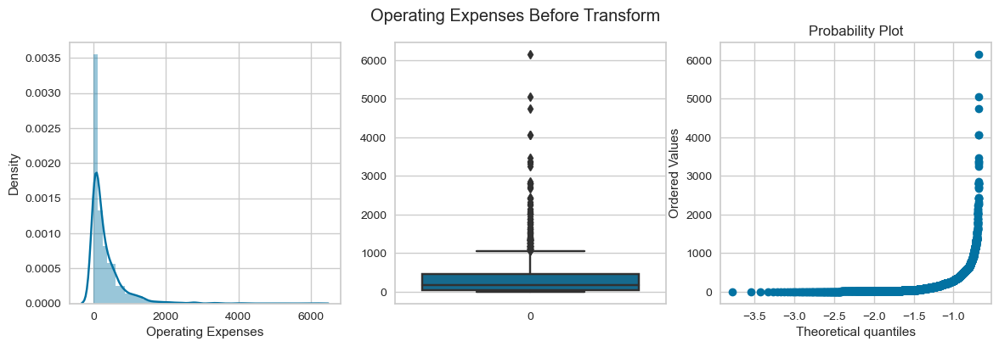

posx and posy should be finite values
posx and posy should be finite values


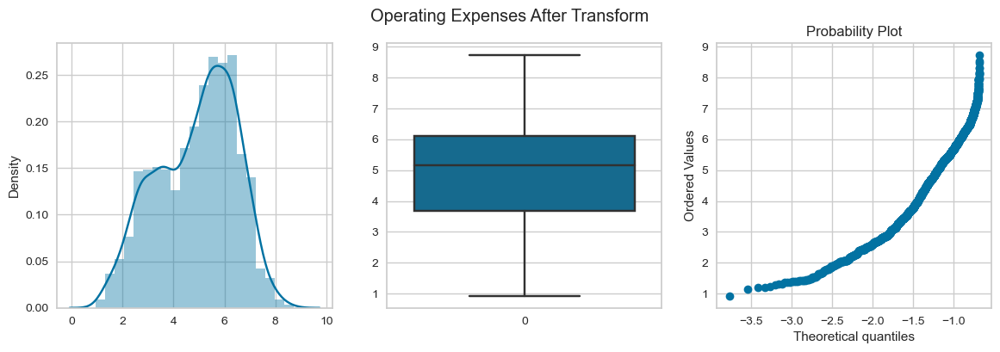

posx and posy should be finite values
posx and posy should be finite values


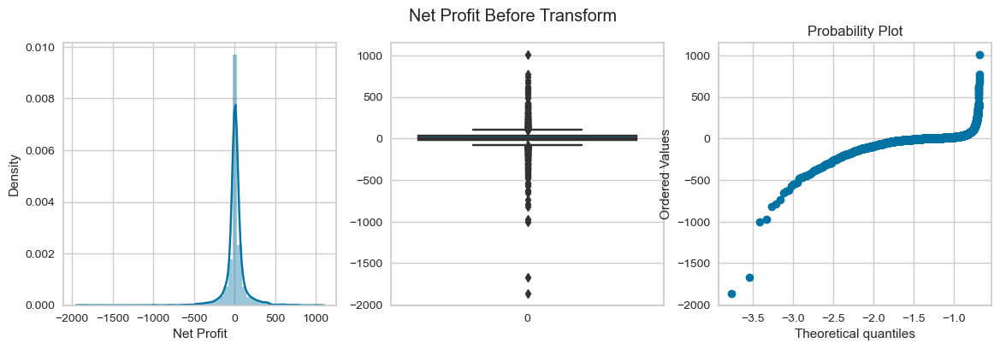

posx and posy should be finite values
posx and posy should be finite values


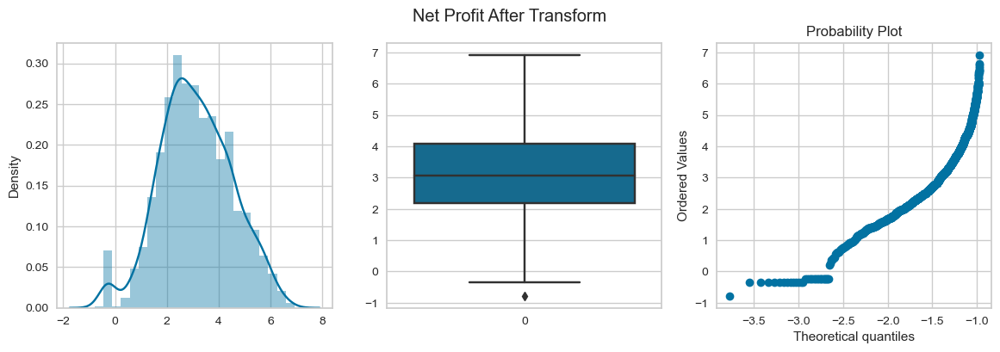

posx and posy should be finite values
posx and posy should be finite values


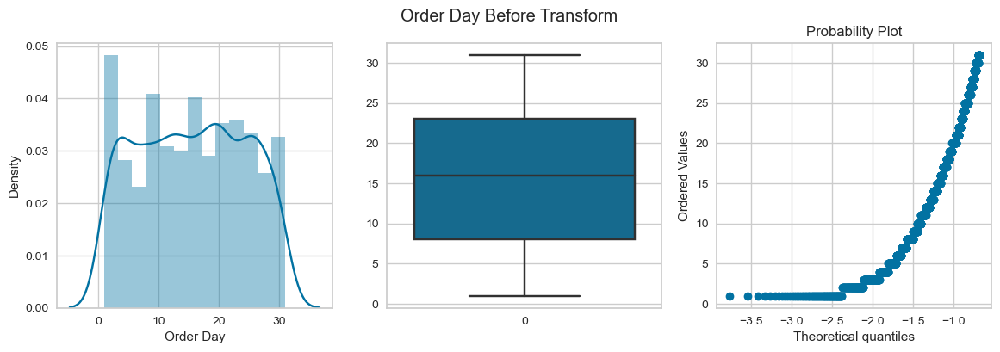

posx and posy should be finite values
posx and posy should be finite values


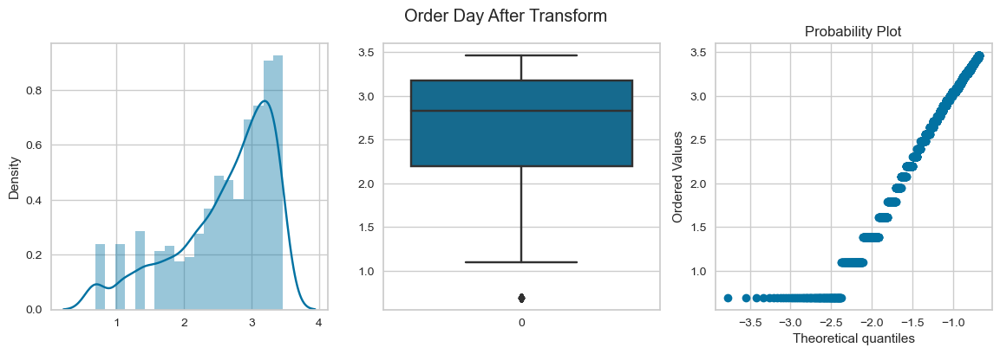

posx and posy should be finite values
posx and posy should be finite values


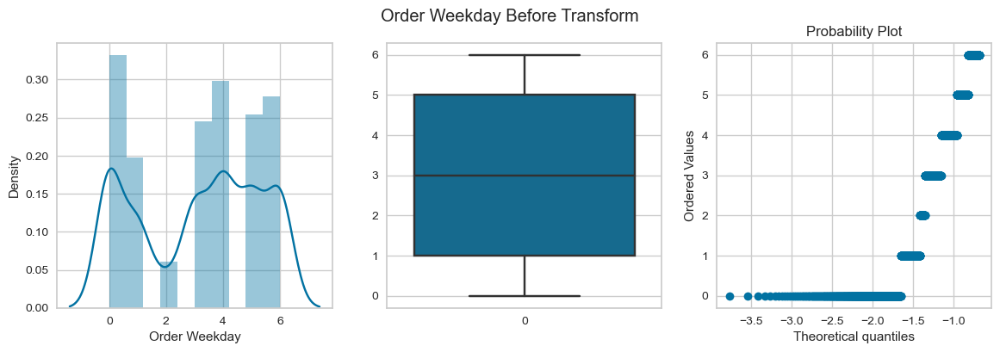

posx and posy should be finite values
posx and posy should be finite values


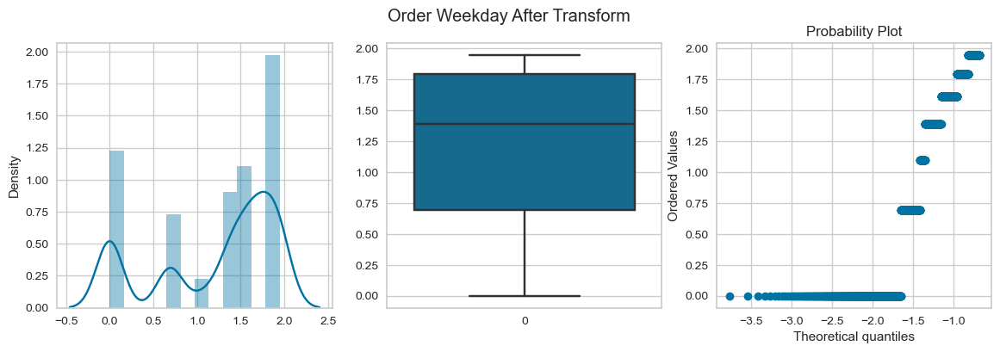

posx and posy should be finite values
posx and posy should be finite values


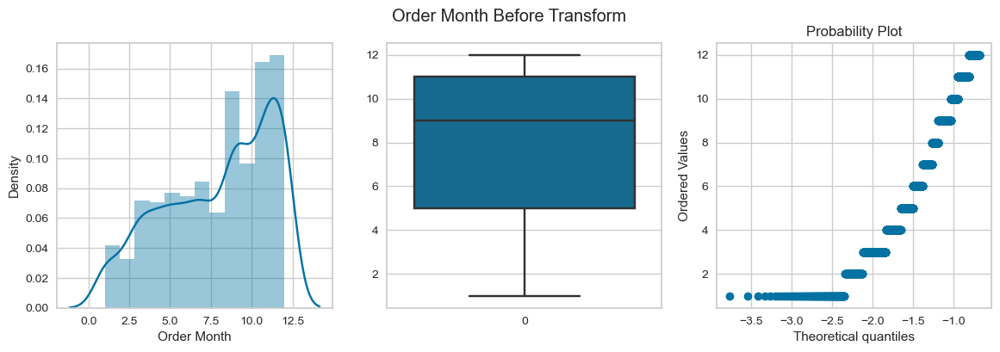

posx and posy should be finite values
posx and posy should be finite values


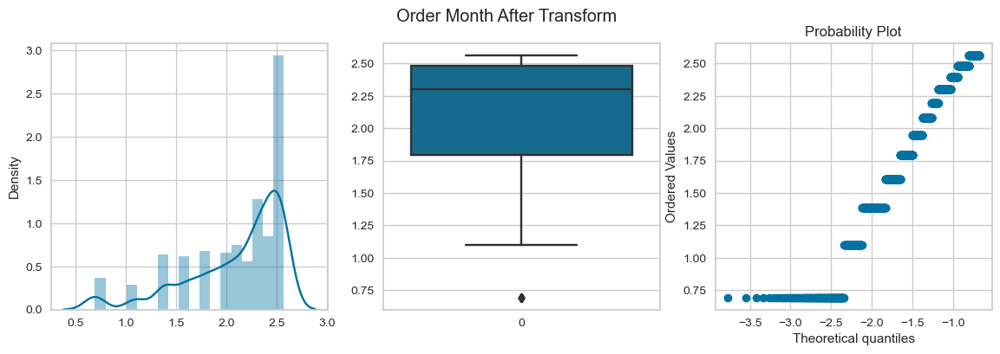

posx and posy should be finite values
posx and posy should be finite values


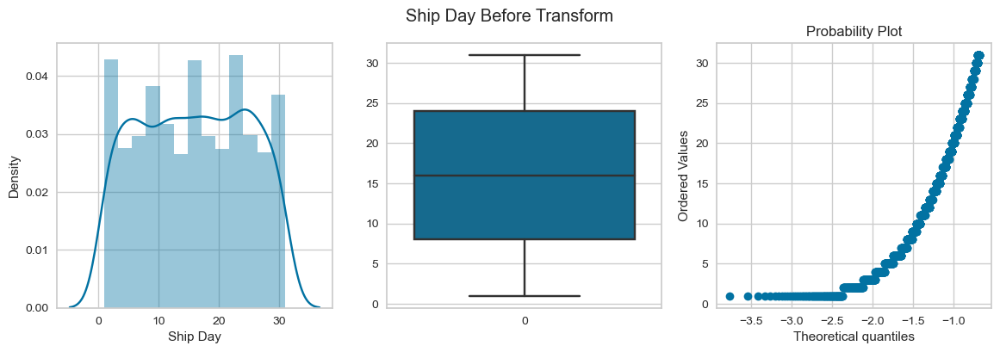

posx and posy should be finite values
posx and posy should be finite values


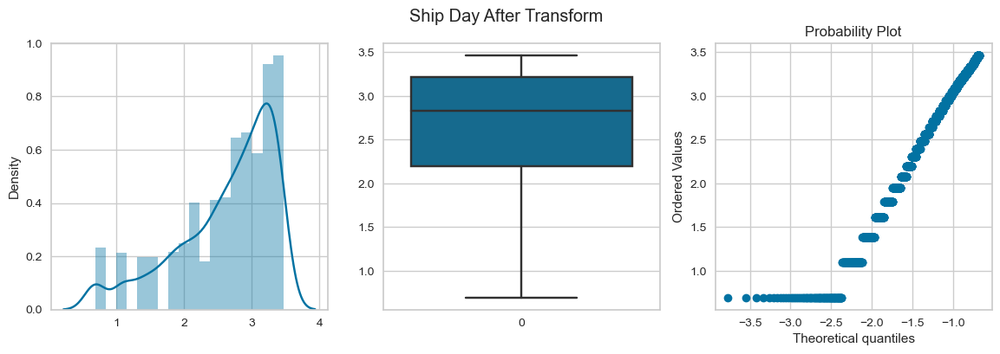

In [42]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(np.log1p))

posx and posy should be finite values
posx and posy should be finite values


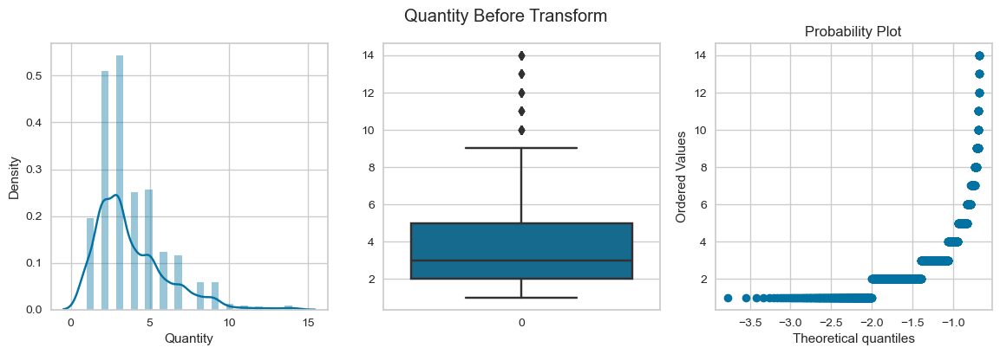

posx and posy should be finite values
posx and posy should be finite values


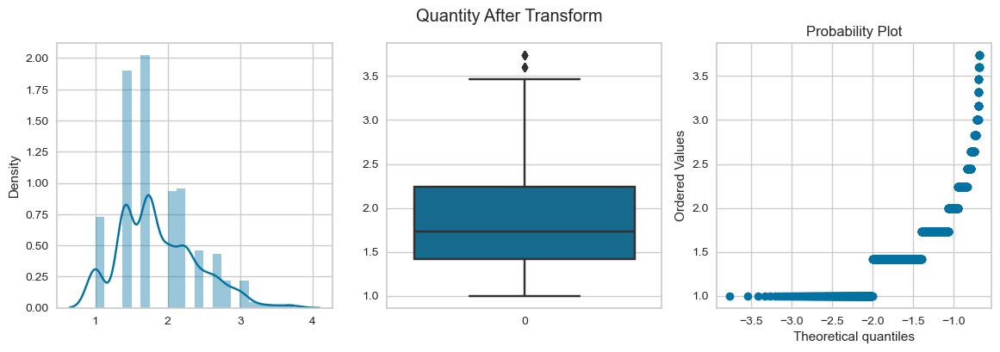

posx and posy should be finite values
posx and posy should be finite values


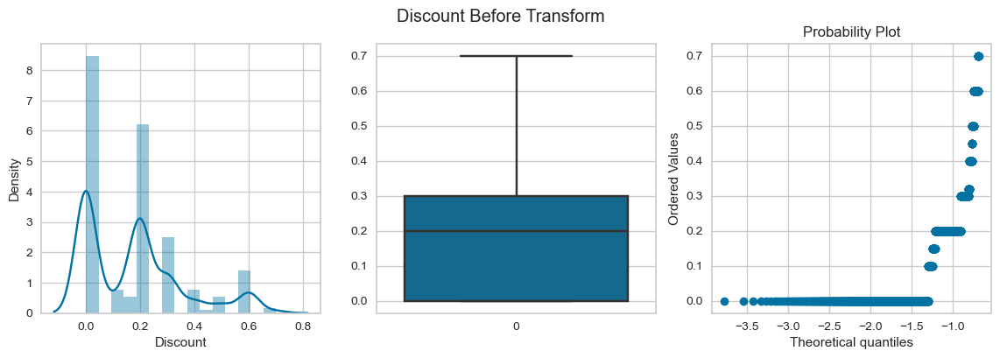

posx and posy should be finite values
posx and posy should be finite values


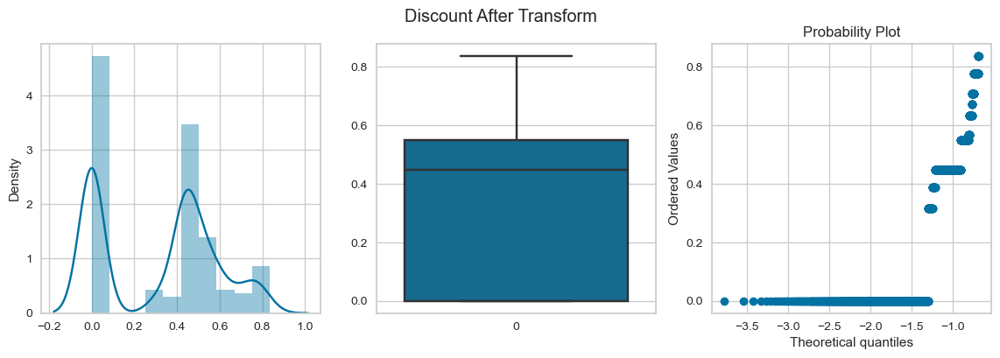

posx and posy should be finite values
posx and posy should be finite values


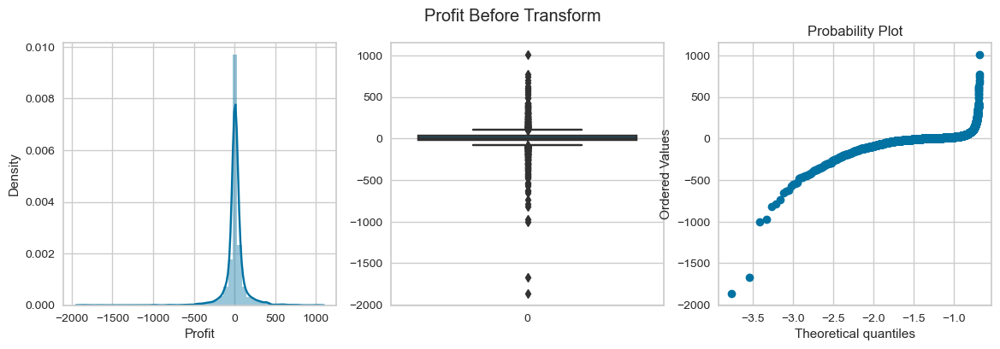

posx and posy should be finite values
posx and posy should be finite values


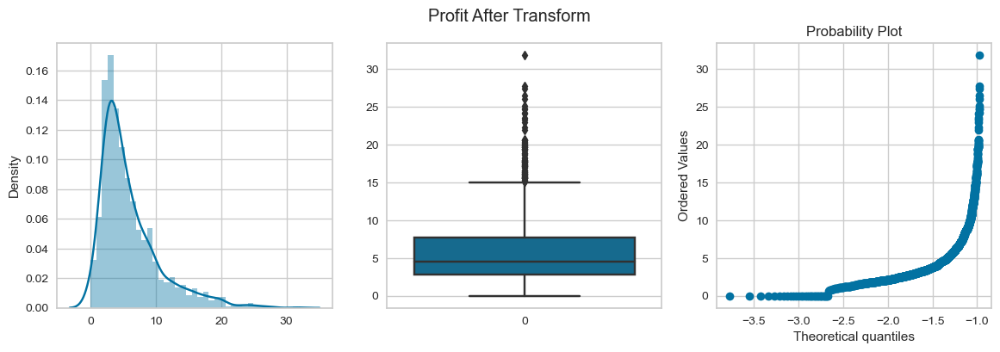

posx and posy should be finite values
posx and posy should be finite values


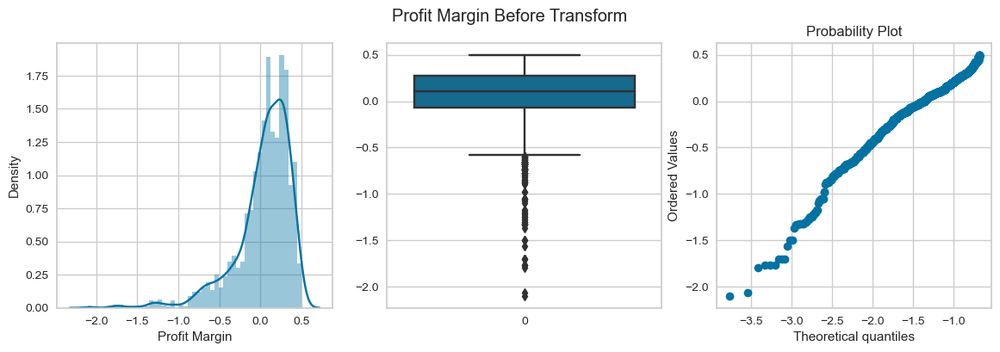

posx and posy should be finite values
posx and posy should be finite values


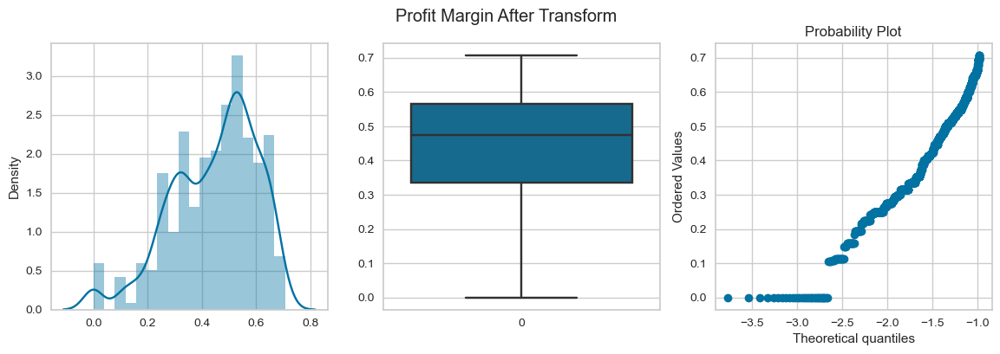

posx and posy should be finite values
posx and posy should be finite values


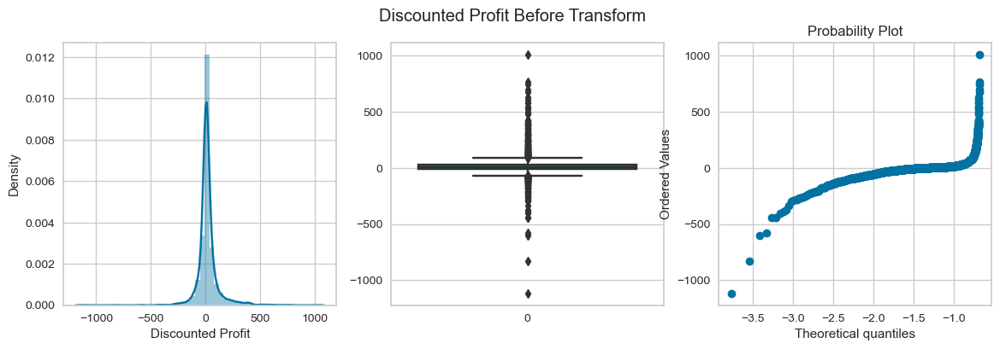

posx and posy should be finite values
posx and posy should be finite values


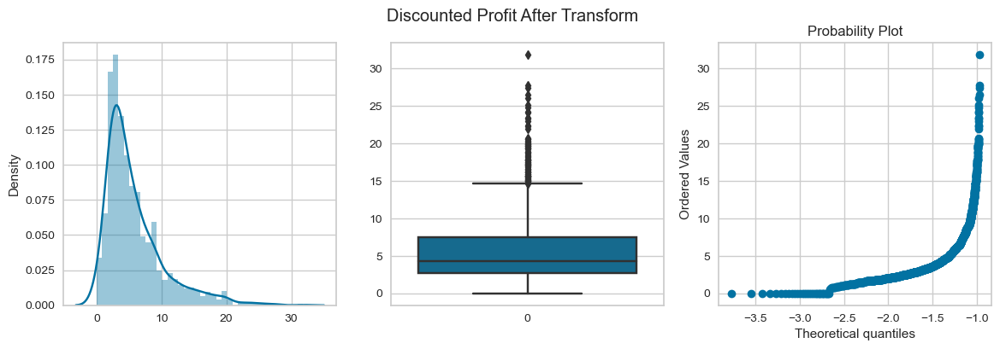

posx and posy should be finite values
posx and posy should be finite values


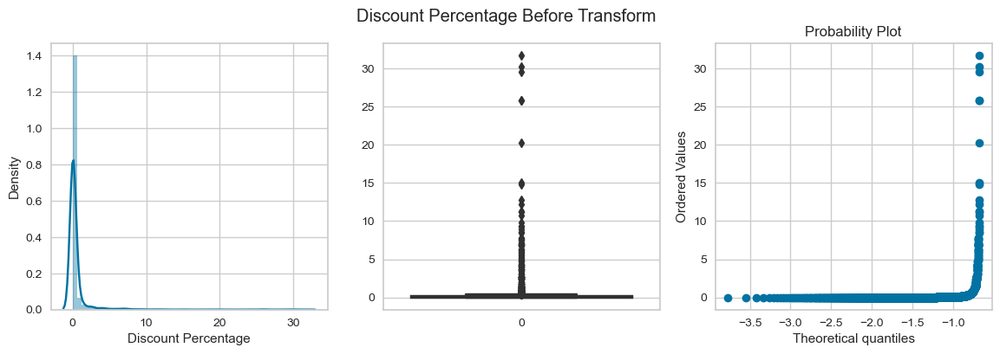

posx and posy should be finite values
posx and posy should be finite values


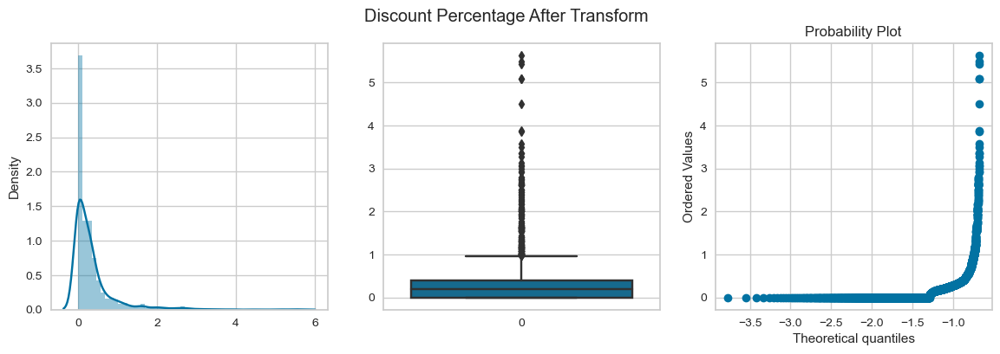

posx and posy should be finite values
posx and posy should be finite values


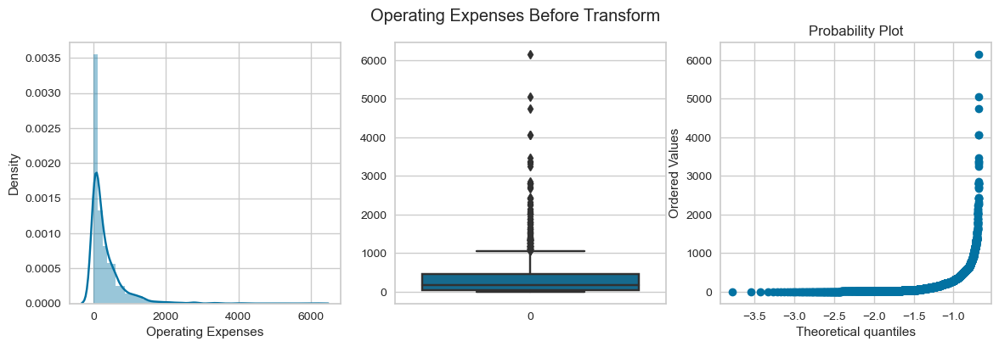

posx and posy should be finite values
posx and posy should be finite values


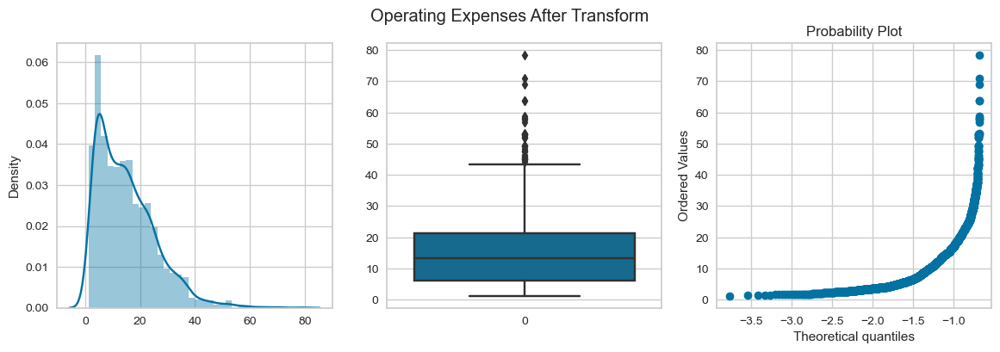

posx and posy should be finite values
posx and posy should be finite values


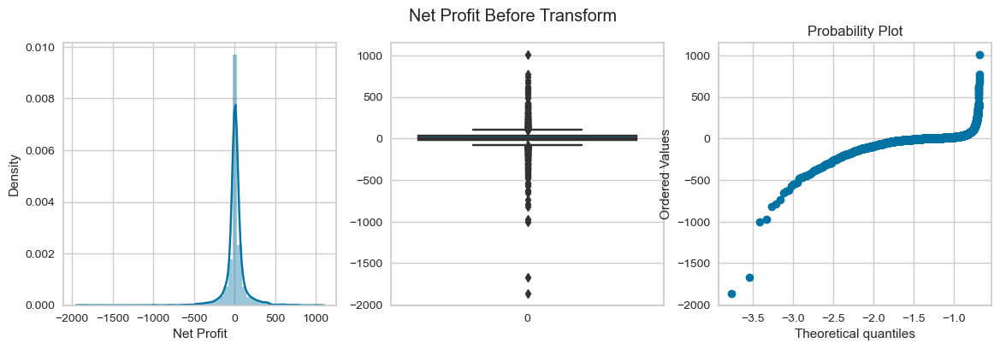

posx and posy should be finite values
posx and posy should be finite values


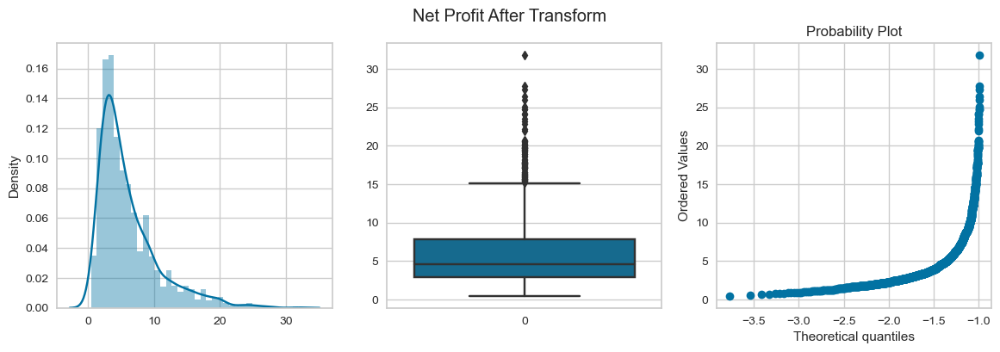

posx and posy should be finite values
posx and posy should be finite values


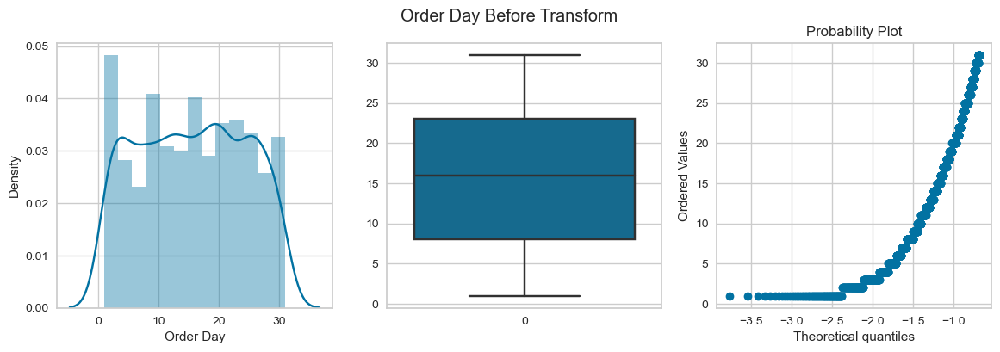

posx and posy should be finite values
posx and posy should be finite values


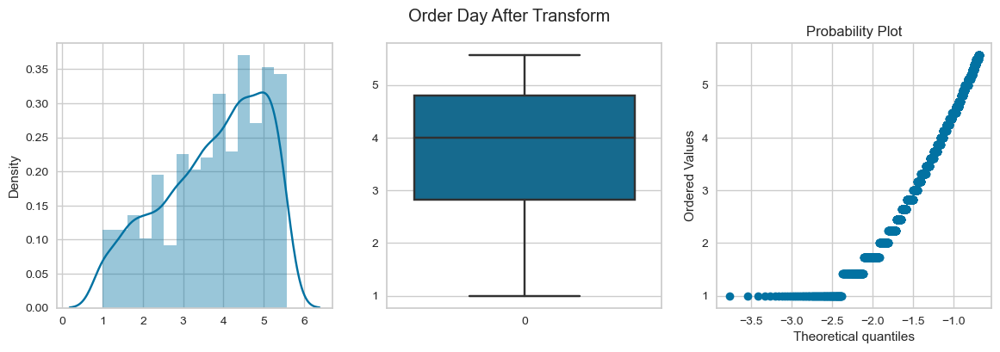

posx and posy should be finite values
posx and posy should be finite values


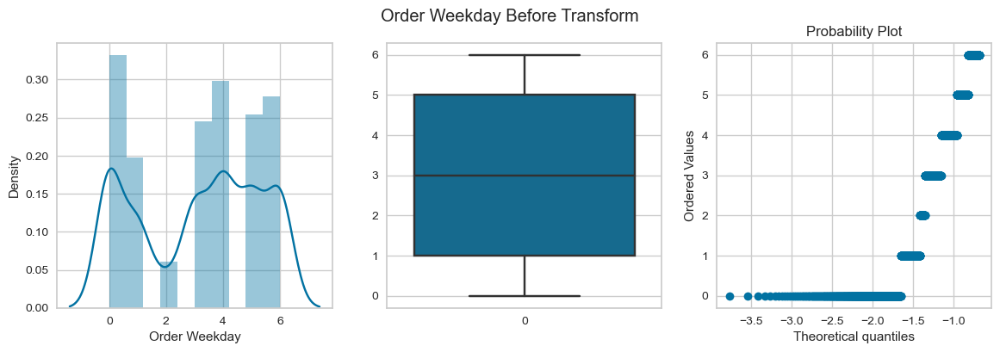

posx and posy should be finite values
posx and posy should be finite values


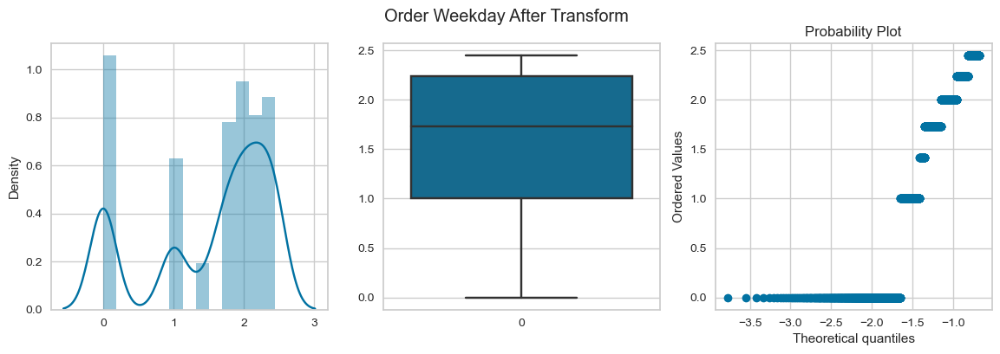

posx and posy should be finite values
posx and posy should be finite values


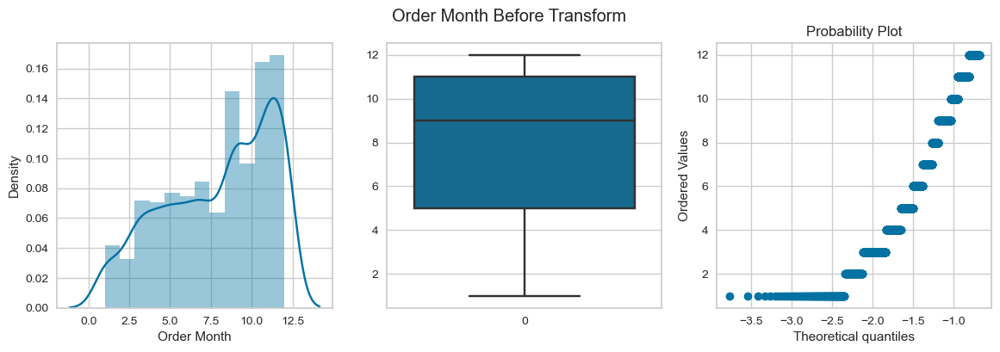

posx and posy should be finite values
posx and posy should be finite values


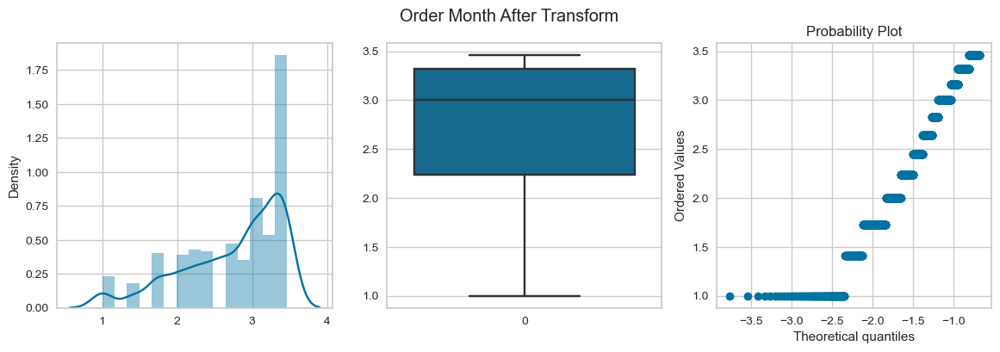

posx and posy should be finite values
posx and posy should be finite values


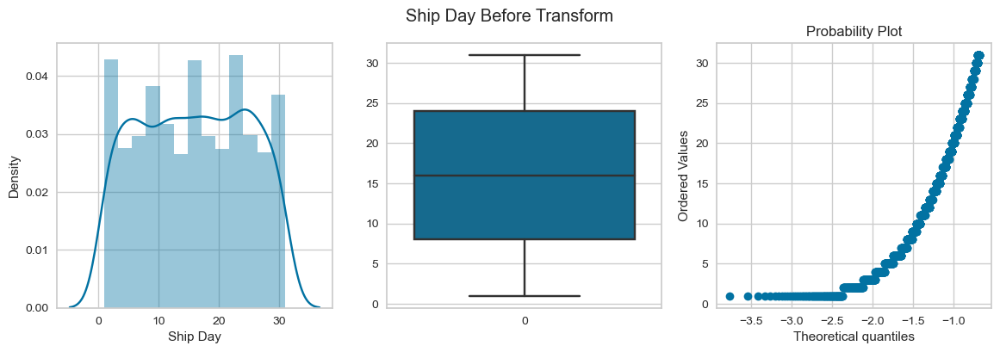

posx and posy should be finite values
posx and posy should be finite values


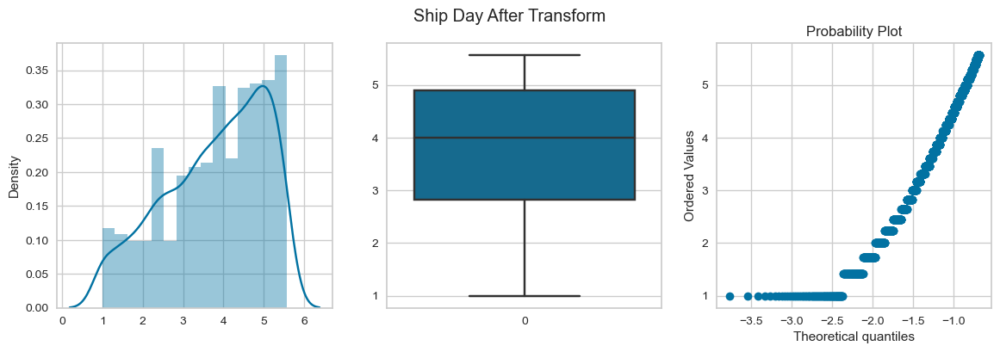

In [43]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(np.sqrt))

posx and posy should be finite values
posx and posy should be finite values


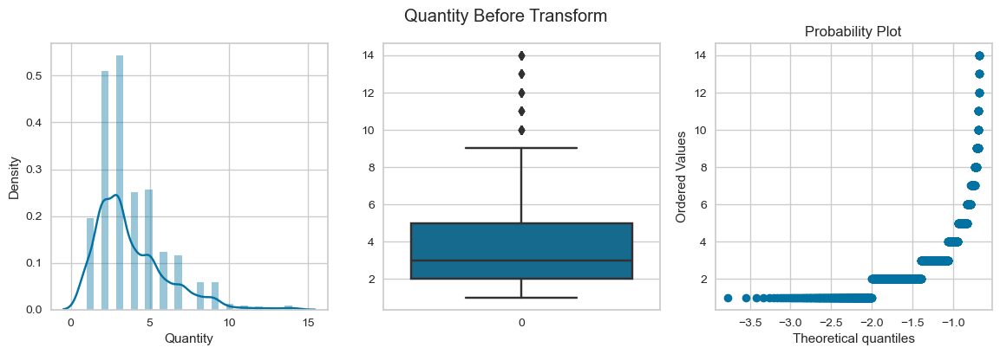

posx and posy should be finite values
posx and posy should be finite values


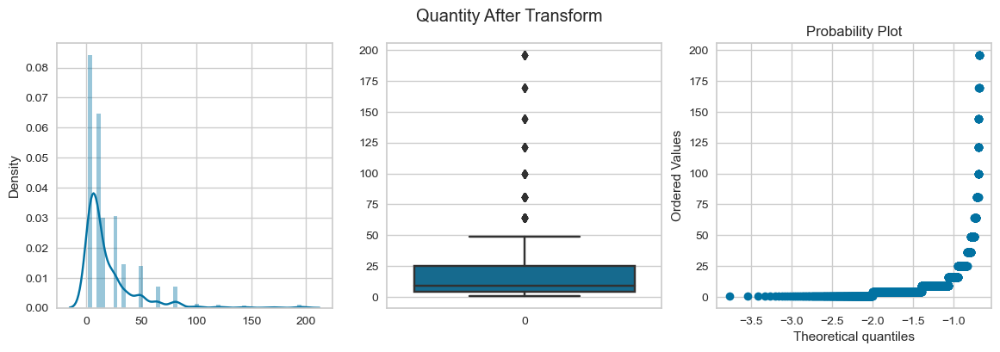

posx and posy should be finite values
posx and posy should be finite values


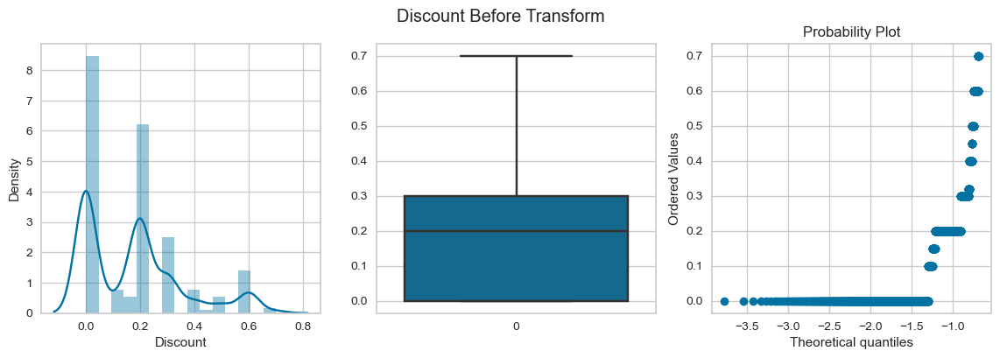

posx and posy should be finite values
posx and posy should be finite values


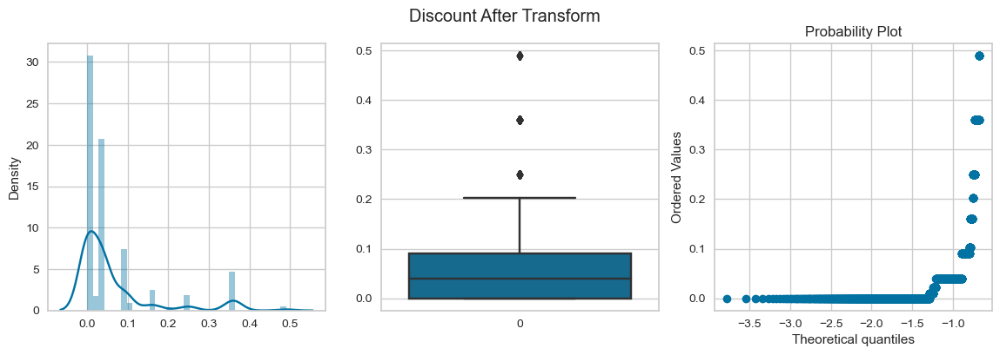

posx and posy should be finite values
posx and posy should be finite values


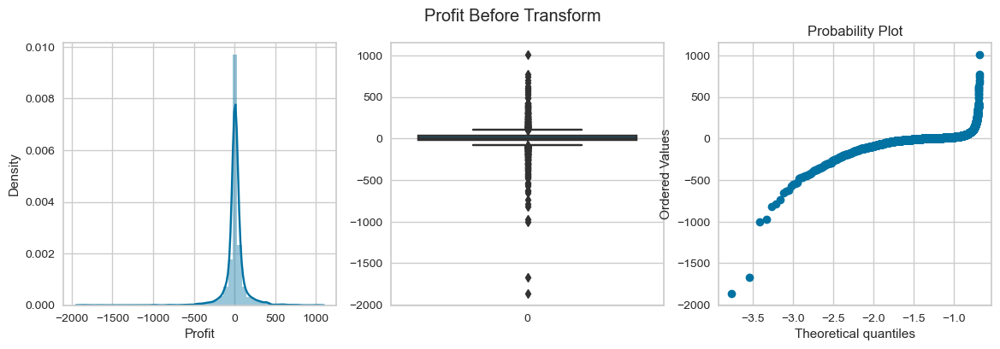

posx and posy should be finite values
posx and posy should be finite values


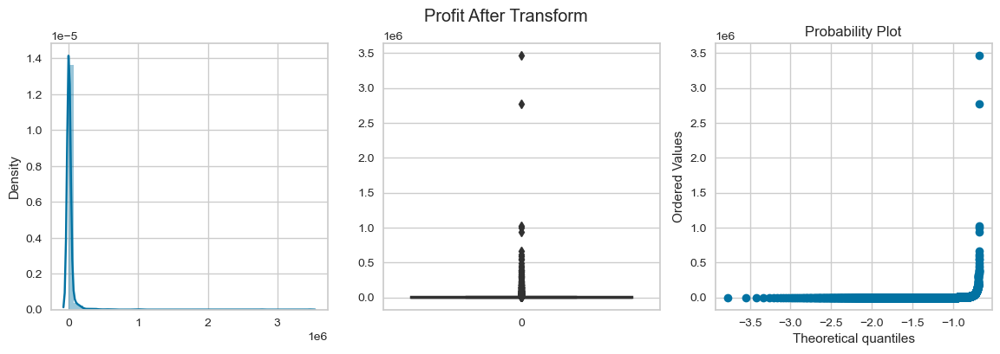

posx and posy should be finite values
posx and posy should be finite values


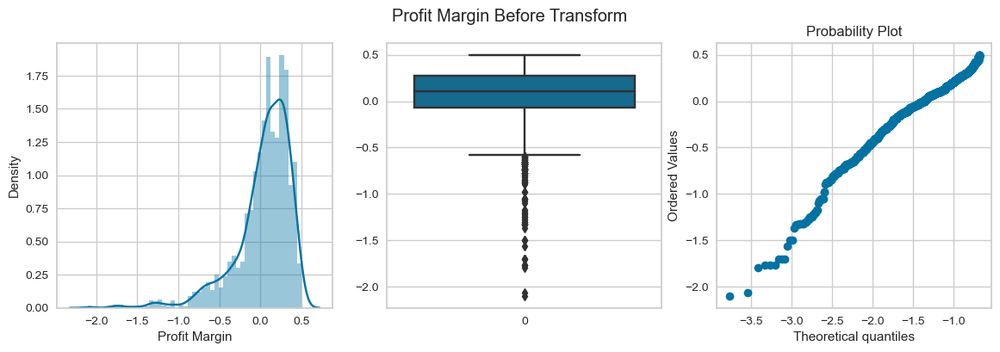

posx and posy should be finite values
posx and posy should be finite values


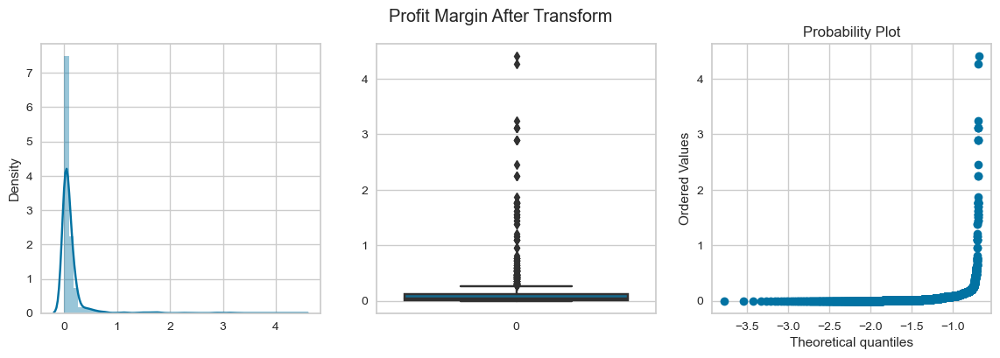

posx and posy should be finite values
posx and posy should be finite values


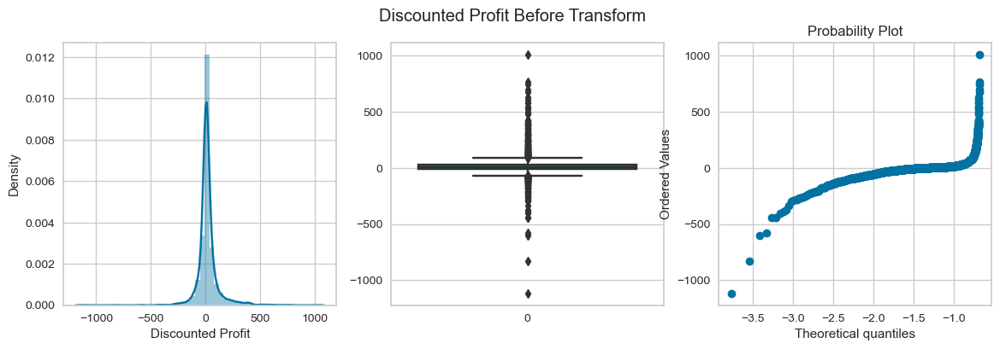

posx and posy should be finite values
posx and posy should be finite values


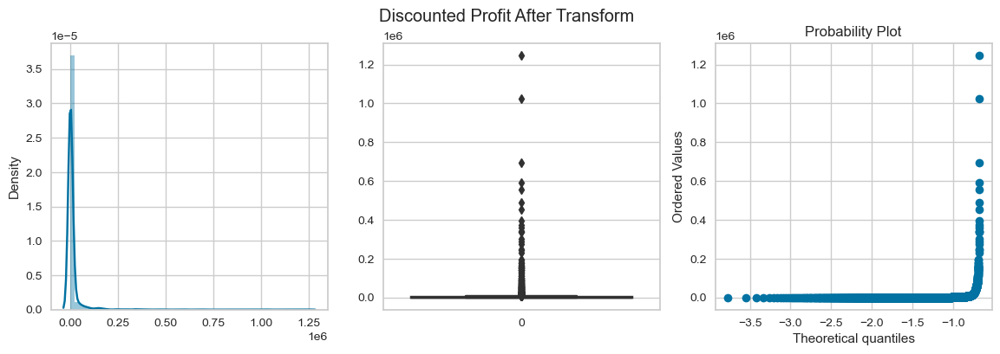

posx and posy should be finite values
posx and posy should be finite values


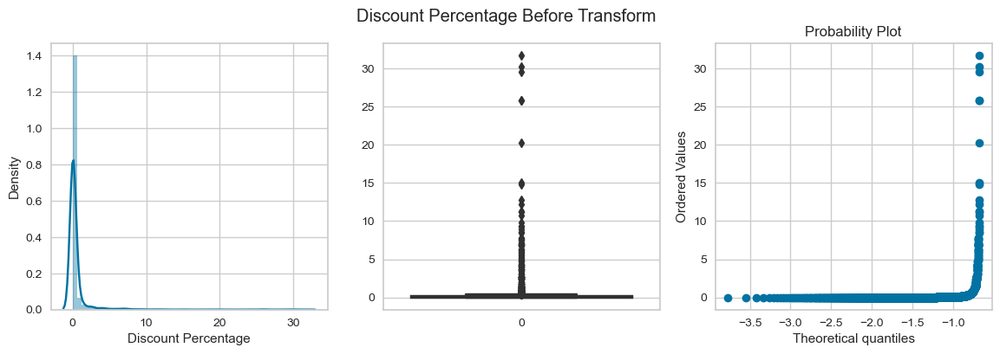

posx and posy should be finite values
posx and posy should be finite values


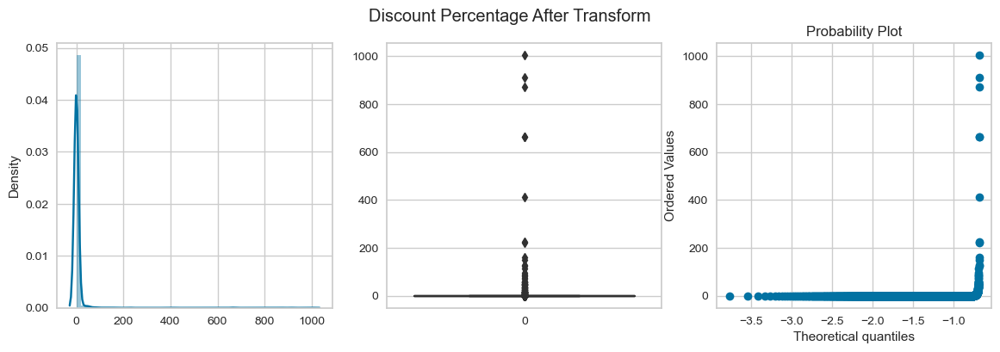

posx and posy should be finite values
posx and posy should be finite values


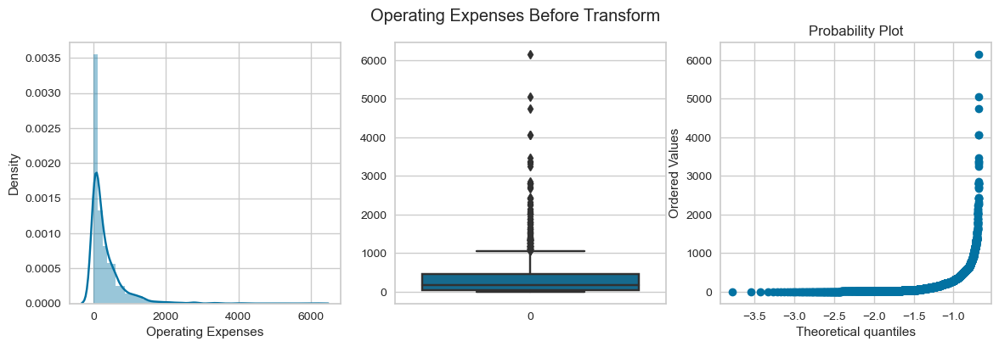

posx and posy should be finite values
posx and posy should be finite values


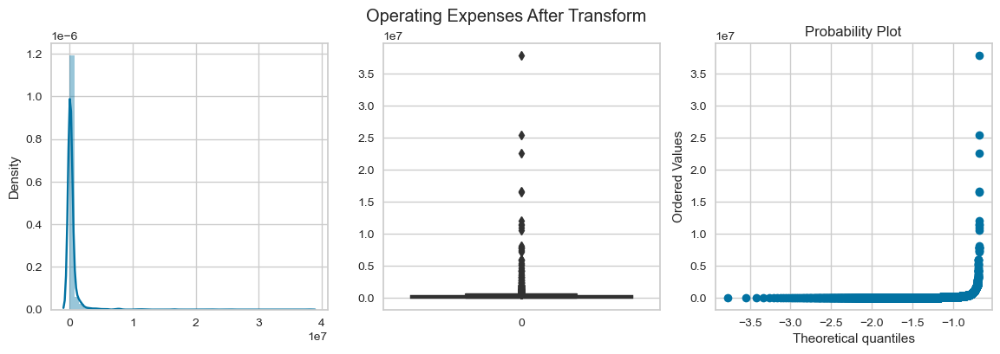

posx and posy should be finite values
posx and posy should be finite values


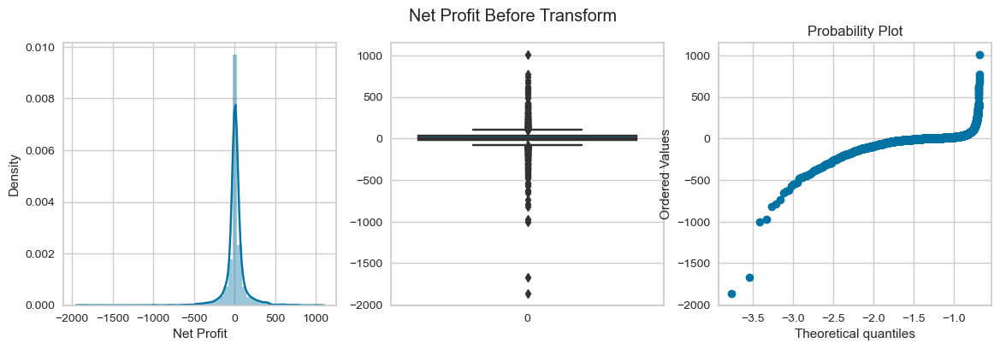

posx and posy should be finite values
posx and posy should be finite values


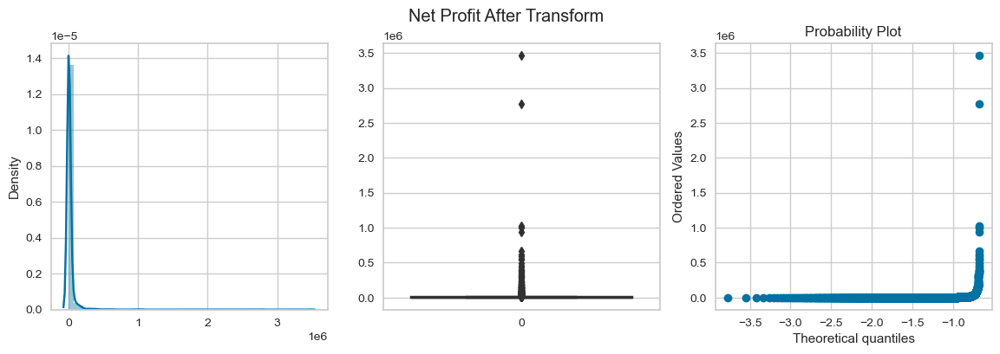

posx and posy should be finite values
posx and posy should be finite values


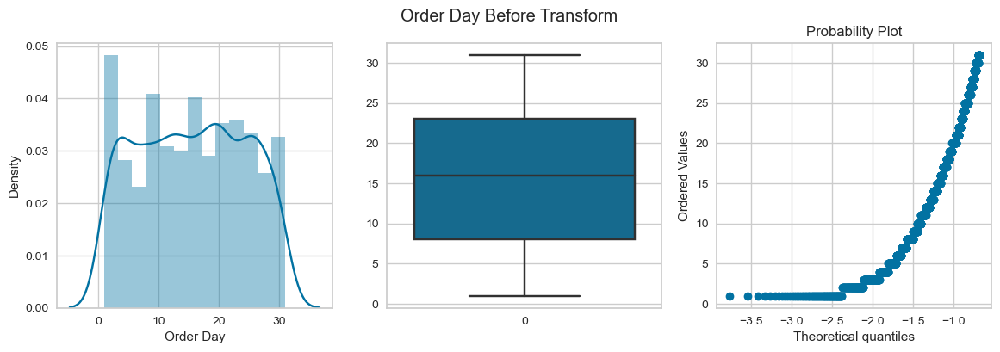

posx and posy should be finite values
posx and posy should be finite values


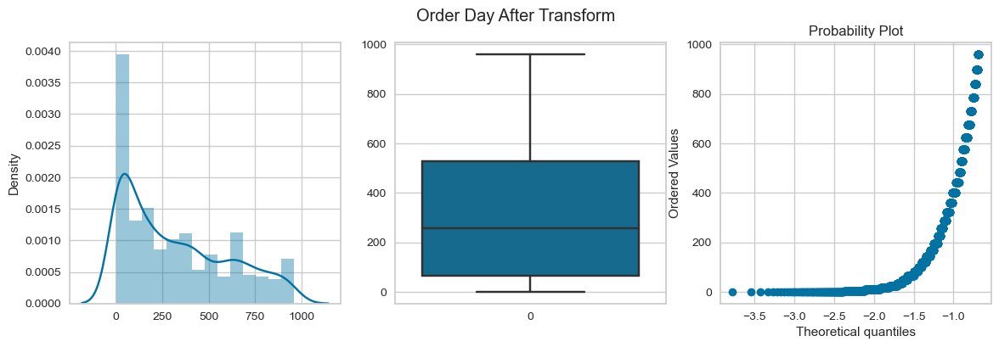

posx and posy should be finite values
posx and posy should be finite values


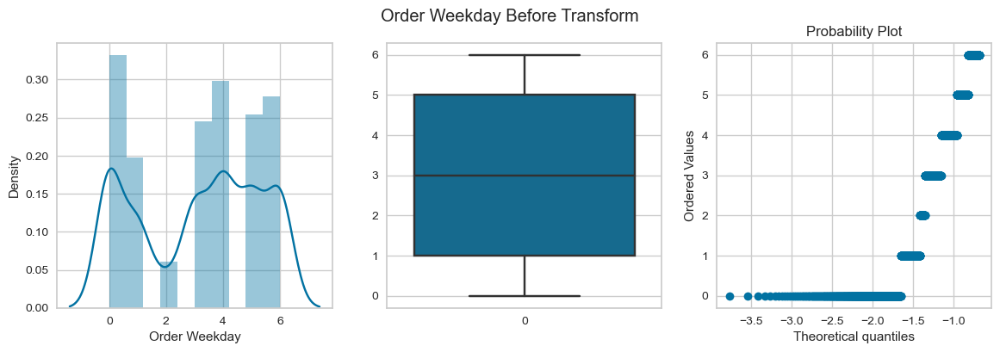

posx and posy should be finite values
posx and posy should be finite values


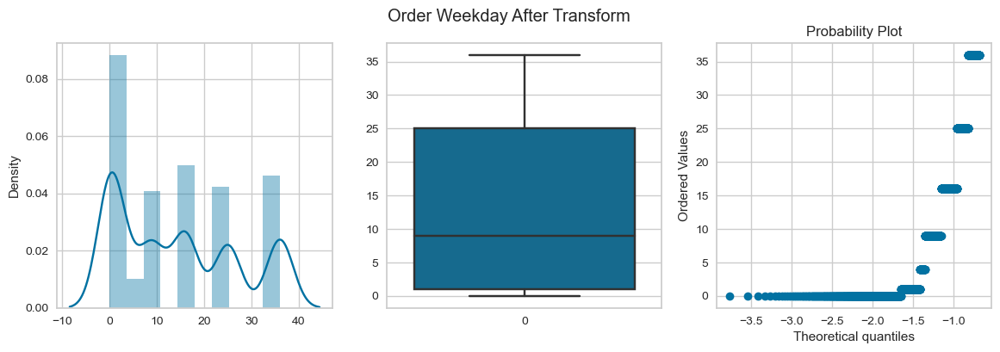

posx and posy should be finite values
posx and posy should be finite values


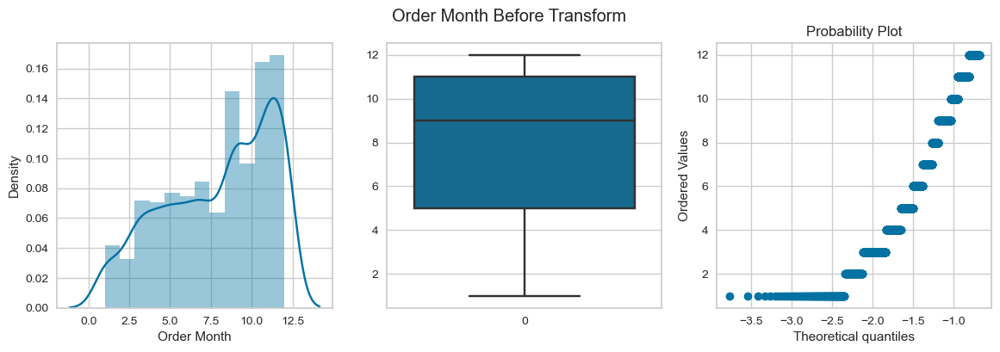

posx and posy should be finite values
posx and posy should be finite values


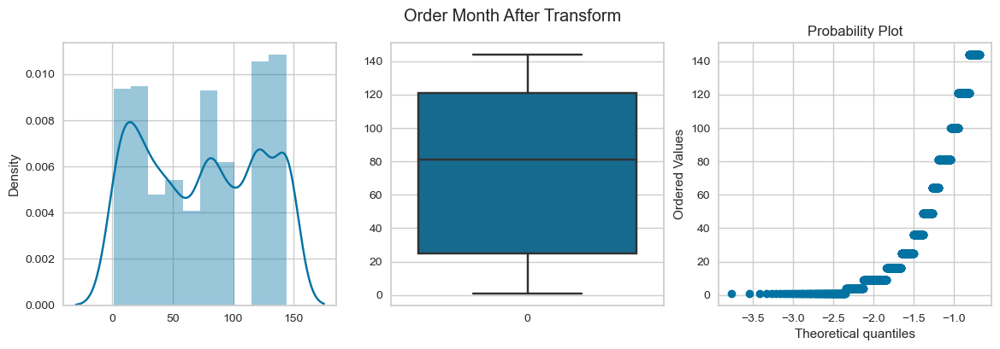

posx and posy should be finite values
posx and posy should be finite values


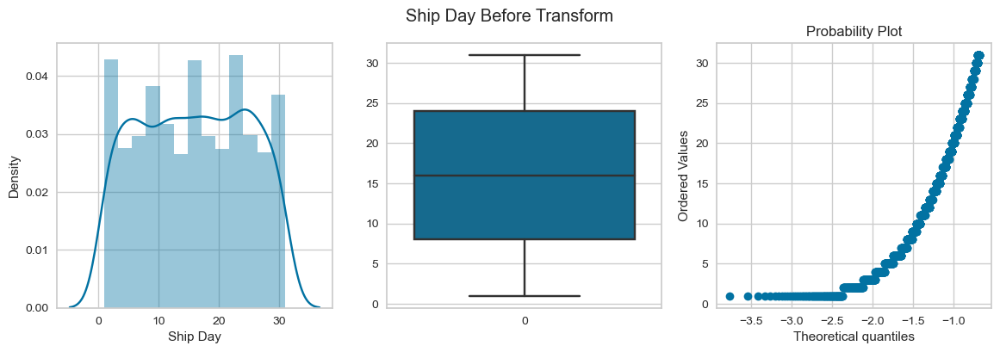

posx and posy should be finite values
posx and posy should be finite values


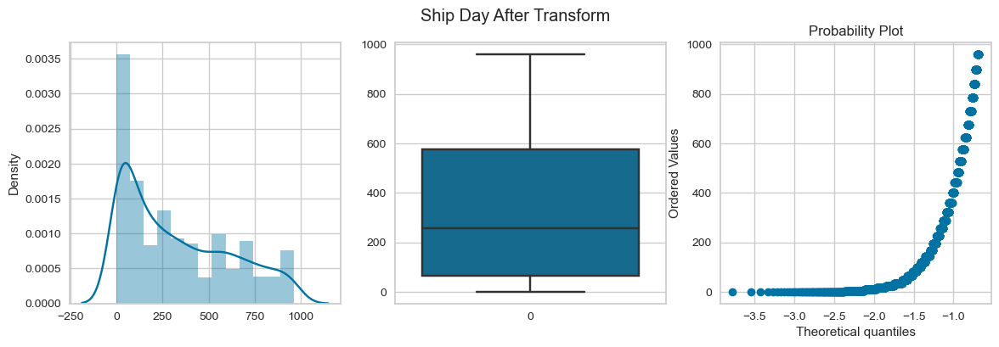

In [44]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(np.square))

posx and posy should be finite values
posx and posy should be finite values


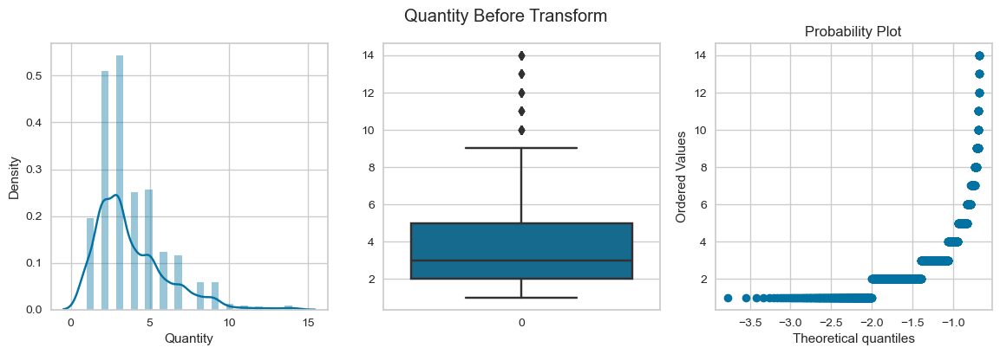

posx and posy should be finite values
posx and posy should be finite values


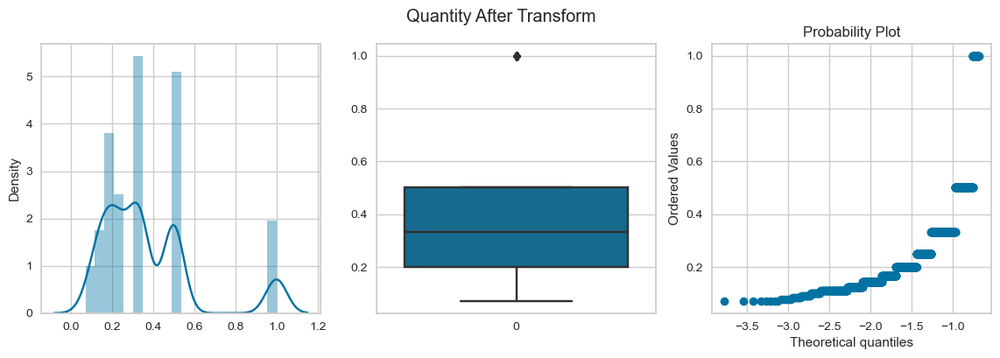

posx and posy should be finite values
posx and posy should be finite values


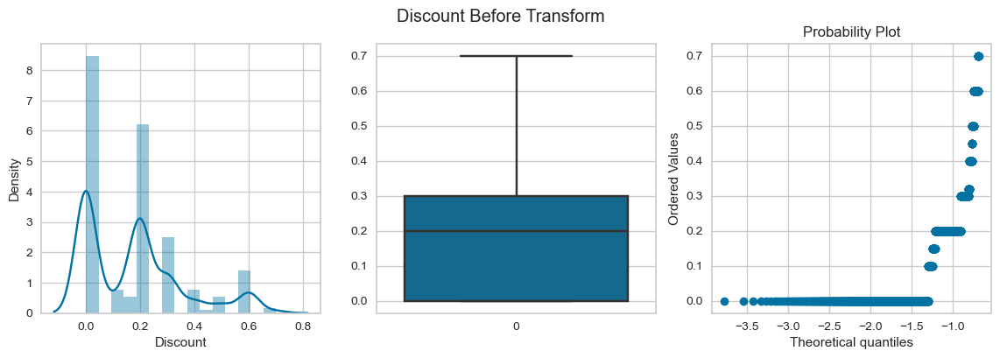

posx and posy should be finite values
posx and posy should be finite values


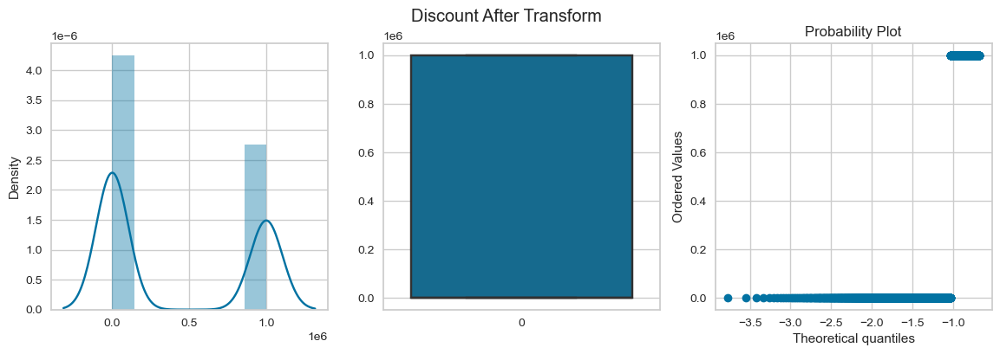

posx and posy should be finite values
posx and posy should be finite values


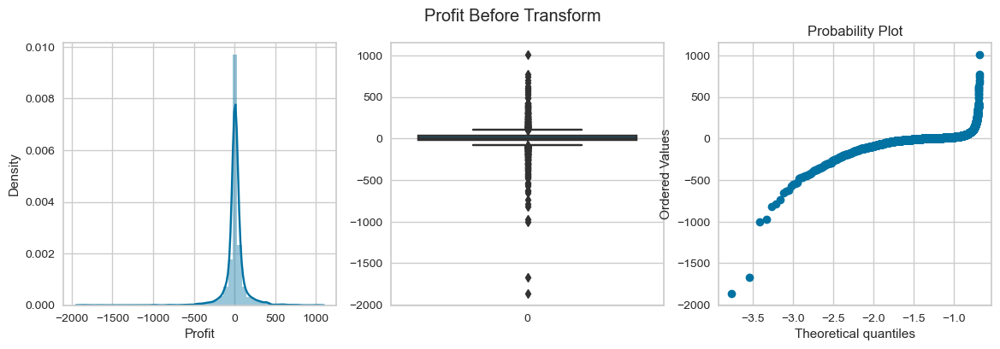

posx and posy should be finite values
posx and posy should be finite values


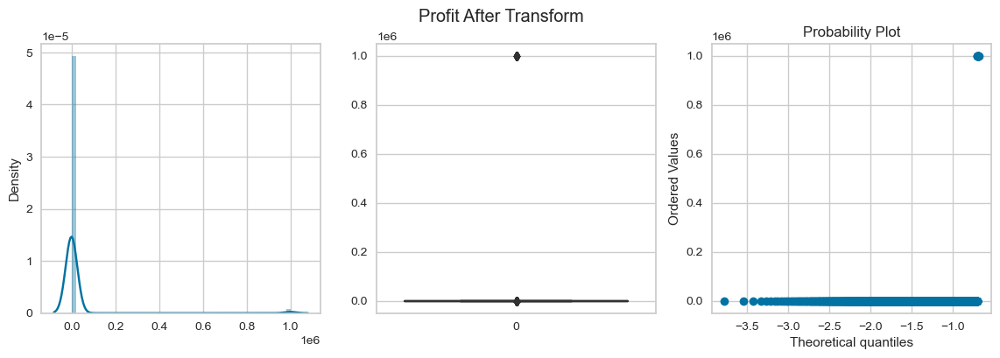

posx and posy should be finite values
posx and posy should be finite values


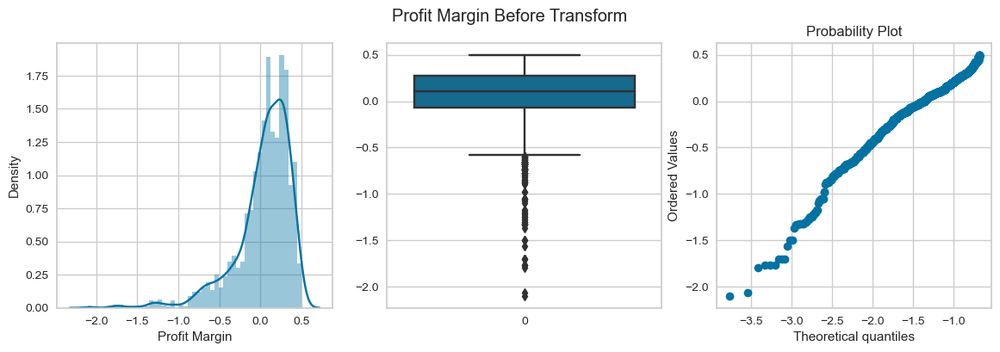

posx and posy should be finite values
posx and posy should be finite values


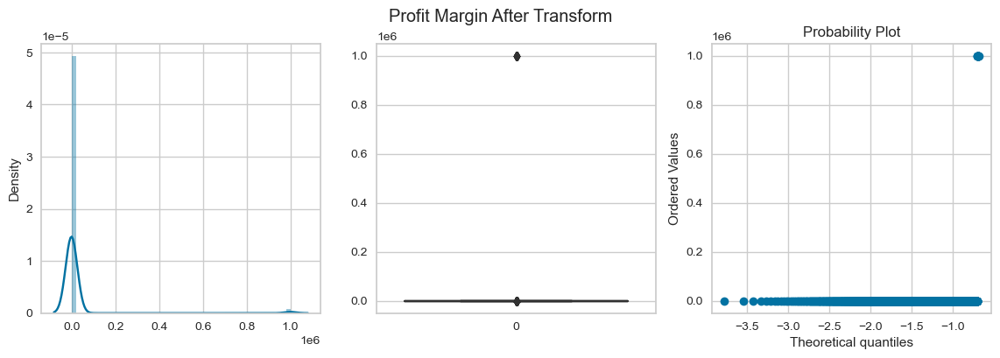

posx and posy should be finite values
posx and posy should be finite values


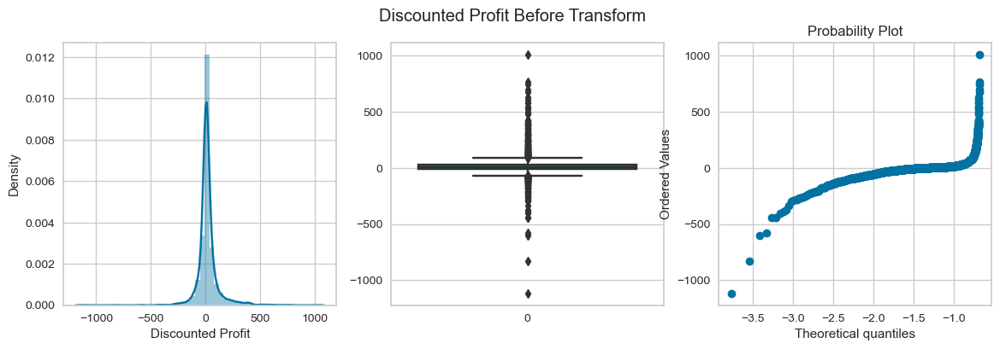

posx and posy should be finite values
posx and posy should be finite values


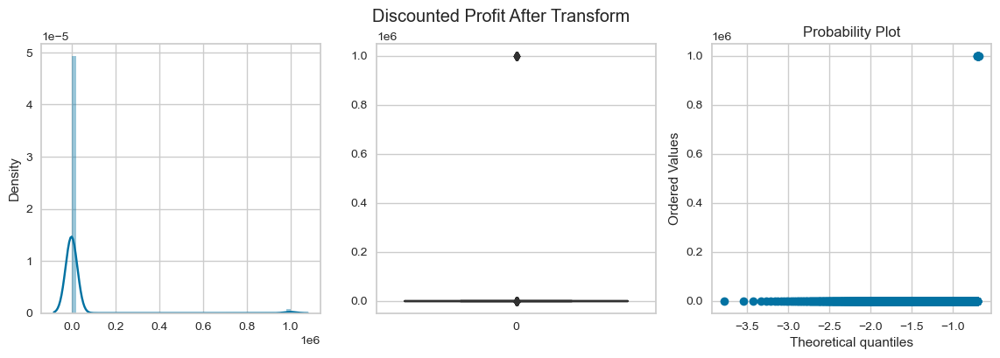

posx and posy should be finite values
posx and posy should be finite values


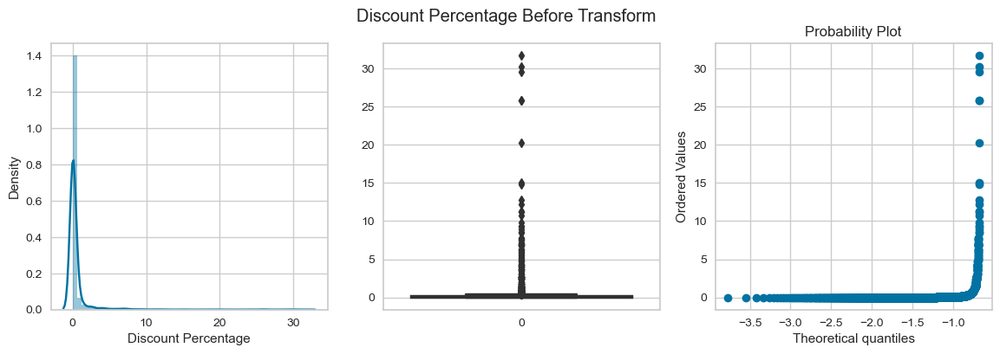

posx and posy should be finite values
posx and posy should be finite values


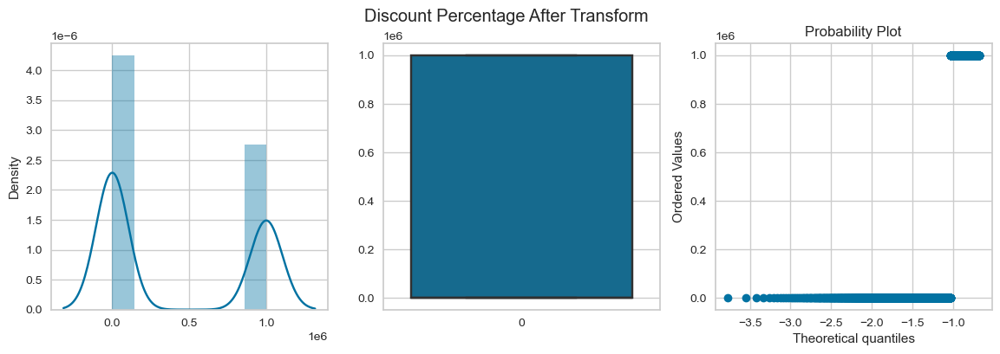

posx and posy should be finite values
posx and posy should be finite values


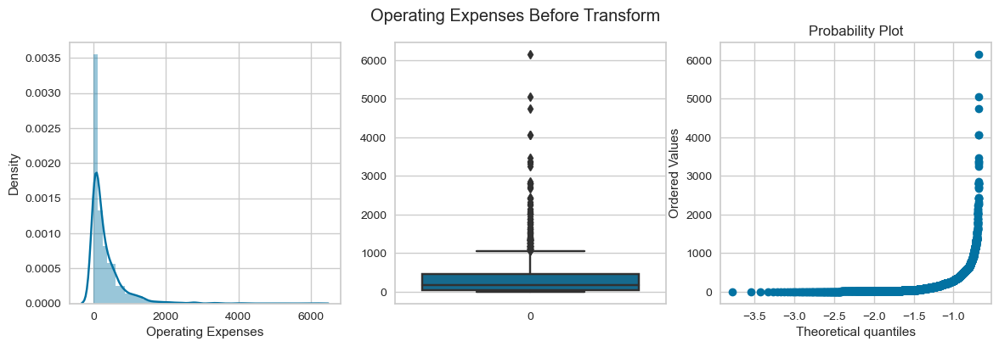

posx and posy should be finite values
posx and posy should be finite values


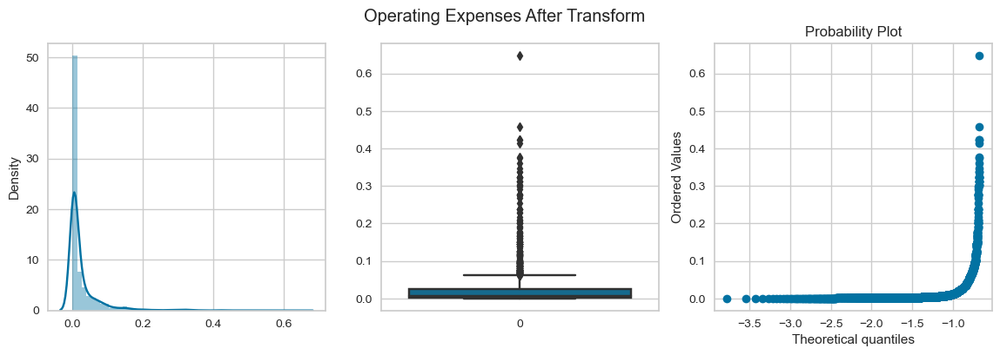

posx and posy should be finite values
posx and posy should be finite values


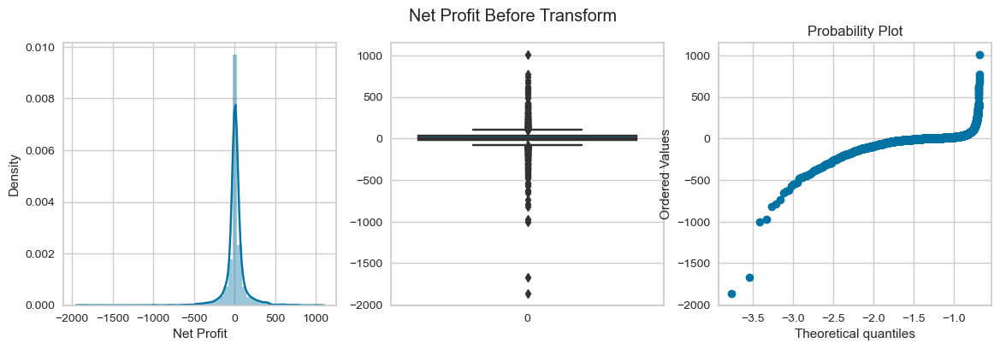

posx and posy should be finite values
posx and posy should be finite values


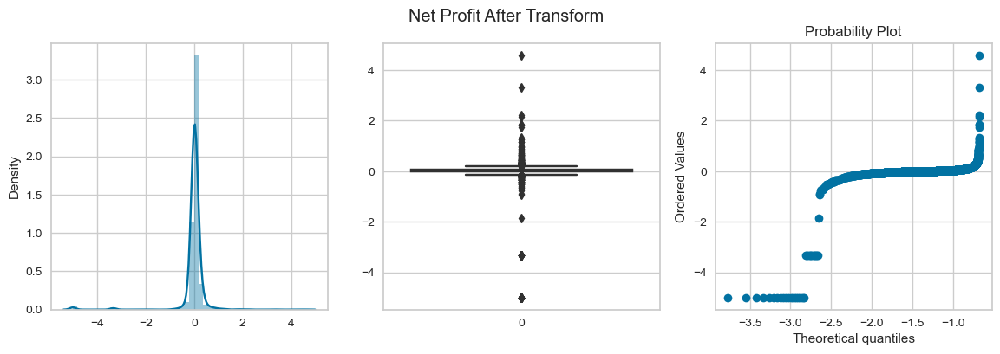

posx and posy should be finite values
posx and posy should be finite values


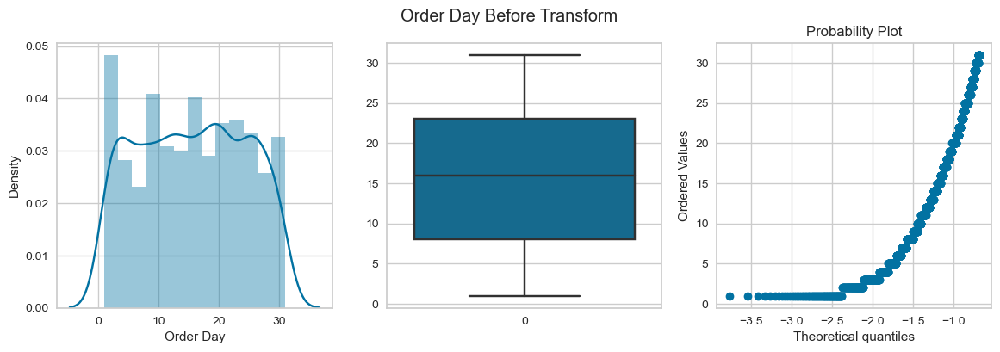

posx and posy should be finite values
posx and posy should be finite values


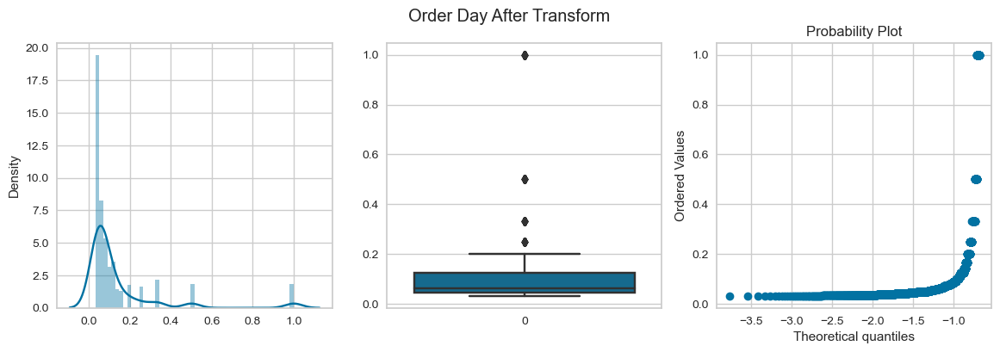

posx and posy should be finite values
posx and posy should be finite values


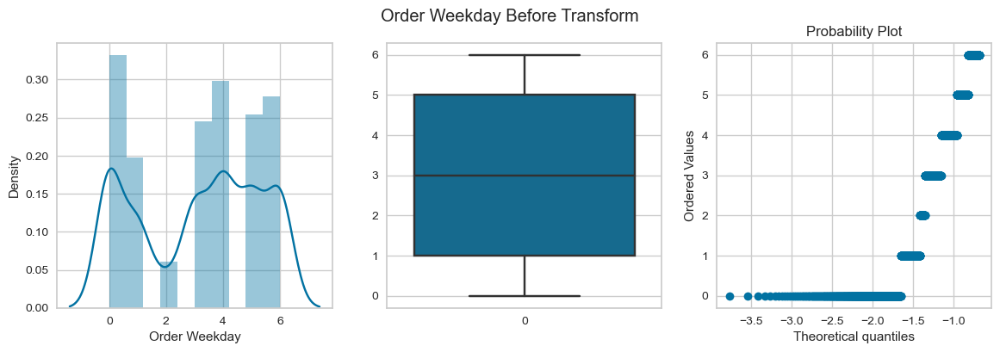

posx and posy should be finite values
posx and posy should be finite values


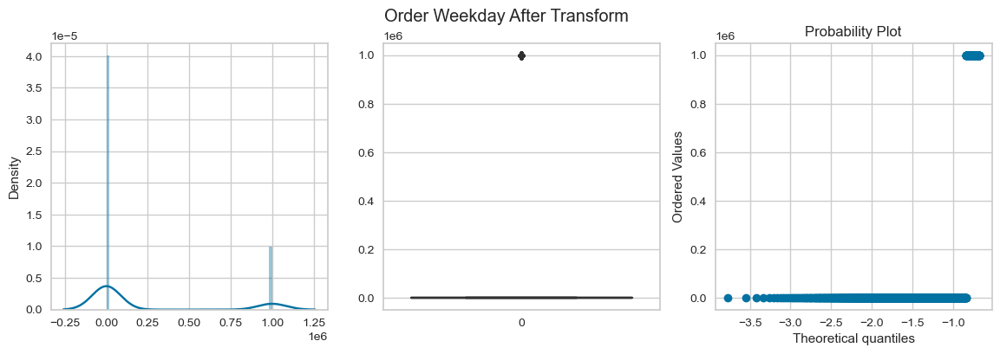

posx and posy should be finite values
posx and posy should be finite values


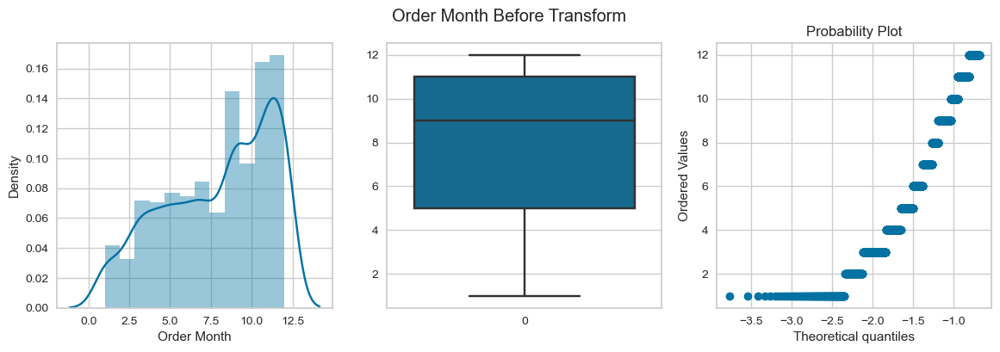

posx and posy should be finite values
posx and posy should be finite values


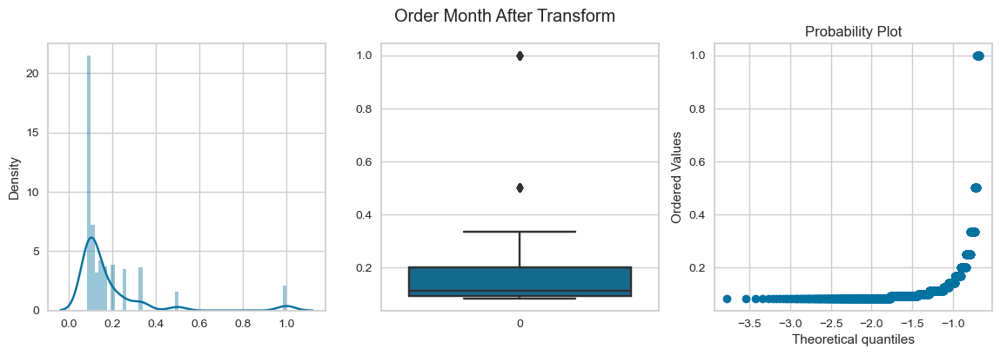

posx and posy should be finite values
posx and posy should be finite values


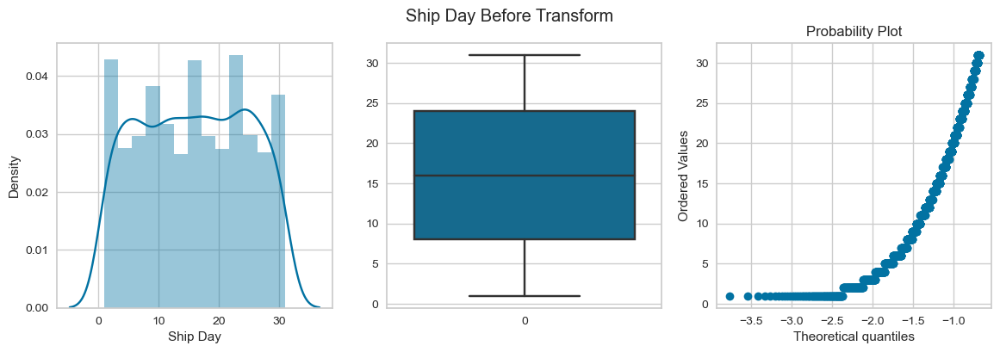

posx and posy should be finite values
posx and posy should be finite values


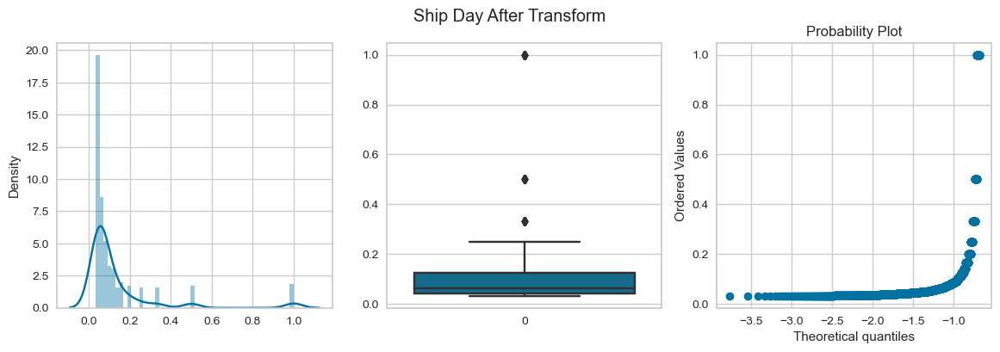

In [45]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(lambda x: 1/(x+0.000001)))

posx and posy should be finite values
posx and posy should be finite values


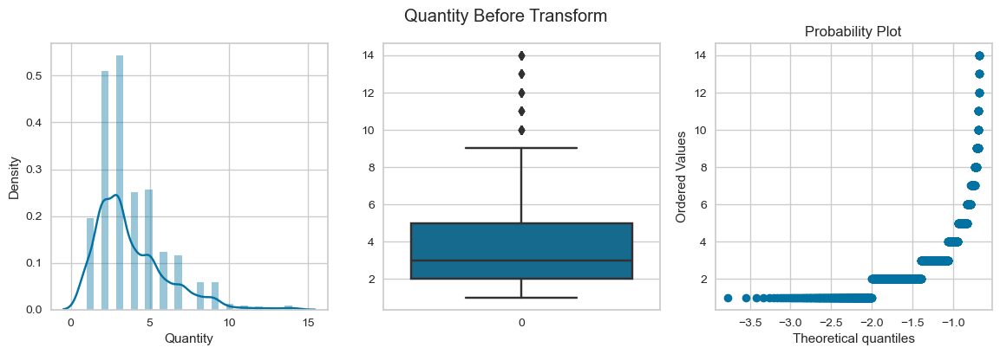

posx and posy should be finite values
posx and posy should be finite values


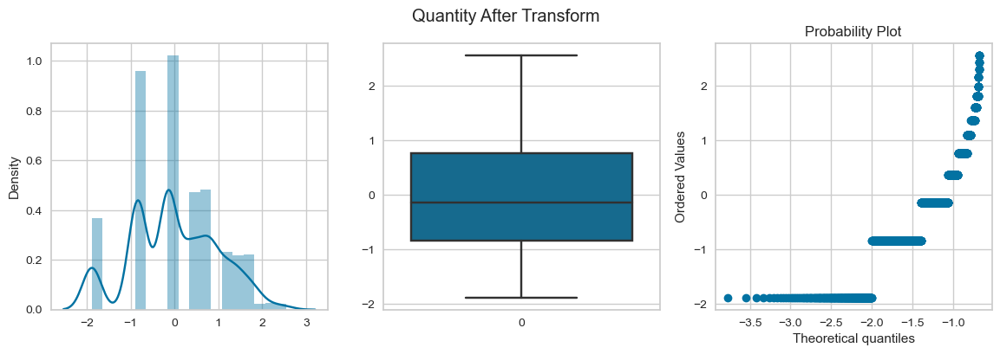

posx and posy should be finite values
posx and posy should be finite values


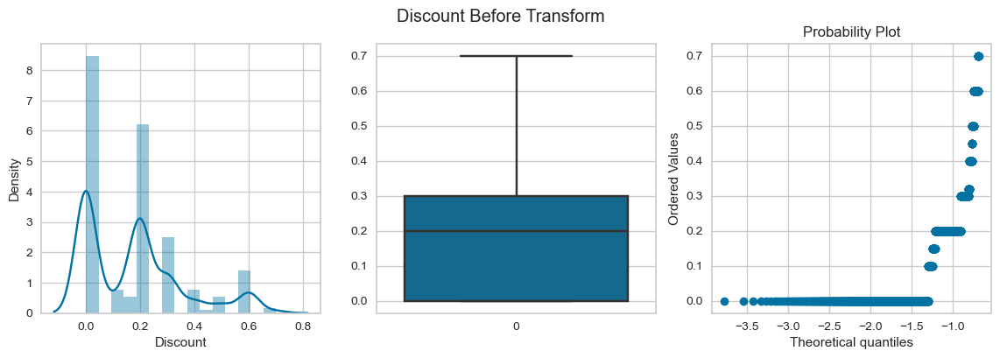

posx and posy should be finite values
posx and posy should be finite values


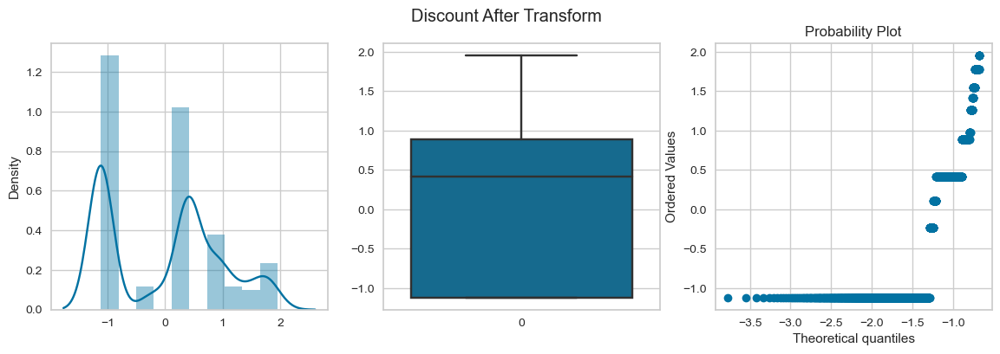

posx and posy should be finite values
posx and posy should be finite values


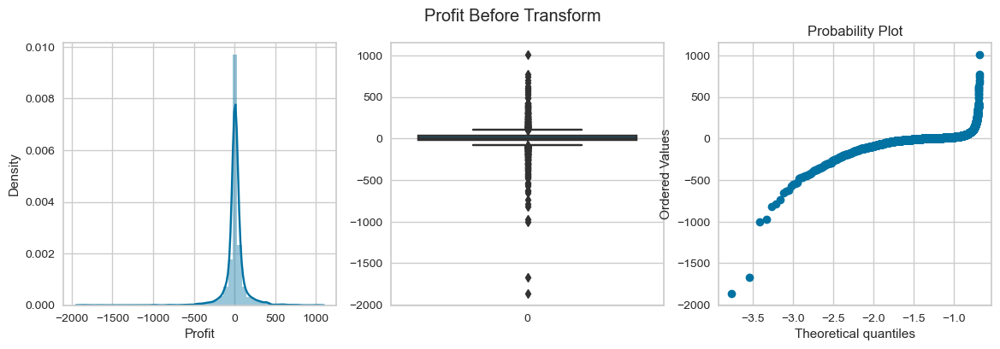

posx and posy should be finite values
posx and posy should be finite values


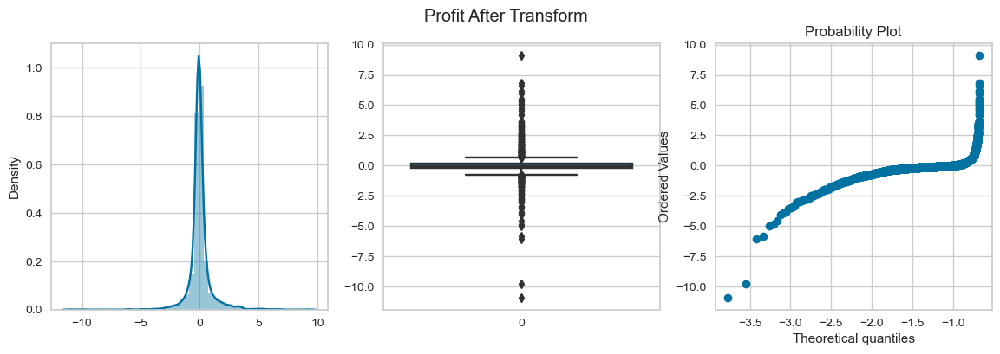

posx and posy should be finite values
posx and posy should be finite values


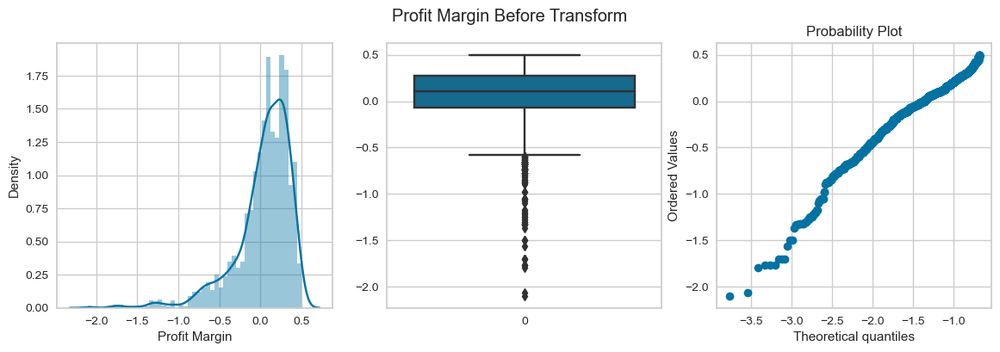

posx and posy should be finite values
posx and posy should be finite values


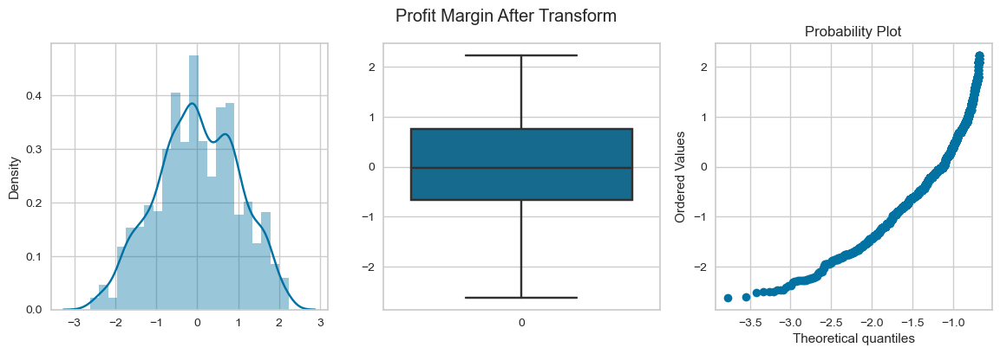

posx and posy should be finite values
posx and posy should be finite values


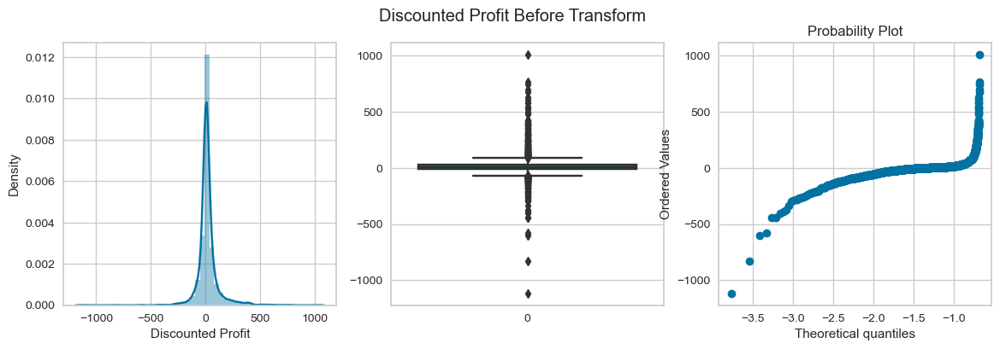

posx and posy should be finite values
posx and posy should be finite values


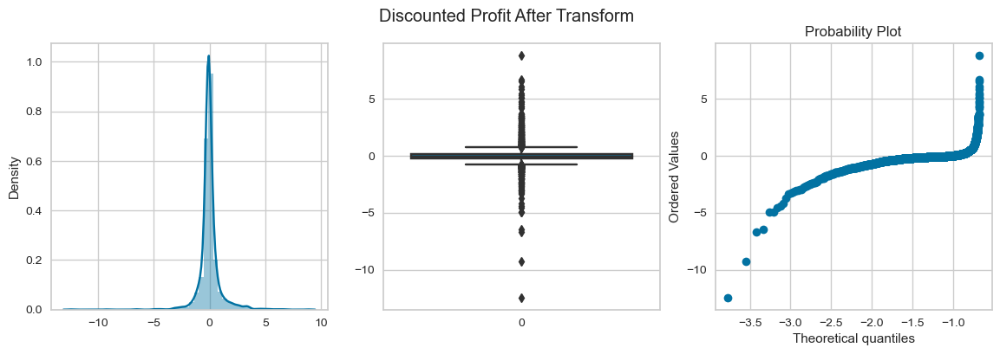

posx and posy should be finite values
posx and posy should be finite values


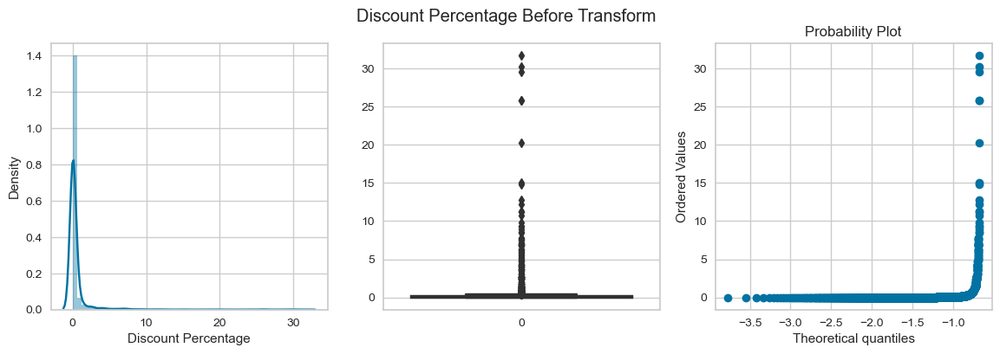

posx and posy should be finite values
posx and posy should be finite values


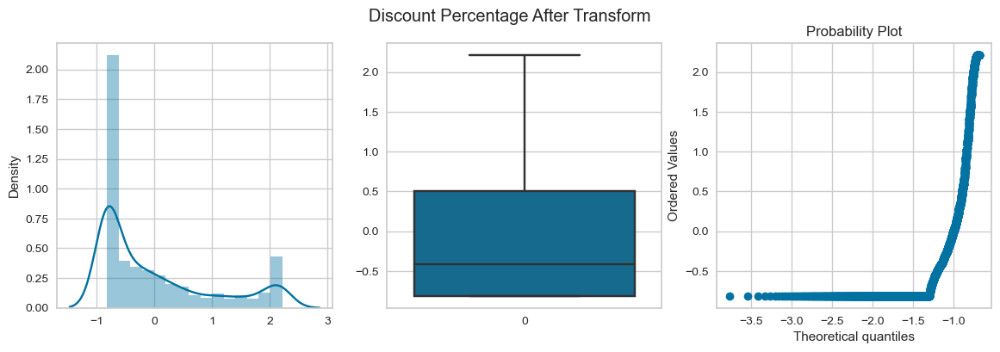

posx and posy should be finite values
posx and posy should be finite values


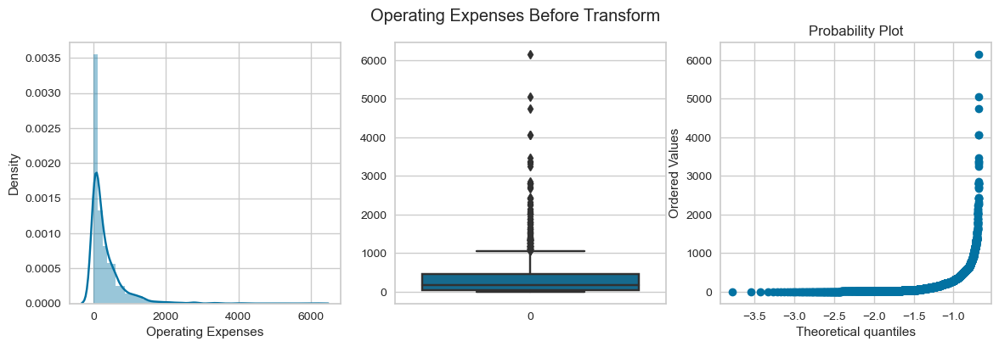

posx and posy should be finite values
posx and posy should be finite values


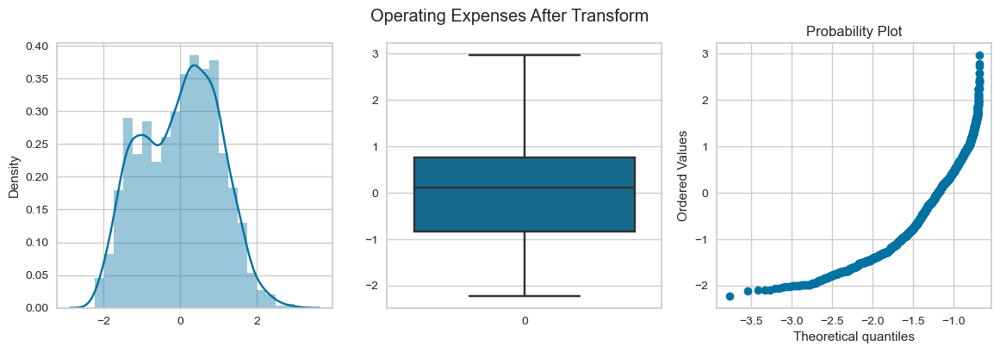

posx and posy should be finite values
posx and posy should be finite values


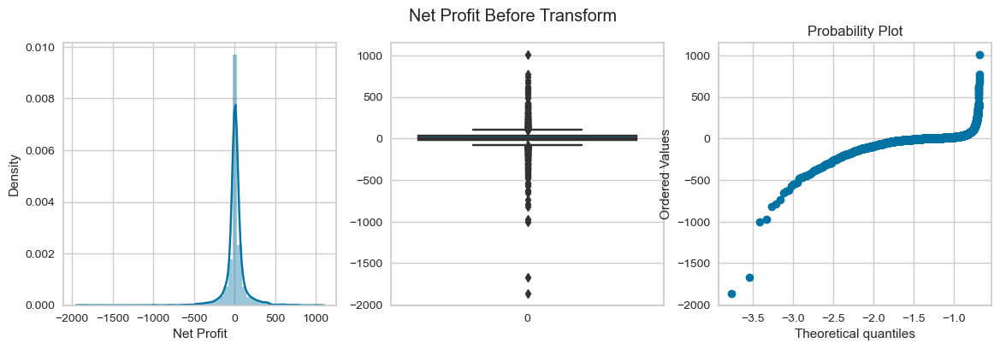

posx and posy should be finite values
posx and posy should be finite values


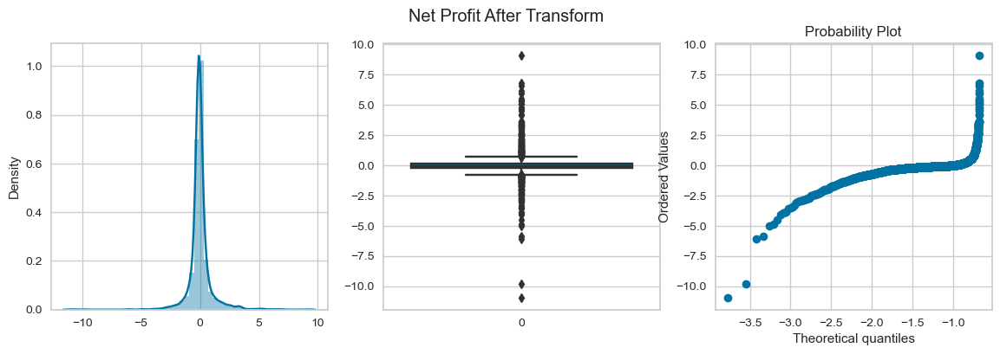

posx and posy should be finite values
posx and posy should be finite values


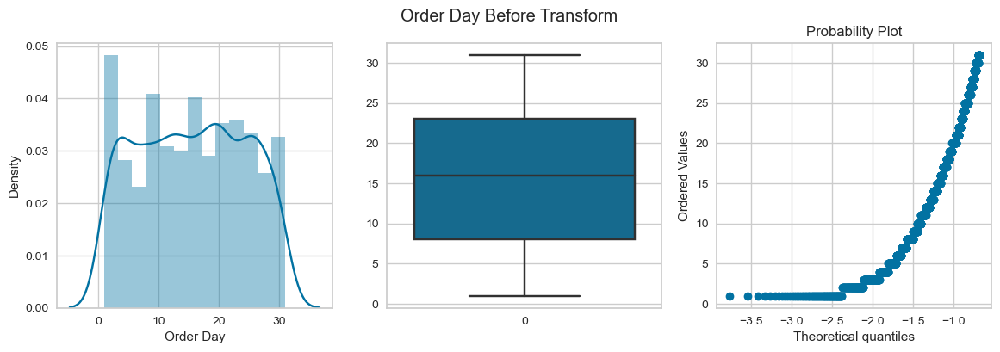

posx and posy should be finite values
posx and posy should be finite values


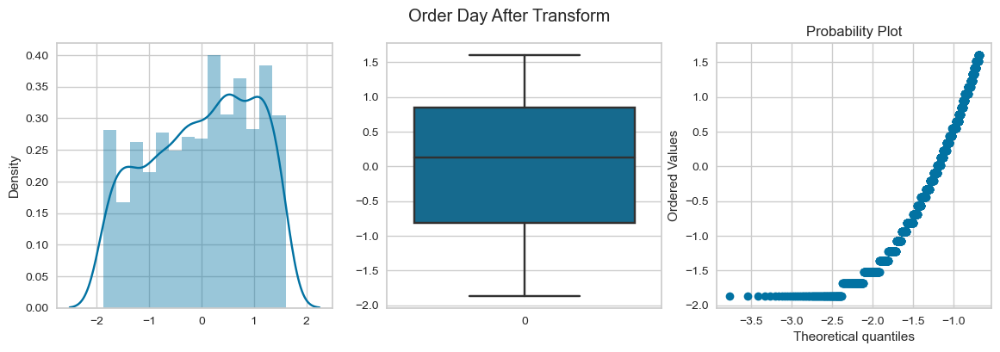

posx and posy should be finite values
posx and posy should be finite values


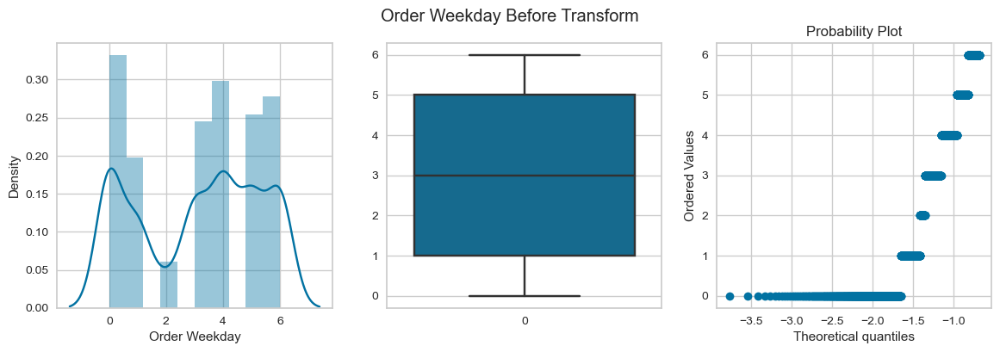

posx and posy should be finite values
posx and posy should be finite values


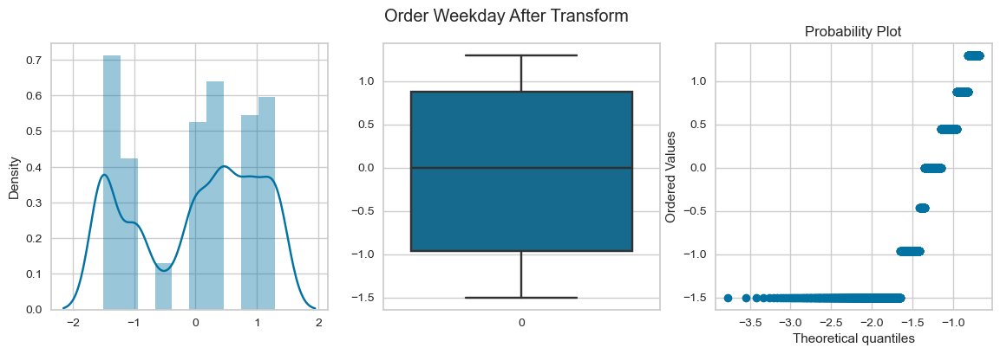

posx and posy should be finite values
posx and posy should be finite values


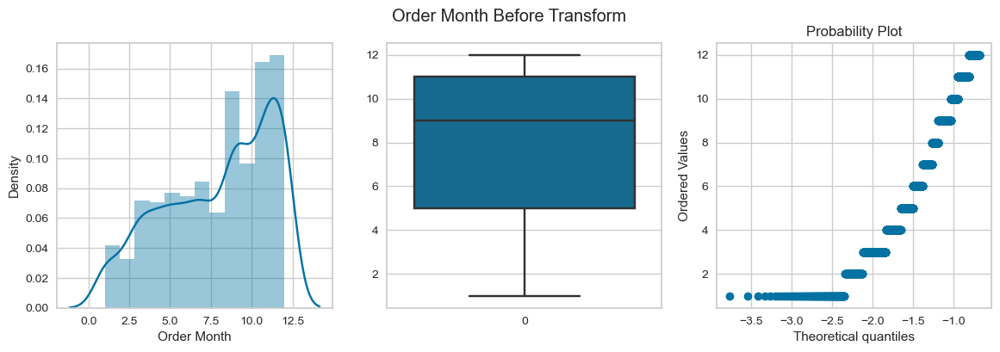

posx and posy should be finite values
posx and posy should be finite values


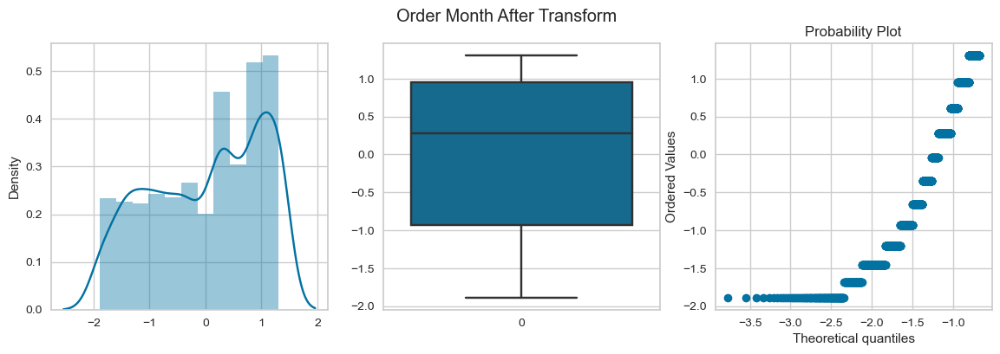

posx and posy should be finite values
posx and posy should be finite values


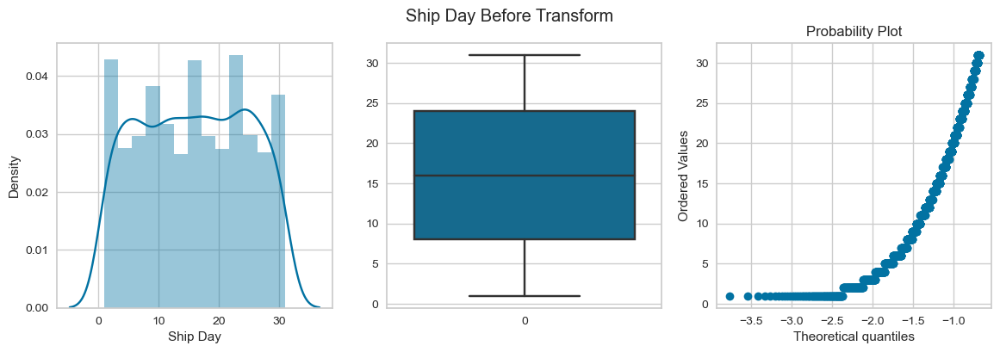

posx and posy should be finite values
posx and posy should be finite values


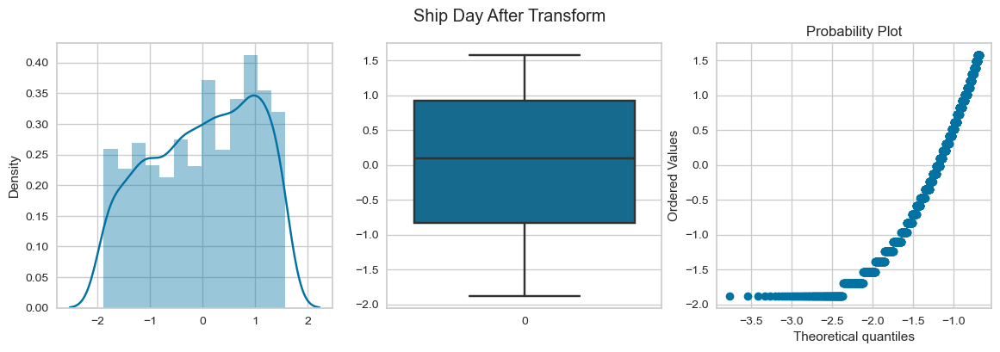

In [46]:
for col in skewed_cols:
    apply_transform(df,col,PowerTransformer())

Quantity: Log Transform <br>
Discount: Sqrt Transform <br>
Profit: Log Transform <br>
Profit Margin: Power Transform <br>
Discounted Profit: Log Transform <br>
Discount Percentage: Power Transform <br> 
Operating Expenses: Power Transform <br>
Net Profit: Log Transform 

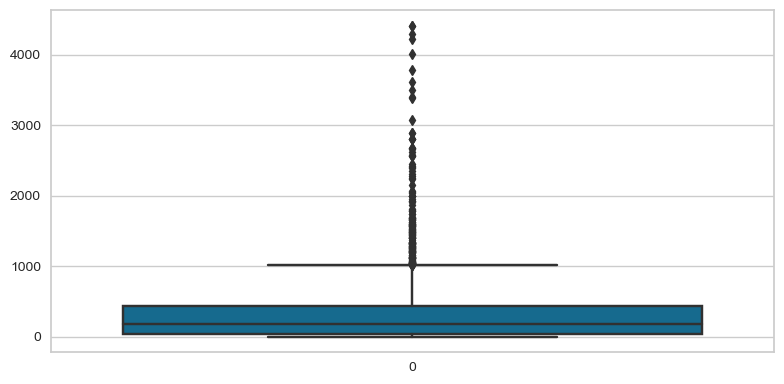

In [47]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(df['Sales'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

In [48]:
for idx in list(df[df['Sales'] > 10500].index):
    df.drop(idx,axis=0,inplace=True)

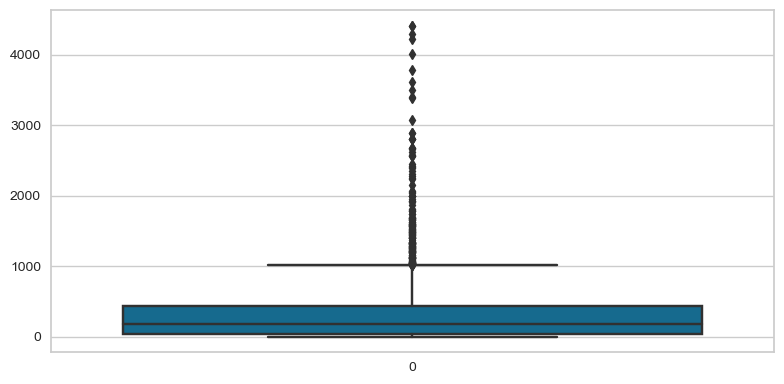

In [49]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(df['Sales'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

### Feature Splitting

In [50]:
df.isnull().sum()

Postal Code                                                     6431
Sales                                                           6431
Quantity                                                        6431
Discount                                                        6431
Profit                                                          6431
Profit Margin                                                   6431
Discounted Profit                                               6431
Discount Percentage                                             6431
Operating Expenses                                              6431
Net Profit                                                      6431
Order Year                                                      6431
Order Month                                                     6431
Order Day                                                       6431
Order Weekday                                                   6431
Ship Year                         

In [51]:
df = df.dropna()
df.shape

(438, 59)

In [52]:
X = df.drop('Sales',axis=1)
y = df['Sales']

In [53]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

### Feature Selection

In [54]:
X_train

,Postal Code,Quantity,Discount,Profit,Profit Margin,Discounted Profit,Discount Percentage,Operating Expenses,Net Profit,Order Year,...,Sub-Category_nan,Product Name_Eldon Wave Desk Accessories,"Product Name_Global High-Back Leather Tilter, Burgundy","Product Name_Global Wood Trimmed Manager's Task Chair, Khaki",Product Name_KI Adjustable-Height Table,Product Name_SAFCO Arco Folding Chair,"Product Name_Situations Contoured Folding Chairs, 4/Set",Product Name_Staple-based wall hangings,Product Name_nan,Product Name_infrequent_sklearn
546,76106.0,4.0,0.60,-84.2928,-1.275000,-33.717120,0.907551,150.4048,-84.8928,2014.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
528,33801.0,3.0,0.20,5.1408,0.112500,4.112640,0.437675,40.5552,4.9408,2017.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
670,60653.0,3.0,0.60,-14.3856,-0.600000,-5.754240,2.502503,38.3616,-14.9856,2017.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1012,98502.0,3.0,0.00,46.5750,0.300000,46.575000,0.000000,108.6750,46.5750,2017.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1546,13601.0,7.0,0.20,196.6860,0.125000,157.348800,0.012711,1376.8020,196.4860,2014.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,38109.0,3.0,0.40,-94.9410,-0.500000,-56.964600,0.210657,284.8230,-95.3410,2016.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1302,22153.0,3.0,0.00,83.0502,0.290000,83.050200,0.000000,203.3298,83.0502,2016.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1689,19140.0,2.0,0.20,23.3160,0.075000,18.652800,0.064334,287.5640,23.1160,2017.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2112,92374.0,4.0,0.20,20.1960,0.062500,16.156800,0.061893,302.9400,19.9960,2015.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [55]:
print('Shape of X_train:',X_train.shape)
print('Shape of X_test:',X_test.shape)

Shape of X_train: (306, 58)
Shape of X_test: (132, 58)


In [56]:
pipeline = Pipeline(steps=[
    ('constant',DropConstantFeatures()),
    ('duplicate',DropDuplicateFeatures()),
    ('correlated',DropCorrelatedFeatures())
])

X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)

In [57]:
print('Shape of X_train:',X_train.shape)
print('Shape of X_test:',X_test.shape)

Shape of X_train: (306, 44)
Shape of X_test: (132, 44)


In [58]:
kbest = SelectKBest(k=10,score_func=f_regression)
kbest.fit(X_train,y_train)

SelectKBest(score_func=<function f_regression at 0x00000151D166BBA0>)

In [59]:
selected_features = kbest.get_feature_names_out()
selected_features

array(['Quantity', 'Discounted Profit', 'Discount Percentage',
       'Operating Expenses', 'Order Year', 'Order Month', 'Order Weekday',
       'Ship Weekday', 'Ship Mode_3', 'Region_1.0'], dtype=object)

In [60]:
perc = SelectPercentile(percentile=20,score_func=f_regression)
perc.fit(X_train,y_train)

SelectPercentile(percentile=20,
                 score_func=<function f_regression at 0x00000151D166BBA0>)

In [61]:
selected_features = perc.get_feature_names_out()
selected_features

array(['Quantity', 'Discounted Profit', 'Discount Percentage',
       'Operating Expenses', 'Order Year', 'Order Month', 'Order Weekday',
       'Ship Weekday', 'Region_1.0'], dtype=object)

In [62]:
ridge = SelectFromModel(estimator=Ridge(),max_features=10)
ridge.fit(X_train,y_train)

SelectFromModel(estimator=Ridge(), max_features=10)

In [63]:
selected_features = ridge.get_feature_names_out()
selected_features

array(['Discount', 'State_8.0', 'State_infrequent_sklearn', 'City_232.0',
       'City_307.0', 'Region_1.0', 'Sub-Category_1.0',
       'Product Name_Global High-Back Leather Tilter, Burgundy',
       "Product Name_Global Wood Trimmed Manager's Task Chair, Khaki",
       'Product Name_Situations Contoured Folding Chairs, 4/Set'],
      dtype=object)

In [64]:
rf = SelectFromModel(estimator=RandomForestRegressor(),max_features=10)
rf.fit(X_train,y_train)

SelectFromModel(estimator=RandomForestRegressor(), max_features=10)

In [65]:
selected_features = rf.get_feature_names_out()
selected_features

array(['Discount Percentage', 'Operating Expenses'], dtype=object)

In [66]:
rfe = RFE(estimator=RandomForestRegressor(),n_features_to_select=10,step=5,verbose=1)
rfe.fit(X_train,y_train)

Fitting estimator with 44 features.
Fitting estimator with 39 features.
Fitting estimator with 34 features.
Fitting estimator with 29 features.
Fitting estimator with 24 features.
Fitting estimator with 19 features.
Fitting estimator with 14 features.


RFE(estimator=RandomForestRegressor(), n_features_to_select=10, step=5,
    verbose=1)

In [67]:
selected_features = rfe.get_feature_names_out()
selected_features

array(['Postal Code', 'Quantity', 'Discounted Profit',
       'Discount Percentage', 'Operating Expenses', 'Order Month',
       'Order Day', 'Order Weekday', 'Ship Day', 'Ship Weekday'],
      dtype=object)

In [68]:
sfs = SequentialFeatureSelector(estimator=Ridge(),n_features_to_select=10,direction='backward')
sfs.fit(X_train,y_train)

SequentialFeatureSelector(direction='backward', estimator=Ridge(),
                          n_features_to_select=10)

In [69]:
selected_features = sfs.get_feature_names_out()
selected_features

array(['Postal Code', 'Discount', 'Discounted Profit',
       'Discount Percentage', 'Operating Expenses', 'Order Day',
       'Ship Day', 'State_32.0', 'State_infrequent_sklearn', 'Region_1.0'],
      dtype=object)

In [70]:
xgb = XGBRegressor()
xgb.fit(X_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)

In [71]:
def plot_feature_importances(feat_imp_type: str):
    feat_imps = xgb.get_booster().get_score(importance_type=feat_imp_type)
    keys = list(feat_imps.keys())[:10]
    values = list(feat_imps.values())[:10]
    feat_imps_df = pd.DataFrame(data=values, index=keys, columns=["Importance"]).sort_values(by="Importance", ascending=False).reset_index()
    feat_imps_df.rename({'index': 'Feature'},axis=1,inplace=True)
    plt.figure(figsize=(12,8))
    fig = sns.barplot(x='Importance',y='Feature',data=feat_imps_df,orient='horizontal',palette='viridis')
    plt.title(f"{feat_imp_type.title()} Feature Importance")
    plt.show(fig)
    plt.close('all')
    del fig
    gc.collect();

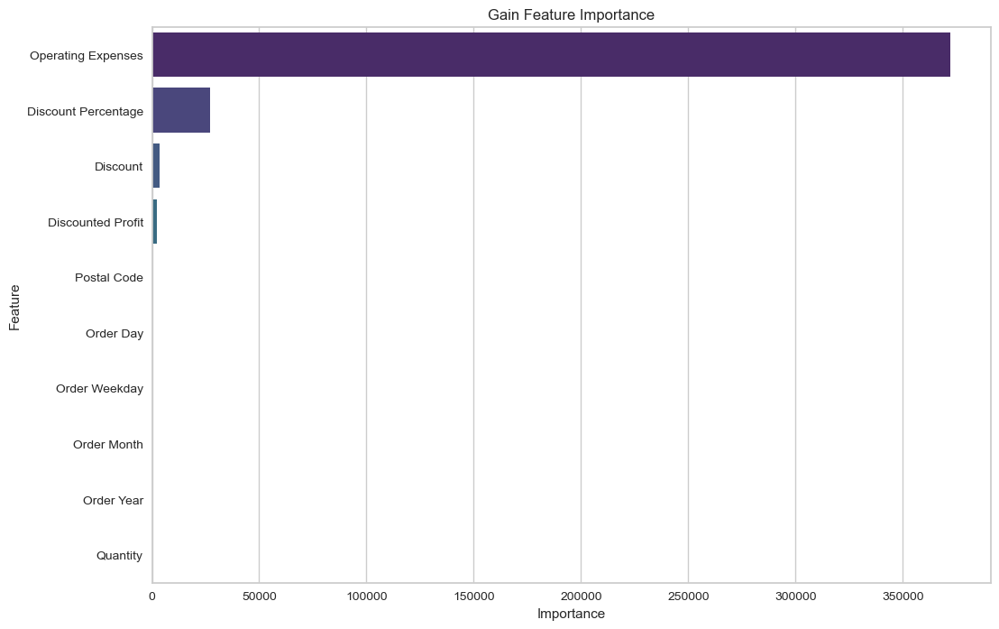

In [72]:
plot_feature_importances('gain')

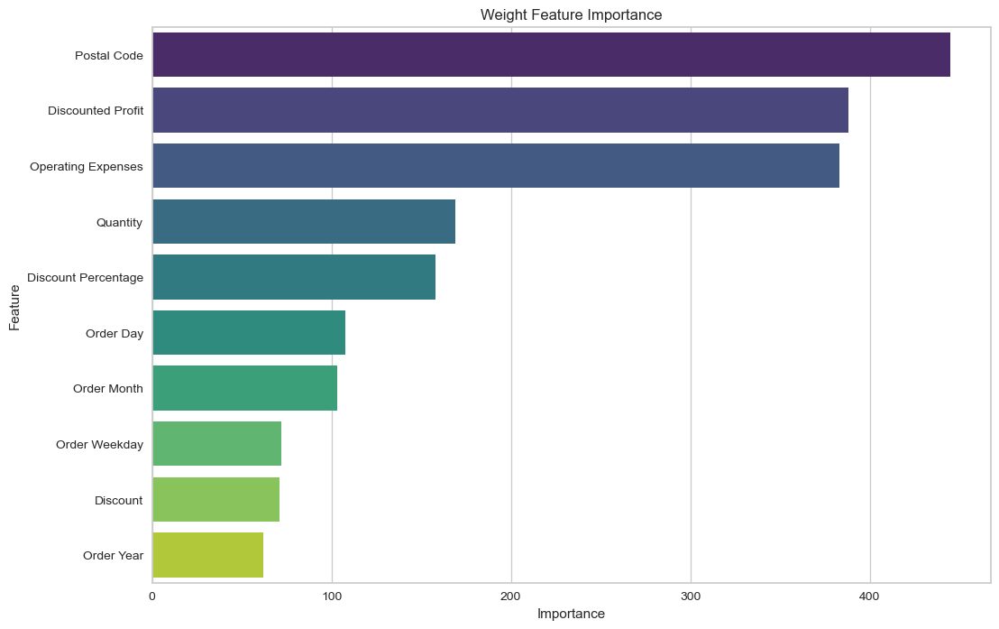

In [73]:
plot_feature_importances('weight')

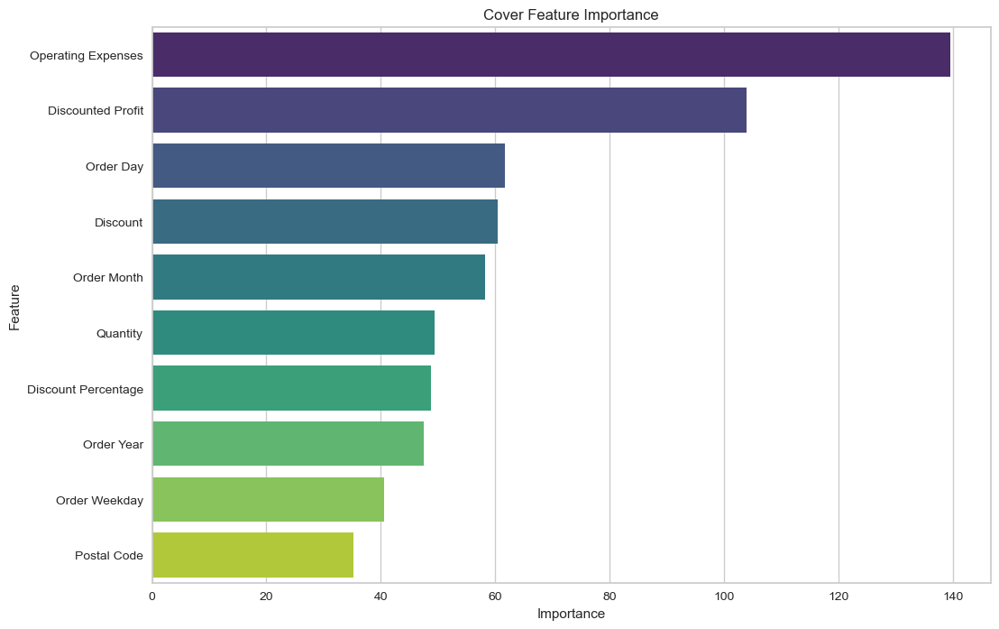

In [74]:
plot_feature_importances('cover')

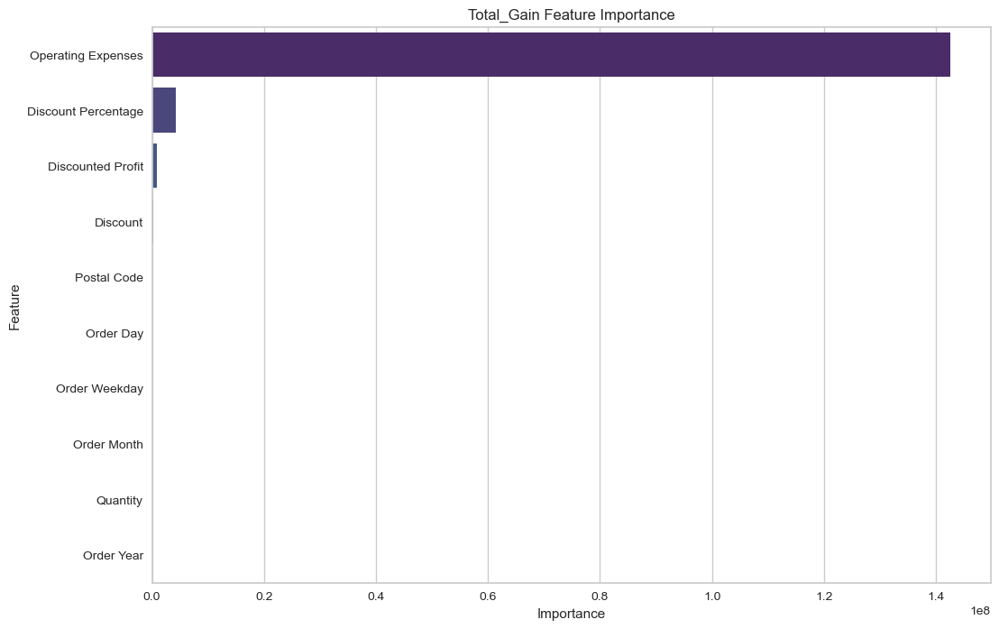

In [75]:
plot_feature_importances('total_gain')

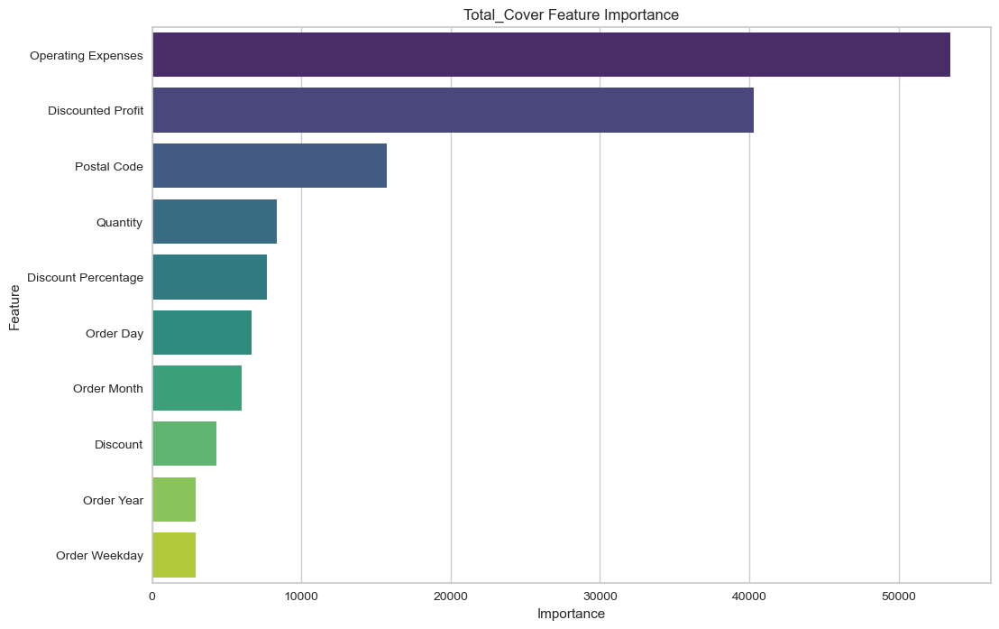

In [76]:
plot_feature_importances('total_cover')

In [77]:
final_selected_features = ['Discount Percentage',
                           'Postal Code',
                           'Discount',
                           'Order Day',
                           'Order Month',
                           'Quantity',
                           'Operating Expenses',
                           'Ship Day',
                           'Order Weekday']

final_X_train = X_train[final_selected_features]
final_X_test = X_test[final_selected_features]

In [78]:
gc.collect()

0

In [79]:
final_X_train.head()

,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
546,0.907551,76106.0,0.6,11.0,5.0,4.0,150.4048,16.0,6.0
528,0.437675,33801.0,0.2,21.0,10.0,3.0,40.5552,26.0,5.0
670,2.502503,60653.0,0.6,9.0,6.0,3.0,38.3616,13.0,4.0
1012,0.000000,98502.0,0.0,17.0,6.0,3.0,108.6750,21.0,5.0
1546,0.012711,13601.0,0.2,31.0,12.0,7.0,1376.8020,4.0,2.0


In [80]:
final_X_test.head()

,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
1763,0.051160,92105.0,0.15,5.0,9.0,3.0,313.8954,9.0,5.0
365,0.000000,10009.0,0.00,25.0,9.0,8.0,26.3872,1.0,0.0
1337,0.000000,90008.0,0.00,2.0,4.0,3.0,18.5814,7.0,6.0
1874,0.000000,99207.0,0.00,21.0,11.0,1.0,50.3958,25.0,1.0
2116,0.035225,92374.0,0.15,31.0,10.0,1.0,405.7938,31.0,5.0


In [81]:
transformer = ColumnTransformer(transformers=[
    ('log_transform',FunctionTransformer(np.log1p),['Quantity']),
    ('sqrt_transform',FunctionTransformer(np.sqrt),['Discount']),
    ('power_transform',PowerTransformer(),['Discount Percentage','Operating Expenses'])
],remainder='passthrough')
transformer

ColumnTransformer(remainder='passthrough',
                  transformers=[('log_transform',
                                 FunctionTransformer(func=<ufunc 'log1p'>),
                                 ['Quantity']),
                                ('sqrt_transform',
                                 FunctionTransformer(func=<ufunc 'sqrt'>),
                                 ['Discount']),
                                ('power_transform', PowerTransformer(),
                                 ['Discount Percentage',
                                  'Operating Expenses'])])

In [82]:
final_X_train = transformer.fit_transform(final_X_train)
final_X_train = pd.DataFrame(final_X_train,columns=final_selected_features)
final_X_test = transformer.transform(final_X_test)
final_X_test = pd.DataFrame(final_X_test,columns=final_selected_features)
final_X_train.head()

,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,1.609438,0.774597,1.963237,-0.027439,76106.0,11.0,5.0,16.0,6.0
1,1.386294,0.447214,1.468772,-0.777913,33801.0,21.0,10.0,26.0,5.0
2,1.386294,0.774597,2.190162,-0.807122,60653.0,9.0,6.0,13.0,4.0
3,1.386294,0.000000,-0.799752,-0.224686,98502.0,17.0,6.0,21.0,5.0
4,2.079442,0.447214,-0.656769,1.528647,13601.0,31.0,12.0,4.0,2.0


In [83]:
final_X_test.head()

,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,1.386294,0.387298,-0.273247,0.447350,92105.0,5.0,9.0,9.0,5.0
1,2.197225,0.000000,-0.799752,-0.998067,10009.0,25.0,9.0,1.0,0.0
2,1.386294,0.000000,-0.799752,-1.168035,90008.0,2.0,4.0,7.0,6.0
3,0.693147,0.000000,-0.799752,-0.661752,99207.0,21.0,11.0,25.0,1.0
4,0.693147,0.387298,-0.423843,0.622596,92374.0,31.0,10.0,31.0,5.0


### Missing Value Imputation

In [84]:
final_X_train.isna().sum()

Discount Percentage    0
Postal Code            0
Discount               0
Order Day              0
Order Month            0
Quantity               0
Operating Expenses     0
Ship Day               0
Order Weekday          0
dtype: int64

In [85]:
final_X_test.isnull().sum()

Discount Percentage    0
Postal Code            0
Discount               0
Order Day              0
Order Month            0
Quantity               0
Operating Expenses     0
Ship Day               0
Order Weekday          0
dtype: int64

In [86]:
imputer = SimpleImputer(strategy='median')
final_X_train['Discount Percentage'] = imputer.fit_transform(final_X_train[['Discount Percentage']])
final_X_test['Discount Percentage'] = imputer.fit_transform(final_X_test[['Discount Percentage']])

In [87]:
for col in final_X_train.columns:
    imputer = SimpleImputer(strategy='median')
    final_X_train[col] = imputer.fit_transform(final_X_train[[col]])

In [88]:
final_X_train.isna().sum()

Discount Percentage    0
Postal Code            0
Discount               0
Order Day              0
Order Month            0
Quantity               0
Operating Expenses     0
Ship Day               0
Order Weekday          0
dtype: int64

In [89]:
final_X_test.isnull().sum()

Discount Percentage    0
Postal Code            0
Discount               0
Order Day              0
Order Month            0
Quantity               0
Operating Expenses     0
Ship Day               0
Order Weekday          0
dtype: int64

### Outlier Treatment

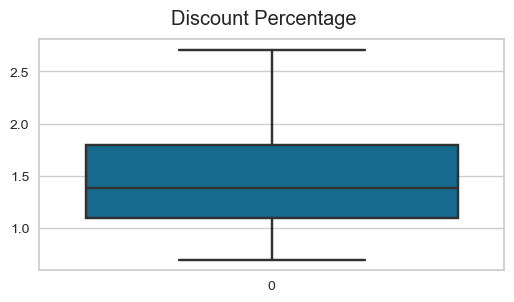

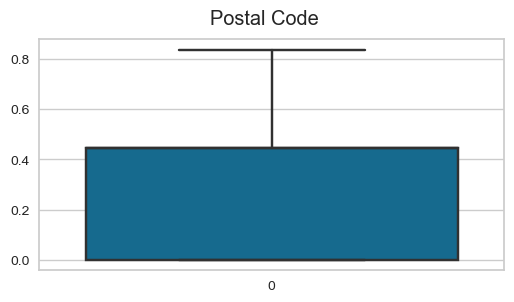

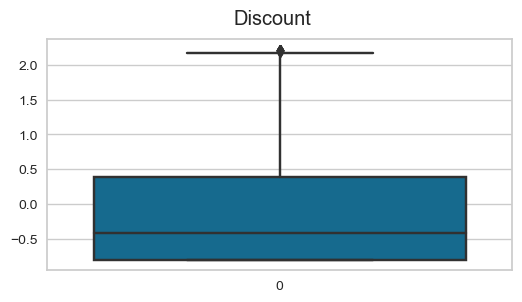

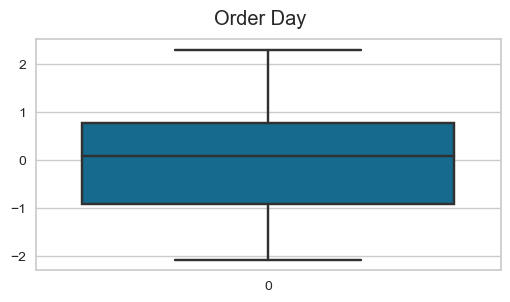

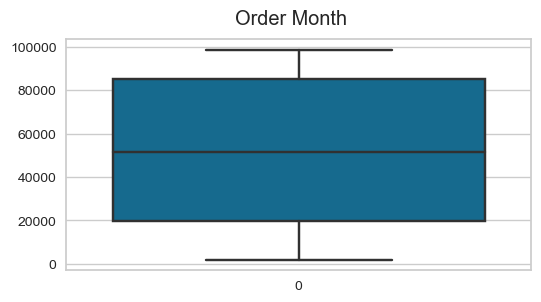

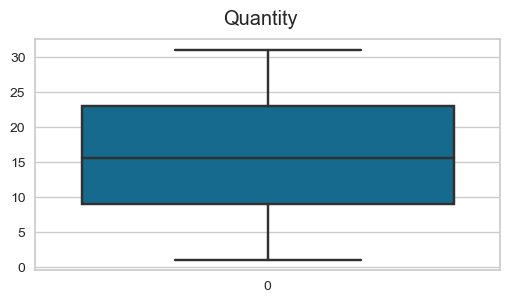

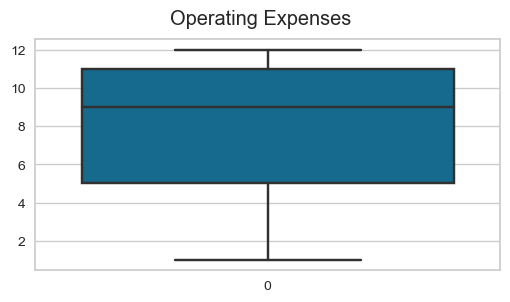

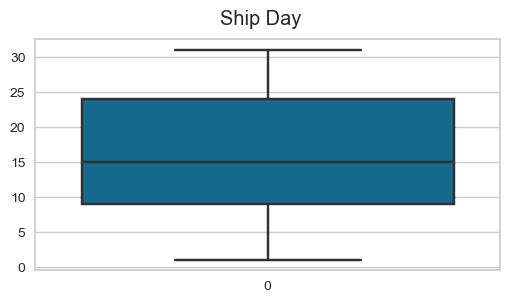

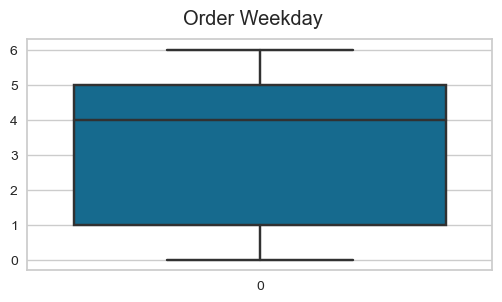

In [90]:
for col in final_X_train.columns:
    plt.figure(figsize=(6,3))
    sns.boxplot(final_X_train[col])
    plt.suptitle(col)
    plt.show()

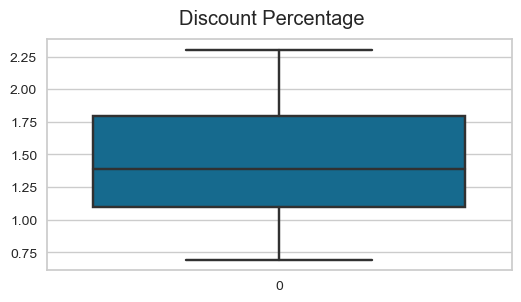

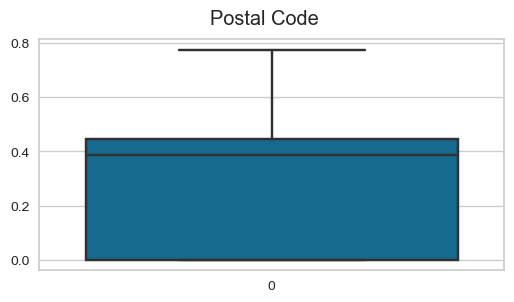

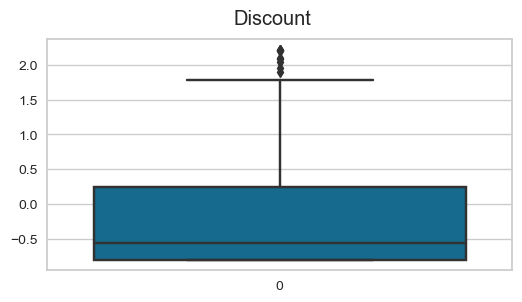

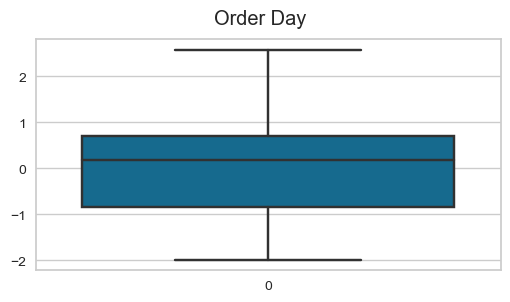

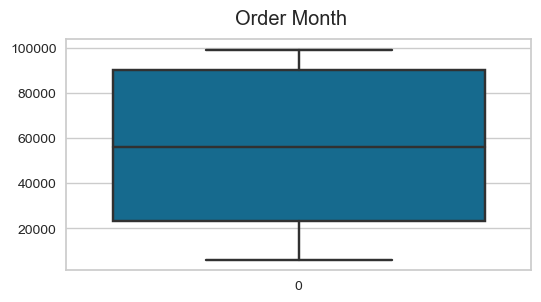

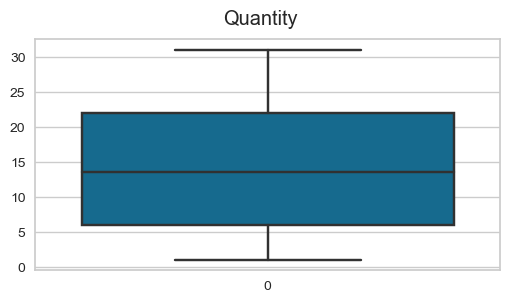

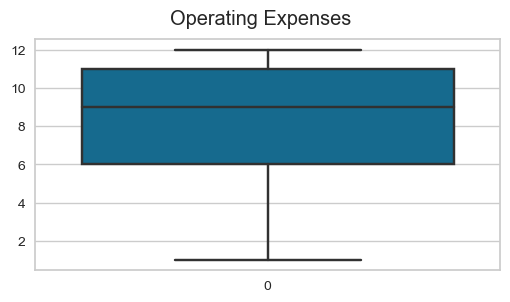

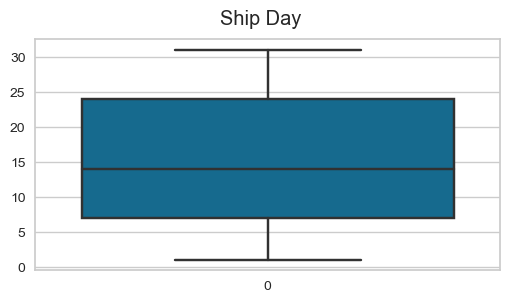

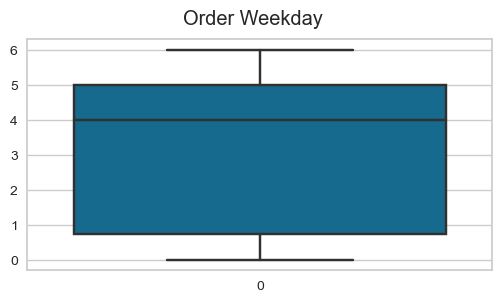

In [91]:
for col in final_X_test.columns:
    plt.figure(figsize=(6,3))
    sns.boxplot(final_X_test[col])
    plt.suptitle(col)
    plt.show()

In [92]:
def impute_outliers(data,col):
    winsorizer = Winsorizer(capping_method='iqr',fold=1.5,tail='both')
    fig = sns.boxplot(winsorizer.fit_transform(data[[col]]).values)
    plt.title(f"Box Plot of {col} after Outlier Removal")
    plt.show(fig)
    plt.close('all')
    del fig
    gc.collect()

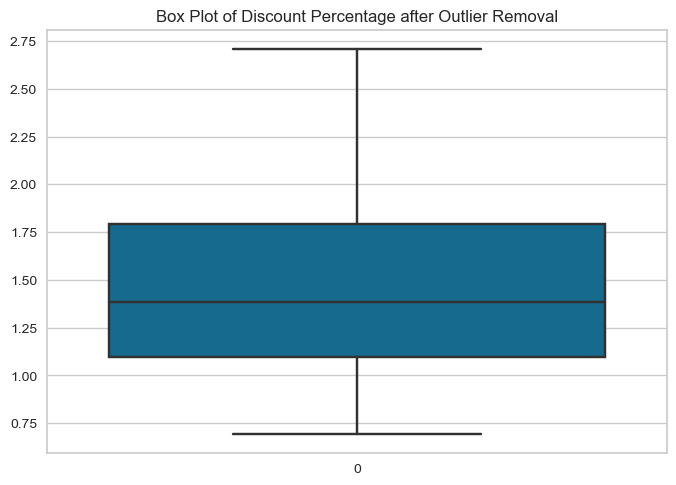

In [93]:
impute_outliers(final_X_train,'Discount Percentage')

In [94]:
winsorizer = Winsorizer(capping_method='iqr',fold=1.5,tail='both')
final_X_train['Discount Percentage'] = winsorizer.fit_transform(final_X_train[['Discount Percentage']])
final_X_test['Discount Percentage'] = winsorizer.transform(final_X_test[['Discount Percentage']])

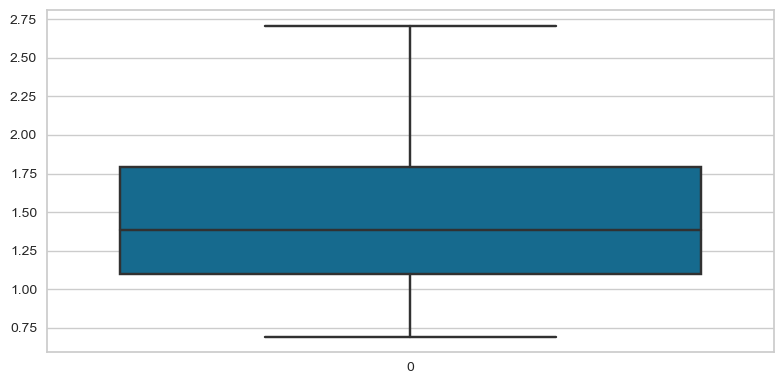

In [95]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(final_X_train['Discount Percentage'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

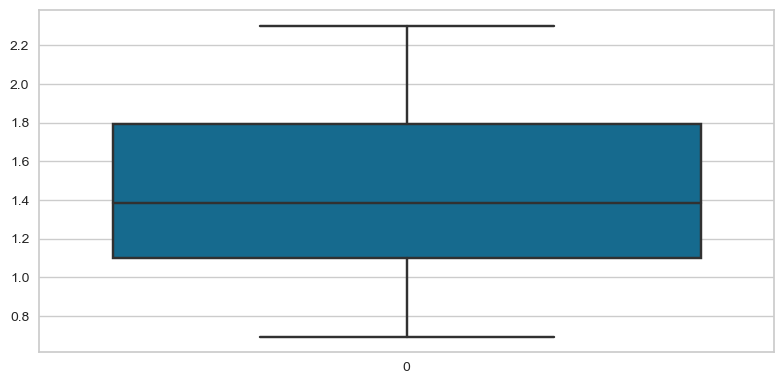

In [96]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(final_X_test['Discount Percentage'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

### Feature Scaling

In [97]:
scaler = StandardScaler()
features = final_X_train.columns
final_X_train = scaler.fit_transform(final_X_train)
final_X_train = pd.DataFrame(final_X_train,columns=features)
final_X_test = scaler.transform(final_X_test)
final_X_test = pd.DataFrame(final_X_test,columns=features)
final_X_train.head()

,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,0.277300,1.654876,1.963237,-0.027439,0.705860,-0.565322,-0.852291,-0.004176,1.317165
1,-0.212557,0.442453,1.468772,-0.777913,-0.611973,0.592567,0.665759,1.157567,0.849044
2,-0.212557,1.654876,2.190162,-0.807122,0.224487,-0.796900,-0.548681,-0.352699,0.380922
3,-0.212557,-1.213747,-0.799752,-0.224686,1.403512,0.129411,-0.548681,0.576695,0.849044
4,1.309076,0.442453,-0.656769,1.528647,-1.241218,1.750456,1.272980,-1.398268,-0.555321


In [98]:
final_X_test.head()

,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,-0.212557,0.220565,-0.273247,0.447350,1.204241,-1.260056,0.362149,-0.817396,0.849044
1,1.567640,-1.213747,-0.799752,-0.998067,-1.353112,1.055723,0.362149,-1.746790,-1.491563
2,-0.212557,-1.213747,-0.799752,-1.168035,1.138918,-1.607423,-1.155901,-1.049745,1.317165
3,-1.734190,-1.213747,-0.799752,-0.661752,1.425474,0.592567,0.969370,1.041392,-1.023442
4,-1.734190,0.220565,-0.423843,0.622596,1.212620,1.750456,0.665759,1.738438,0.849044


In [99]:
imputer = SimpleImputer(strategy='mean')
y_train = imputer.fit_transform(y_train.values.reshape(-1,1))
y_test = imputer.transform(y_test.values.reshape(-1,1))

## Model Training & Evaluation

In [100]:
models = []
mae_scores = []
mse_scores = []
rmse_scores = []
mape_scores = []
r2_scores = []
training_times = []

In [101]:
def train_and_evaluate_model(model):
    start_time = time.time()
    model.fit(final_X_train,y_train)
    duration = time.time() - start_time
    y_pred = model.predict(final_X_test)
    r2 = r2_score(y_test,y_pred)
    mae = mean_absolute_error(y_test,y_pred)
    mse = mean_squared_error(y_test,y_pred)
    rmse = np.sqrt(mean_squared_error(y_test,y_pred))
    mape = mean_absolute_percentage_error(y_test,y_pred)
    print("Mean Absolute Error:",mae)
    print("Mean Squared Error:",mse)
    print("Root Mean Squared Error:",rmse)
    print("Mean Absolute Percentage Error:",mape)
    print("R2 Score:",r2)
    print("Training Time:",duration)
    training_times.append(duration)
    mae_scores.append(mae)
    mse_scores.append(mse)
    rmse_scores.append(rmse)
    mape_scores.append(mape)
    r2_scores.append(r2)
    models.append(model)
    
    try:
        prediction_error = PredictionError(estimator=model)
        prediction_error.score(final_X_test,y_test)
        prediction_error.show()
        res_plot = ResidualsPlot(estimator=model)
        res_plot.score(final_X_test,y_test)
        res_plot.show()
        del r2, mae, mape, rmse, duration, prediction_error, res_plot
    except Exception as e:
        pass
    
    gc.collect()

Mean Absolute Error: 189.13178830471634
Mean Squared Error: 68806.07169535267
Root Mean Squared Error: 262.3091147774943
Mean Absolute Percentage Error: 4.561798821735623
R2 Score: 0.6809302187165271
Training Time: 0.03900456428527832


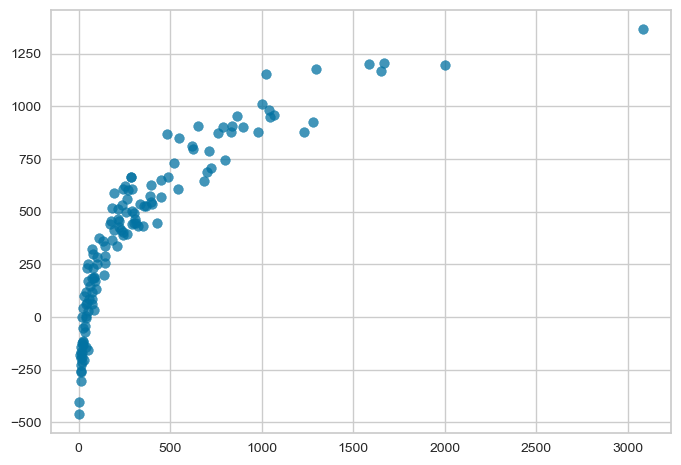

In [102]:
train_and_evaluate_model(LinearRegression())

Mean Absolute Error: 165.08522692968154
Mean Squared Error: 91152.90202879708
Root Mean Squared Error: 301.9153888572046
Mean Absolute Percentage Error: 2.65537263196866
R2 Score: 0.5773027612671204
Training Time: 0.0260012149810791


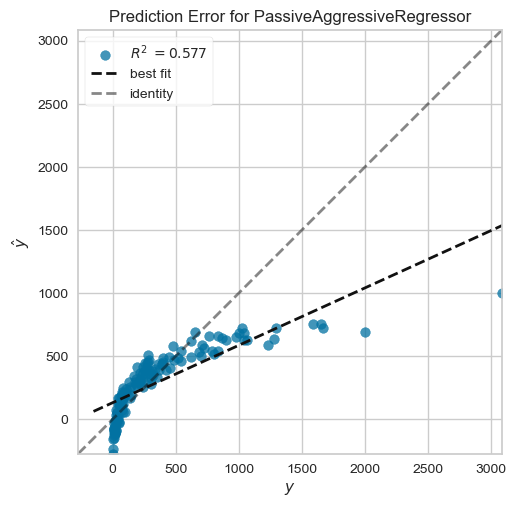

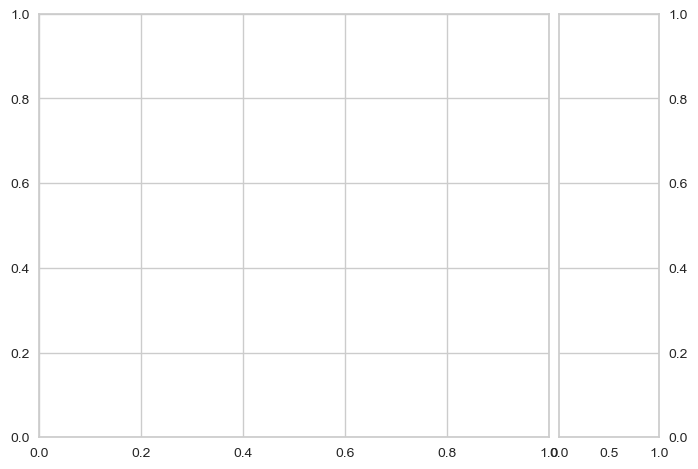

In [103]:
train_and_evaluate_model(PassiveAggressiveRegressor())

Mean Absolute Error: 189.1038007970251
Mean Squared Error: 69189.64889283551
Root Mean Squared Error: 263.0392535209061
Mean Absolute Percentage Error: 4.539449305475117
R2 Score: 0.6791514819060889
Training Time: 0.008998394012451172


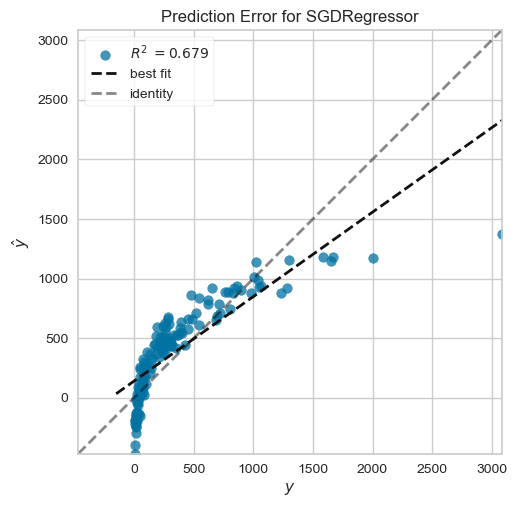

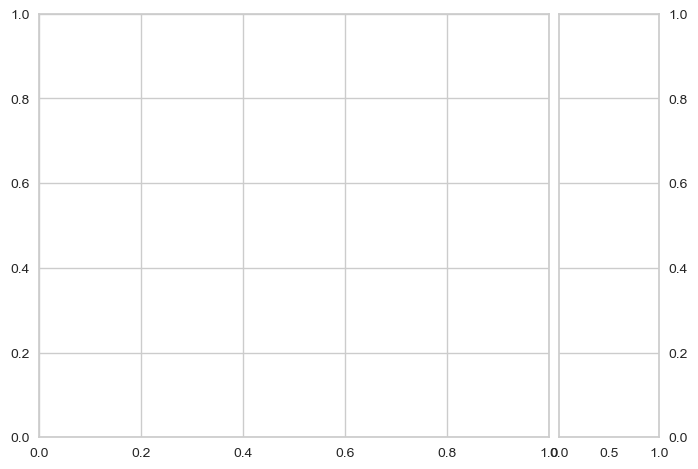

In [104]:
train_and_evaluate_model(SGDRegressor())

Mean Absolute Error: 189.12896536243235
Mean Squared Error: 68805.37454336081
Root Mean Squared Error: 262.30778589923864
Mean Absolute Percentage Error: 4.561582681914562
R2 Score: 0.6809334515726994
Training Time: 0.0189974308013916


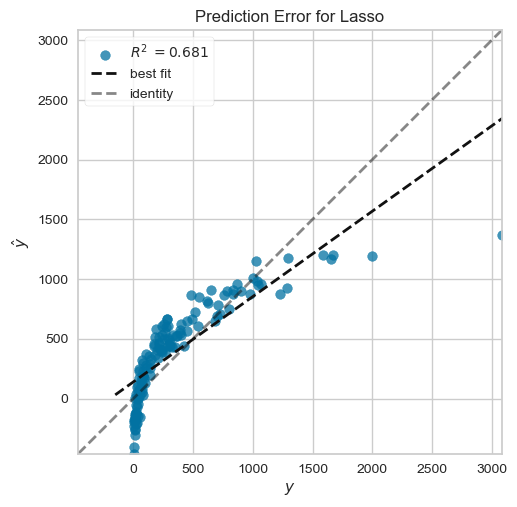

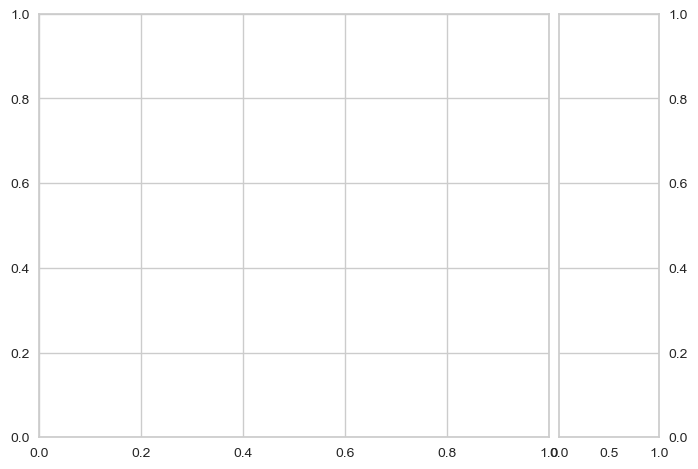

In [105]:
train_and_evaluate_model(Lasso(alpha=0.01))

Mean Absolute Error: 189.13143215439277
Mean Squared Error: 68806.10498852066
Root Mean Squared Error: 262.3091782391929
Mean Absolute Percentage Error: 4.5617667969650135
R2 Score: 0.6809300643283523
Training Time: 0.003999471664428711


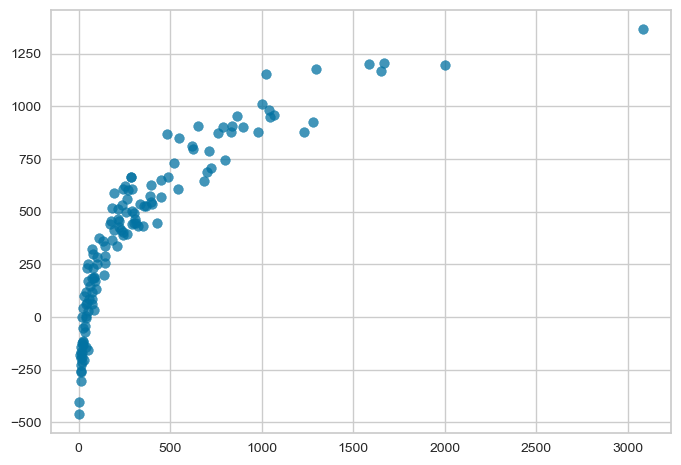

In [106]:
train_and_evaluate_model(Ridge(alpha=0.001))

Mean Absolute Error: 192.77449178962996
Mean Squared Error: 92717.85941218489
Root Mean Squared Error: 304.4960745431456
Mean Absolute Percentage Error: 2.42161371993781
R2 Score: 0.570045689358607
Training Time: 0.004000663757324219


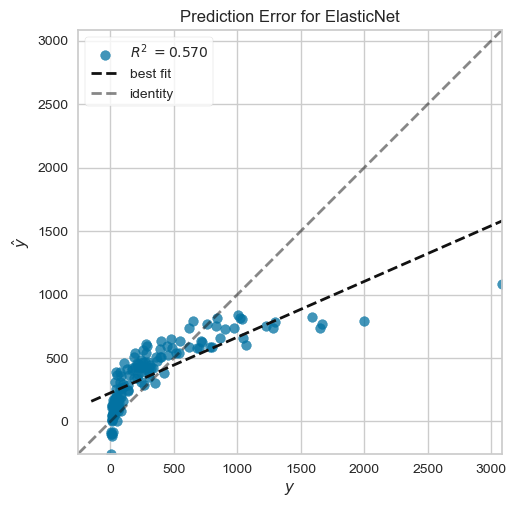

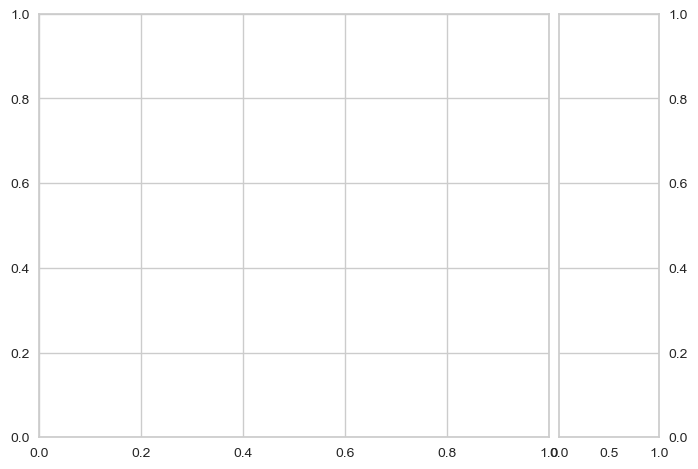

In [107]:
train_and_evaluate_model(ElasticNet(l1_ratio=0.3))

In [108]:
train_and_evaluate_model(PoissonRegressor())

Mean Absolute Error: 47.436608969715294
Mean Squared Error: 21535.496510338202
Root Mean Squared Error: 146.74977516281993
Mean Absolute Percentage Error: 0.2774233460384886
R2 Score: 0.900134886470365
Training Time: 0.41902947425842285


In [109]:
train_and_evaluate_model(TweedieRegressor())

Mean Absolute Error: 203.1806825502846
Mean Squared Error: 101187.25233957988
Root Mean Squared Error: 318.099437817139
Mean Absolute Percentage Error: 2.387106764882042
R2 Score: 0.5307711415990344
Training Time: 0.011999368667602539


Mean Absolute Error: 163.75325781261287
Mean Squared Error: 73161.28602913818
Root Mean Squared Error: 270.48343023027894
Mean Absolute Percentage Error: 4.414514636314161
R2 Score: 0.6607340754012063
Training Time: 1.7322216033935547


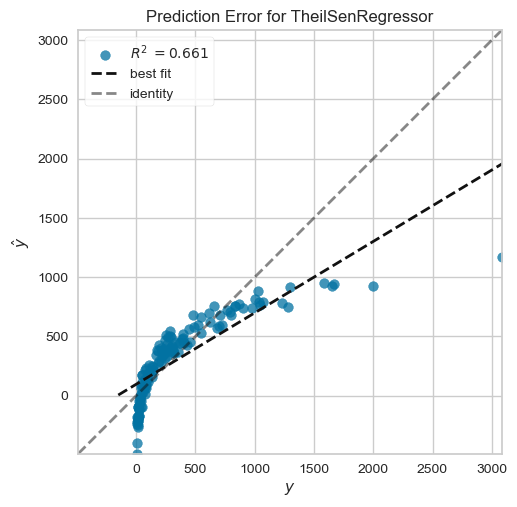

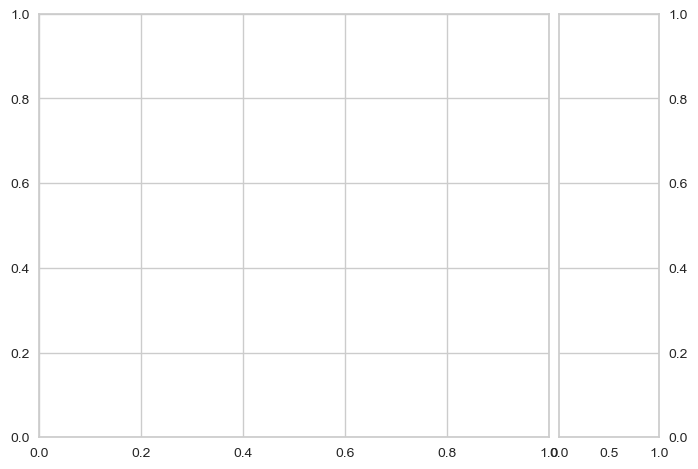

In [110]:
train_and_evaluate_model(TheilSenRegressor())

In [111]:
train_and_evaluate_model(GammaRegressor())

Mean Absolute Error: 160.76663219475785
Mean Squared Error: 94637.59954261348
Root Mean Squared Error: 307.6322472411068
Mean Absolute Percentage Error: 1.126916639057018
R2 Score: 0.561143407213377
Training Time: 0.011001825332641602


Mean Absolute Error: 162.70632476985796
Mean Squared Error: 76315.97958621063
Root Mean Squared Error: 276.2534698175041
Mean Absolute Percentage Error: 3.2476336356213107
R2 Score: 0.6461050265619093
Training Time: 0.020999908447265625


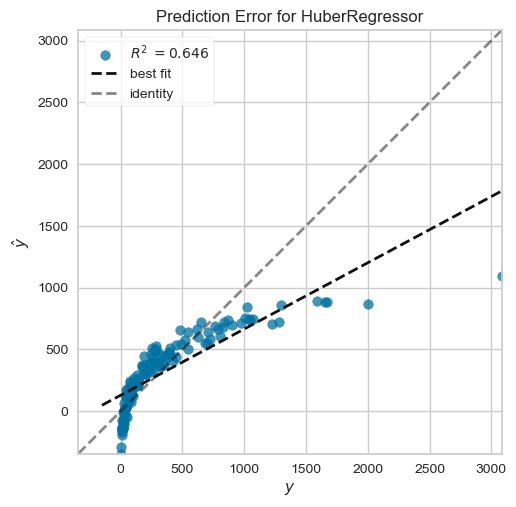

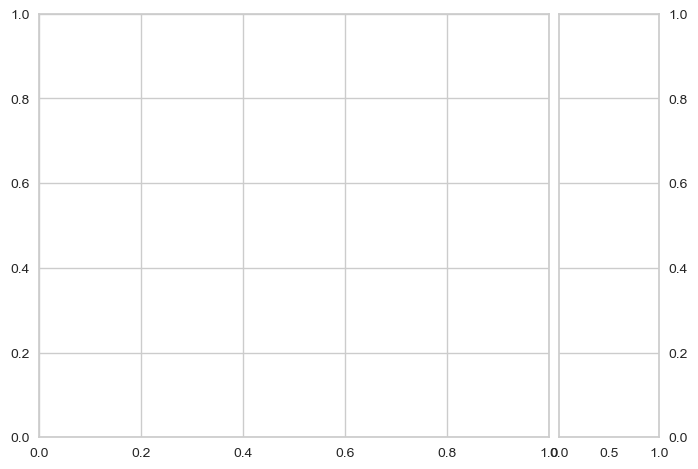

In [112]:
train_and_evaluate_model(HuberRegressor())

Mean Absolute Error: 187.97605877598653
Mean Squared Error: 69064.02895974829
Root Mean Squared Error: 262.80035951221276
Mean Absolute Percentage Error: 4.454089069446967
R2 Score: 0.679734010796162
Training Time: 0.0260009765625


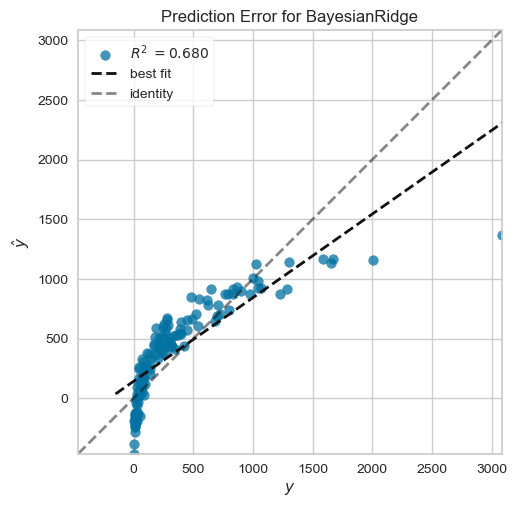

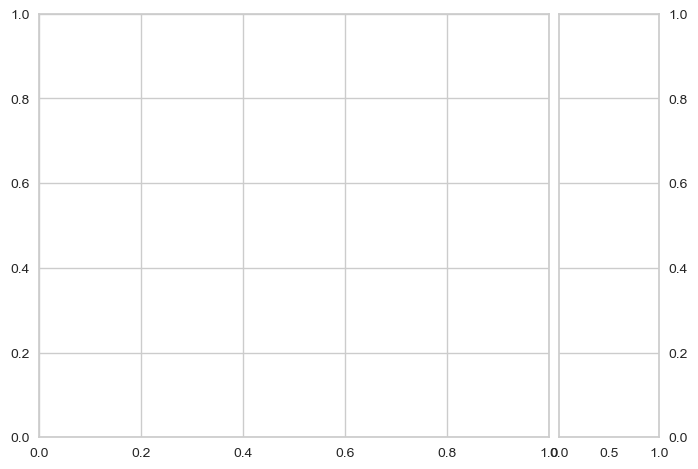

In [113]:
train_and_evaluate_model(BayesianRidge())

Mean Absolute Error: 187.76233198849192
Mean Squared Error: 68185.56228793136
Root Mean Squared Error: 261.123653252499
Mean Absolute Percentage Error: 4.612158682439938
R2 Score: 0.6838076653724976
Training Time: 0.05900263786315918


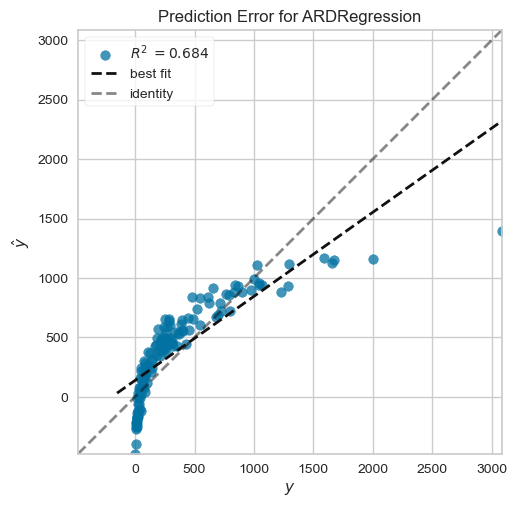

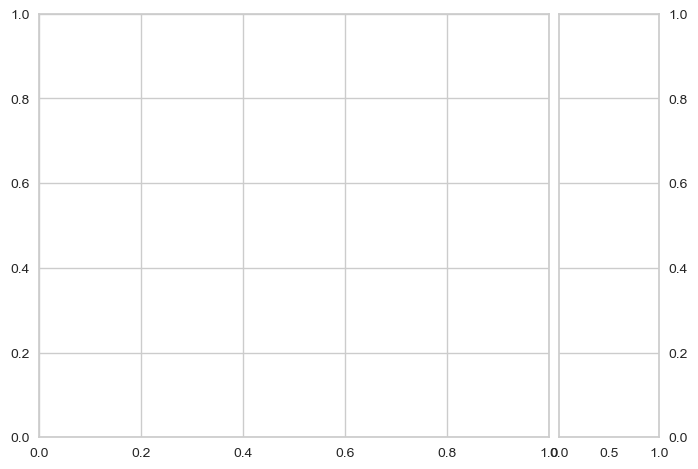

In [114]:
train_and_evaluate_model(ARDRegression())

Mean Absolute Error: 171.2532667968988
Mean Squared Error: 99253.85605453815
Root Mean Squared Error: 315.04579993159433
Mean Absolute Percentage Error: 2.8758814485581294
R2 Score: 0.5397367505141006
Training Time: 0.2720181941986084


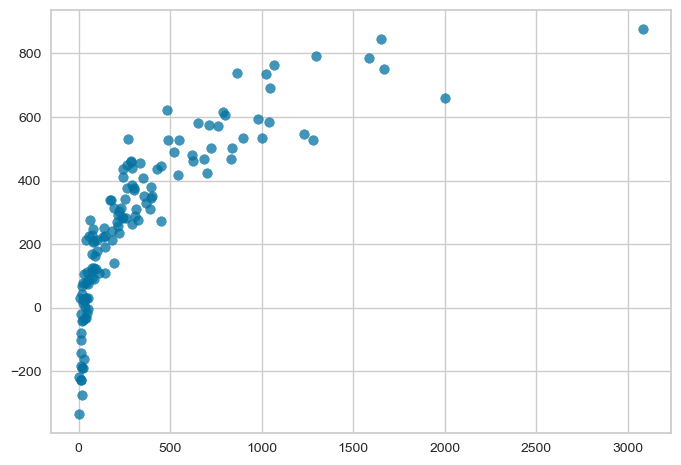

In [115]:
train_and_evaluate_model(RANSACRegressor())

Mean Absolute Error: 163.18807984848488
Mean Squared Error: 105007.90894789516
Root Mean Squared Error: 324.04923846214353
Mean Absolute Percentage Error: 0.92266212731213
R2 Score: 0.5130538669699589
Training Time: 0.013999462127685547


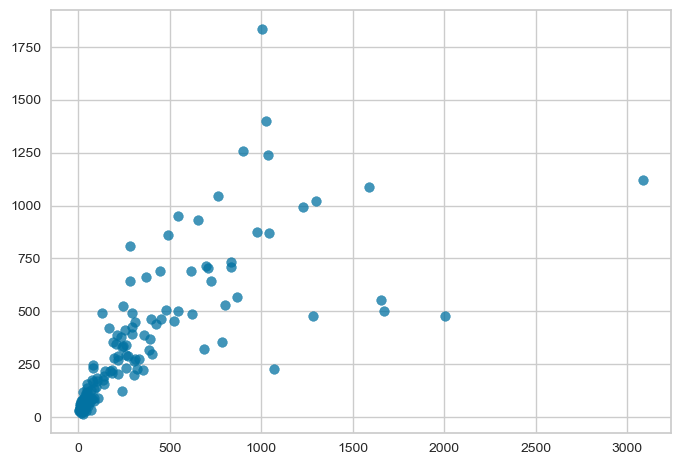

In [116]:
train_and_evaluate_model(KNeighborsRegressor())

Mean Absolute Error: 282.5045408333319
Mean Squared Error: 235450.58497733308
Root Mean Squared Error: 485.23250610128446
Mean Absolute Percentage Error: 3.1945531909236777
R2 Score: -0.0918392054760706
Training Time: 0.027999401092529297


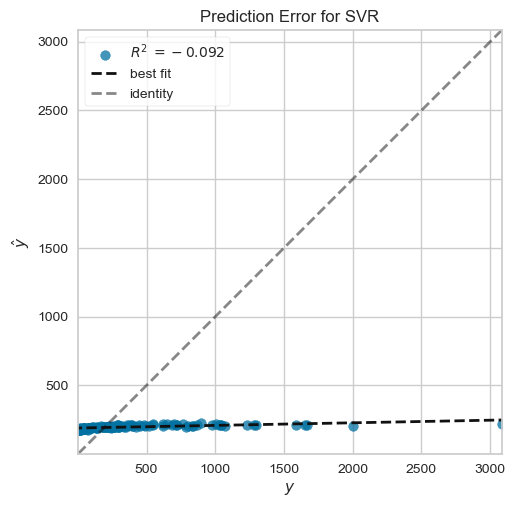

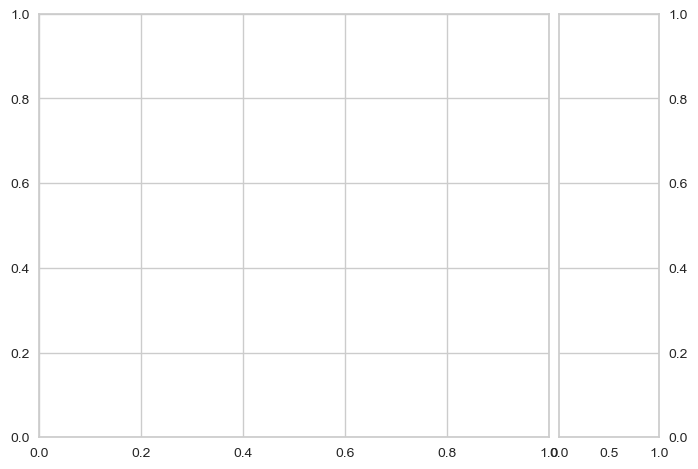

In [117]:
train_and_evaluate_model(SVR())

Mean Absolute Error: 212.07655605684215
Mean Squared Error: 187869.92876376174
Root Mean Squared Error: 433.4396483522957
Mean Absolute Percentage Error: 0.9136782785148807
R2 Score: 0.1288033802336107
Training Time: 0.00800013542175293


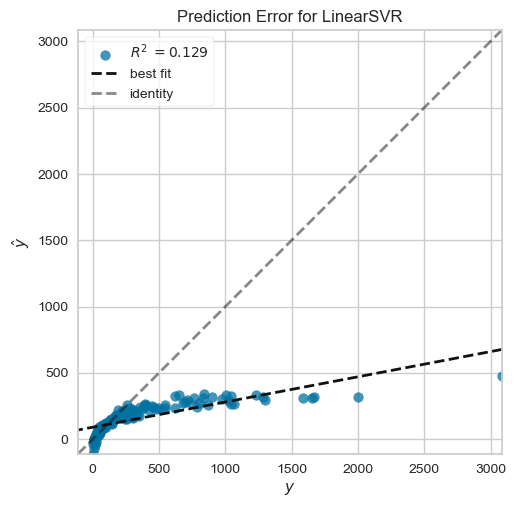

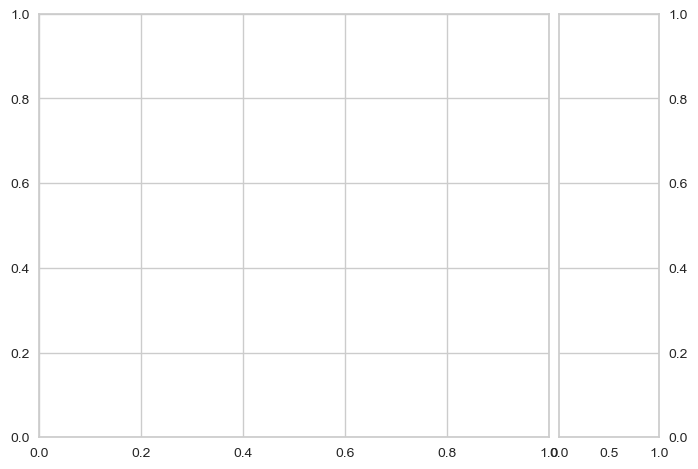

In [118]:
train_and_evaluate_model(LinearSVR())

Mean Absolute Error: 290.74001944413567
Mean Squared Error: 217513.4842507628
Root Mean Squared Error: 466.383409064648
Mean Absolute Percentage Error: 4.704020635919484
R2 Score: -0.008660691361407347
Training Time: 0.015930891036987305


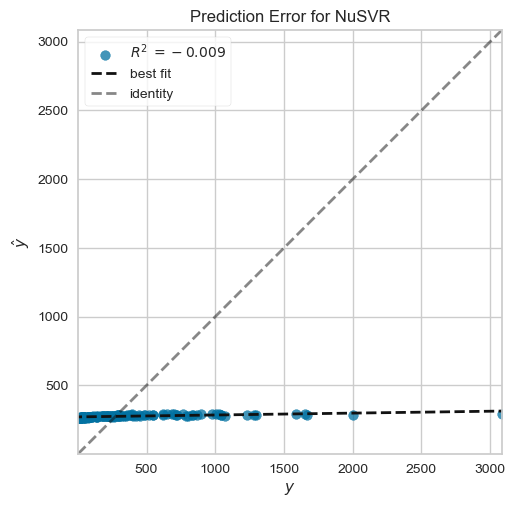

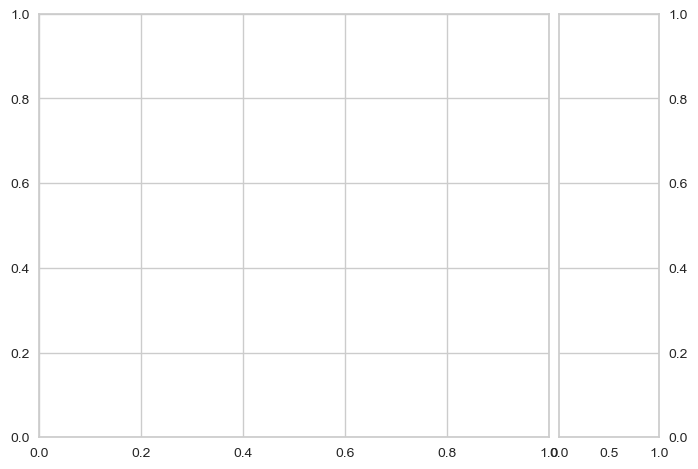

In [119]:
train_and_evaluate_model(NuSVR())

Mean Absolute Error: 46.81842272727272
Mean Squared Error: 12870.330240251813
Root Mean Squared Error: 113.44747789286376
Mean Absolute Percentage Error: 0.1553231945361079
R2 Score: 0.9403172808210096
Training Time: 0.008120536804199219


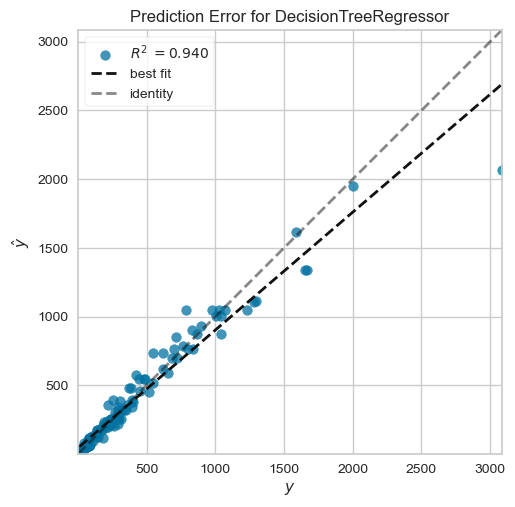

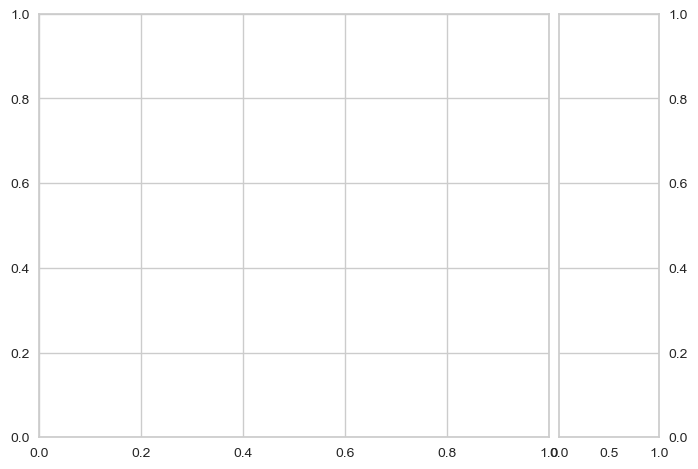

In [120]:
train_and_evaluate_model(DecisionTreeRegressor())

Mean Absolute Error: 29.505979393939413
Mean Squared Error: 2661.43860800382
Root Mean Squared Error: 51.58913265411447
Mean Absolute Percentage Error: 0.10992403342103624
R2 Score: 0.9876582892522183
Training Time: 0.4585418701171875


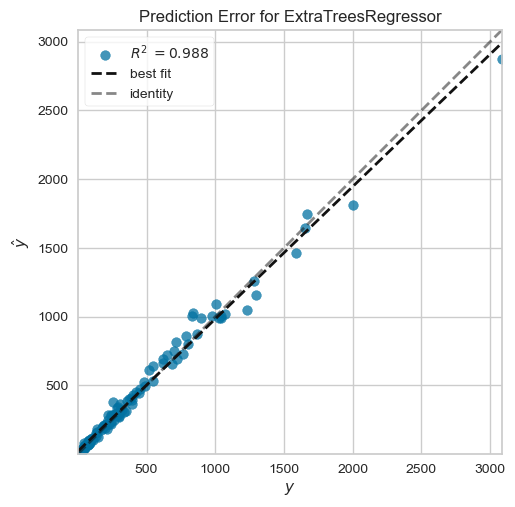

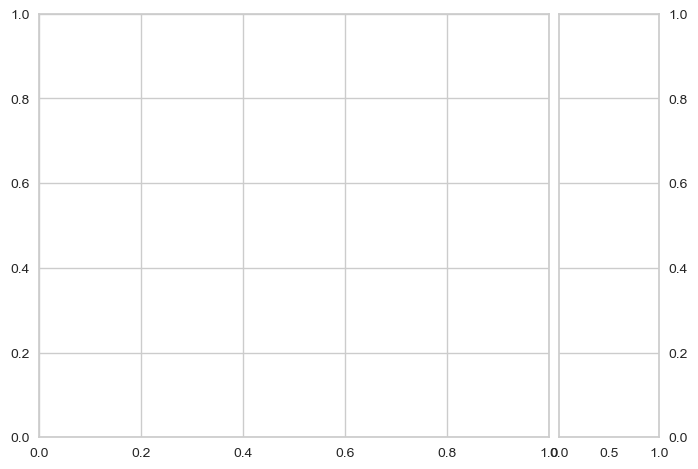

In [121]:
train_and_evaluate_model(ExtraTreesRegressor())

Mean Absolute Error: 77.62299901920537
Mean Squared Error: 14667.53532068319
Root Mean Squared Error: 121.1096004480371
Mean Absolute Percentage Error: 1.6133812121846485
R2 Score: 0.93198322224441
Training Time: 0.20801424980163574


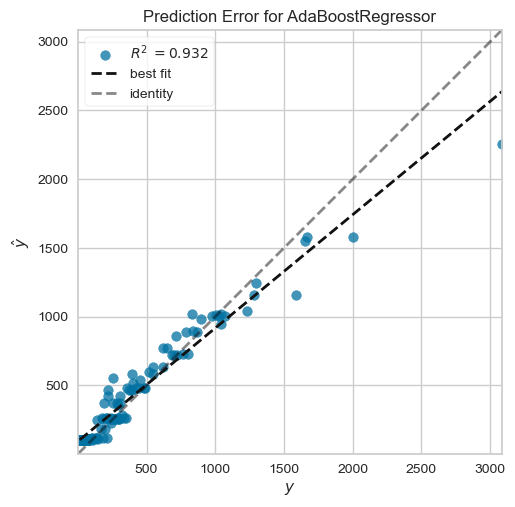

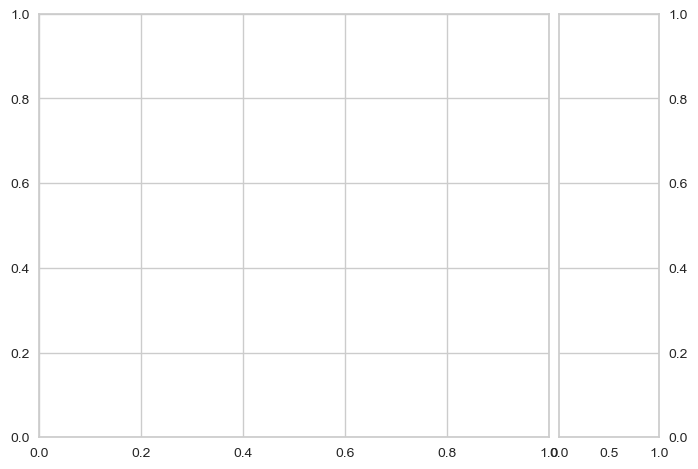

In [122]:
train_and_evaluate_model(AdaBoostRegressor())

Mean Absolute Error: 39.48675378787879
Mean Squared Error: 6334.947835985802
Root Mean Squared Error: 79.59238554023747
Mean Absolute Percentage Error: 0.12325777101863164
R2 Score: 0.9706233713004324
Training Time: 0.09400343894958496


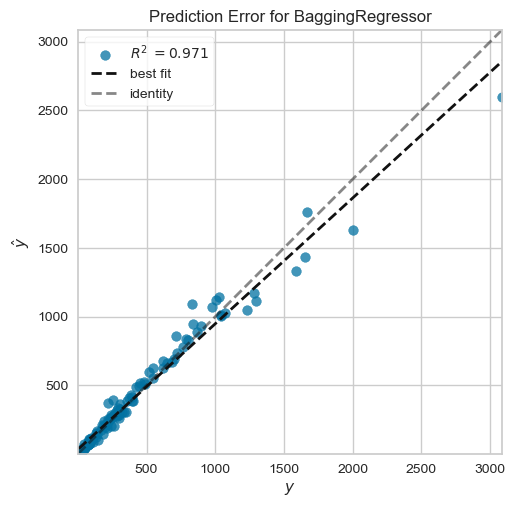

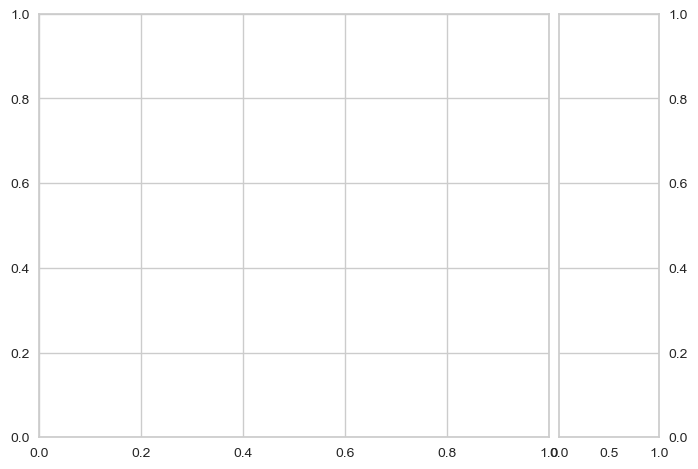

In [123]:
train_and_evaluate_model(BaggingRegressor())

Mean Absolute Error: 32.90799044824875
Mean Squared Error: 5480.227787969747
Root Mean Squared Error: 74.02856062338202
Mean Absolute Percentage Error: 0.17314408451424534
R2 Score: 0.9745869072509596
Training Time: 0.24301576614379883


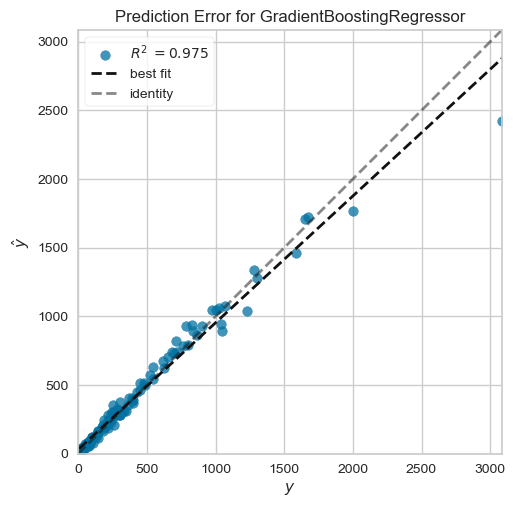

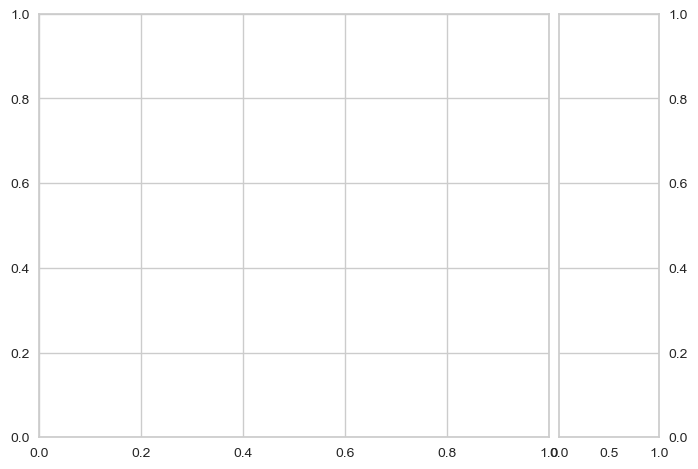

In [124]:
train_and_evaluate_model(GradientBoostingRegressor())

Mean Absolute Error: 46.93907441644987
Mean Squared Error: 22507.442910359692
Root Mean Squared Error: 150.0248076498007
Mean Absolute Percentage Error: 0.24881389975972176
R2 Score: 0.8956277446203375
Training Time: 0.34105730056762695


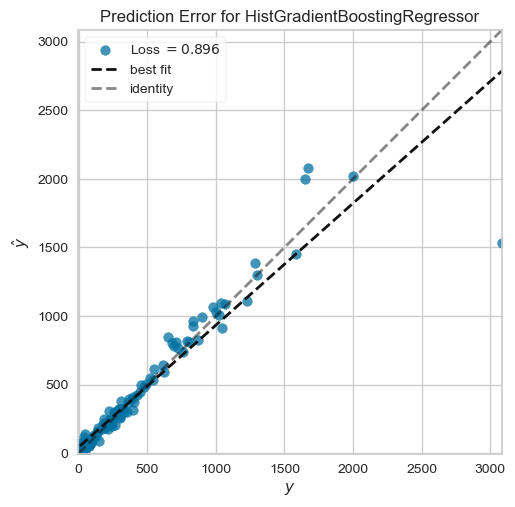

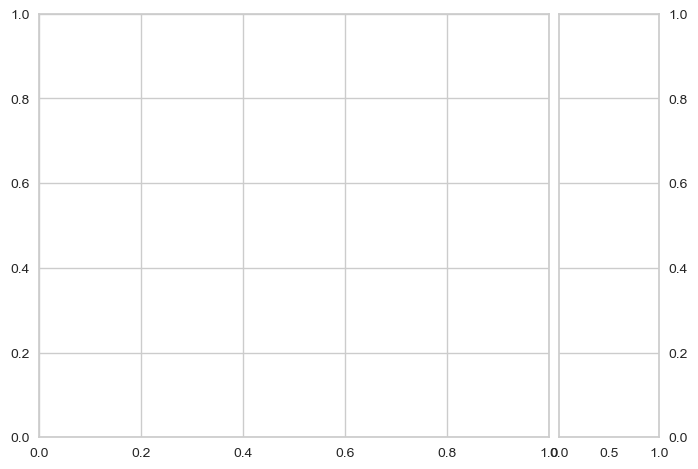

In [125]:
train_and_evaluate_model(HistGradientBoostingRegressor())

Mean Absolute Error: 40.21088010606064
Mean Squared Error: 7024.390065470876
Root Mean Squared Error: 83.81163442786972
Mean Absolute Percentage Error: 0.11989679917924087
R2 Score: 0.9674262670921966
Training Time: 0.8260598182678223


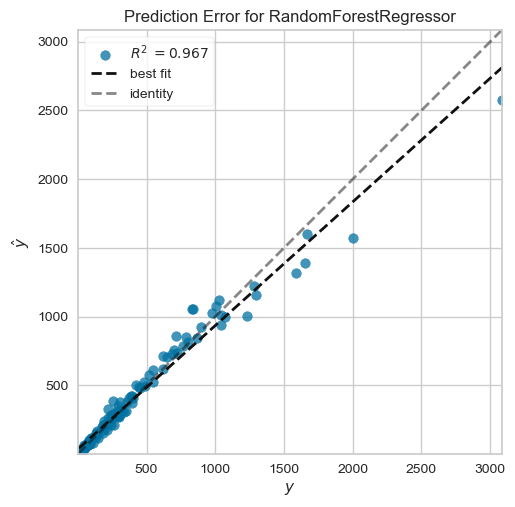

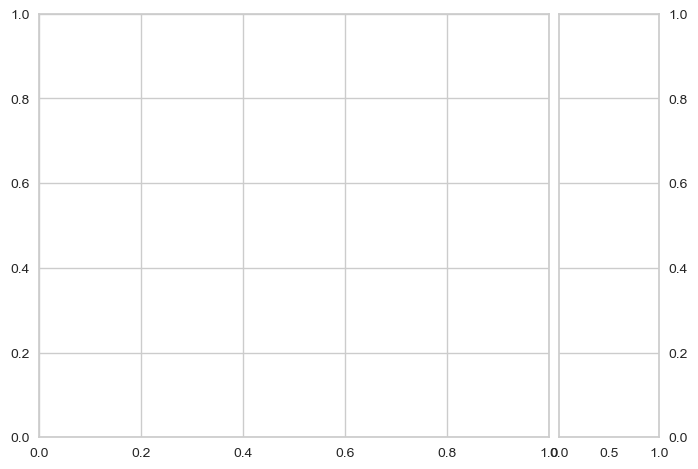

In [126]:
train_and_evaluate_model(RandomForestRegressor())

Mean Absolute Error: 27.56097690596725
Mean Squared Error: 2352.954123630438
Root Mean Squared Error: 48.50725846335204
Mean Absolute Percentage Error: 0.11358421159838457
R2 Score: 0.9890888036608038
Training Time: 0.17152047157287598


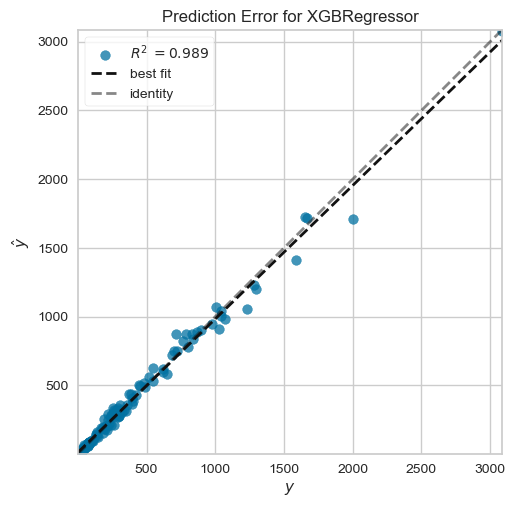

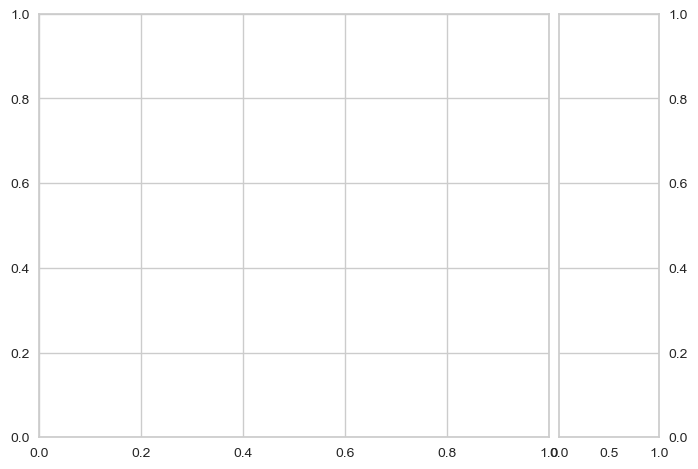

In [127]:
train_and_evaluate_model(XGBRegressor())

In [128]:
train_and_evaluate_model(CatBoostRegressor(silent=True))

Mean Absolute Error: 40.73535484158054
Mean Squared Error: 14508.506407554494
Root Mean Squared Error: 120.45126154405563
Mean Absolute Percentage Error: 0.25643091400864537
R2 Score: 0.9327206763568084
Training Time: 3.9998934268951416


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002356 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 351
[LightGBM] [Info] Number of data points in the train set: 306, number of used features: 9
[LightGBM] [Info] Start training from score 381.015599
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

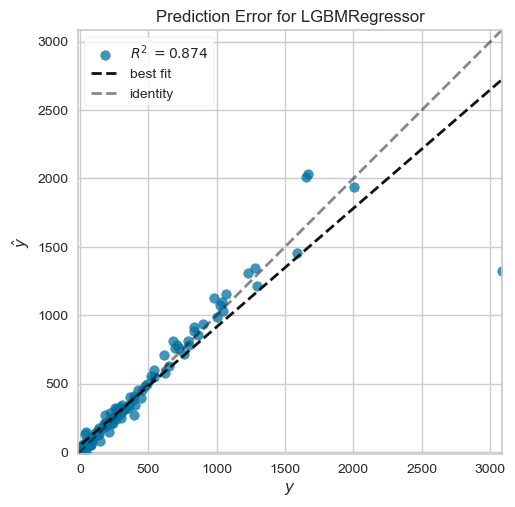

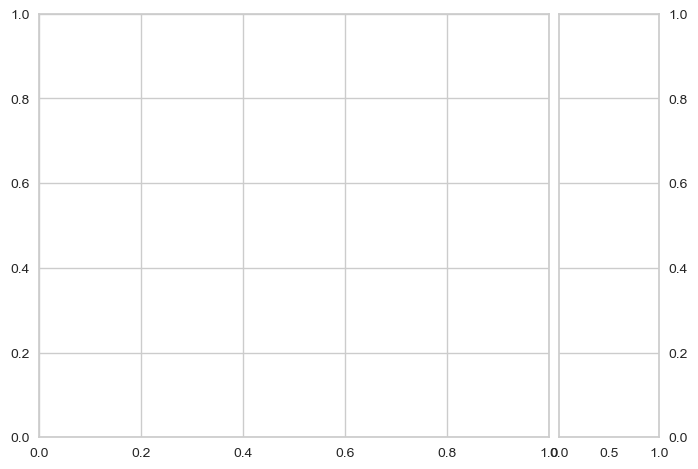

In [129]:
train_and_evaluate_model(LGBMRegressor())

In [130]:
train_and_evaluate_model(NGBRegressor())

[iter 0] loss=7.6549 val_loss=0.0000 scale=1.0000 norm=355.0745
[iter 100] loss=6.4245 val_loss=0.0000 scale=2.0000 norm=122.4979
[iter 200] loss=5.4908 val_loss=0.0000 scale=2.0000 norm=42.2419
[iter 300] loss=4.6811 val_loss=0.0000 scale=2.0000 norm=28.4115
[iter 400] loss=4.1278 val_loss=0.0000 scale=1.0000 norm=12.1496
Mean Absolute Error: 32.826543283142314
Mean Squared Error: 5054.166285917937
Root Mean Squared Error: 71.09265985963626
Mean Absolute Percentage Error: 0.16808732714197278
R2 Score: 0.9765626536774507
Training Time: 18.884387969970703


Mean Absolute Error: 37.65886341883919
Mean Squared Error: 4627.386357299805
Root Mean Squared Error: 68.02489512891442
Mean Absolute Percentage Error: 0.13738766713150644
R2 Score: 0.9785417316152711
Training Time: 0.08200240135192871


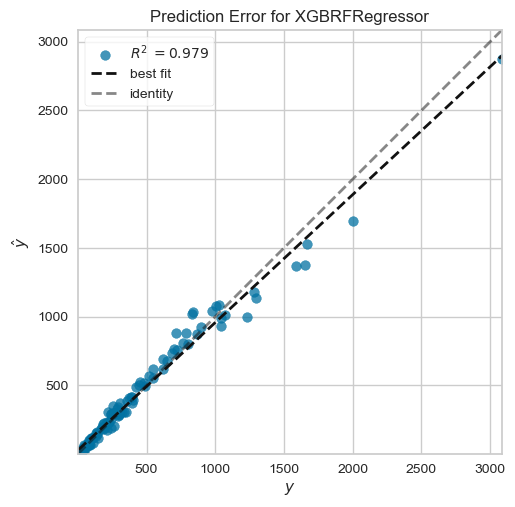

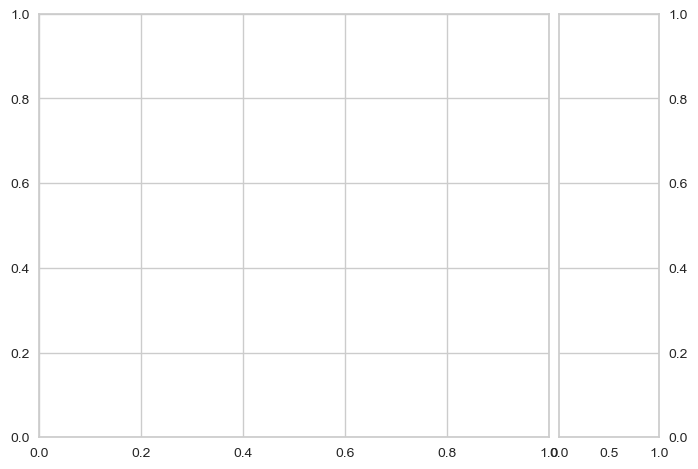

In [131]:
train_and_evaluate_model(XGBRFRegressor())

Mean Absolute Error: 319.5727856970239
Mean Squared Error: 292810.99747326504
Root Mean Squared Error: 541.1201322010345
Mean Absolute Percentage Error: 0.7693356060923308
R2 Score: -0.35783279904207177
Training Time: 0.5150356292724609


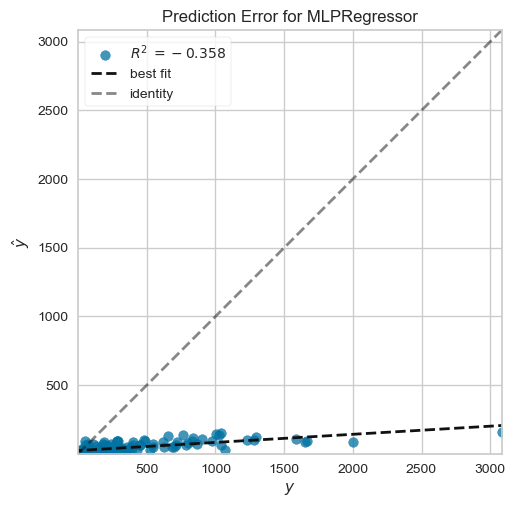

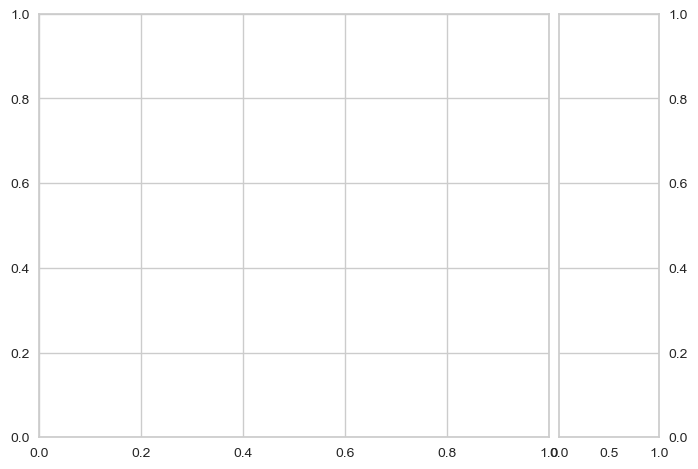

In [132]:
train_and_evaluate_model(MLPRegressor())

## Baseline Models Performance Comparison

In [133]:
model_perfs = pd.DataFrame({'Model': models, 
                            'R2': r2_scores, 
                            'MAE': mape_scores, 
                            'MSE': mse_scores, 
                            'RMSE': rmse_scores, 
                            'Training Time': training_times}).sort_values('R2',ascending=False).reset_index(drop=True)
model_perfs

,Model,R2,MAE,MSE,RMSE,Training Time
0,"XGBRegressor(base_score=0.5, booster='gbtree',...",0.989089,0.113584,2352.954124,48.507258,0.171520
1,"(ExtraTreeRegressor(random_state=1460934559), ...",0.987658,0.109924,2661.438608,51.589133,0.458542
2,"XGBRFRegressor(base_score=0.5, booster='gbtree...",0.978542,0.137388,4627.386357,68.024895,0.082002
3,NGBRegressor(random_state=RandomState(MT19937)...,0.976563,0.168087,5054.166286,71.092660,18.884388
4,([DecisionTreeRegressor(criterion='friedman_ms...,0.974587,0.173144,5480.227788,74.028561,0.243016
5,(DecisionTreeRegressor(random_state=1864396907...,0.970623,0.123258,6334.947836,79.592386,0.094003
6,"(DecisionTreeRegressor(max_features=1.0, rando...",0.967426,0.119897,7024.390065,83.811634,0.826060
7,DecisionTreeRegressor(),0.940317,0.155323,12870.330240,113.447478,0.008121
8,<catboost.core.CatBoostRegressor object at 0x0...,0.932721,0.256431,14508.506408,120.451262,3.999893
9,"(DecisionTreeRegressor(max_depth=3, random_sta...",0.931983,1.613381,14667.535321,121.109600,0.208014


The Extra Trees Regressor is the best performing model which achieved an incredible r2 score of more than 97% on the test set. It's closely followed by the Decision Trees Regressor model which produced an amazing r2 score of approximately 96.2%.

## Cross Validation & Hyperparameter Tuning

In [134]:
print(f"Mean cross validation training R2 score of Extra Trees Regressor: {round(np.mean(cross_val_score(model_perfs['Model'].iloc[0],final_X_train,y_train,cv=5,scoring='r2',verbose=0))*100,2)}%")

Mean cross validation training R2 score of Extra Trees Regressor: 94.77%


In [135]:
print(f"Mean cross validation test R2 score of Extra Trees Regressor: {round(np.mean(cross_val_score(model_perfs['Model'].iloc[0],final_X_test,y_test,cv=5,scoring='r2',verbose=0))*100,2)}%")

Mean cross validation test R2 score of Extra Trees Regressor: 93.41%


The cross validation R2 score of the Extra Trees Regressor model on the test set is comparable to the training cross validation R2 score so there seems to be no overfitting.

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END algorithm=brute, metric=minkowski, n_neighbors=12, p=1, weights=distance; total time=   0.2s
[CV] END algorithm=brute, metric=minkowski, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, metric=minkowski, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, metric=minkowski, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, metric=minkowski, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, metric=manhattan, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, metric=manhattan, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, metric=manhattan, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, metric=manhattan, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END 

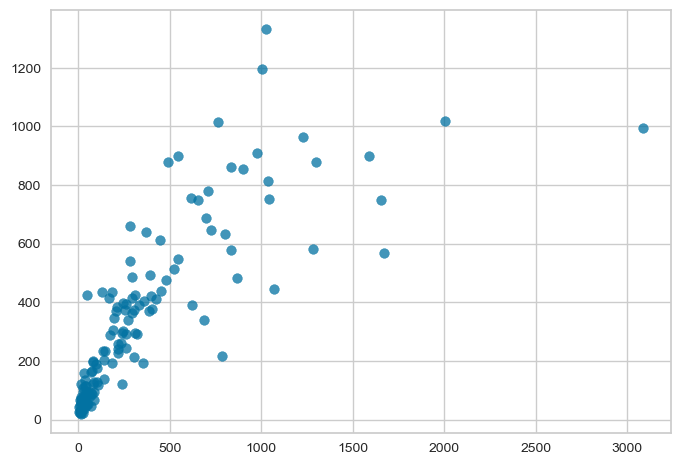

In [136]:
param_grid = {'n_neighbors': [2,8,12,20],
              'weights': ['uniform','distance'],
              'algorithm': ['ball_tree', 'brute', 'kd_tree'],
              'metric': ['minkowski','manhattan','euclidean','chebyshev'],
              'p': [1,2]
             }

grid_knn = RandomizedSearchCV(KNeighborsRegressor(),param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_knn)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END interaction_cst=no_interaction, learning_rate=0.5, loss=poisson, max_bins=200; total time=   0.0s
[CV] END interaction_cst=no_interaction, learning_rate=0.5, loss=poisson, max_bins=200; total time=   0.0s
[CV] END interaction_cst=no_interaction, learning_rate=0.5, loss=poisson, max_bins=200; total time=   0.0s
[CV] END interaction_cst=no_interaction, learning_rate=0.5, loss=poisson, max_bins=200; total time=   0.0s
[CV] END interaction_cst=no_interaction, learning_rate=0.5, loss=poisson, max_bins=200; total time=   0.0s
[CV] END interaction_cst=pairwise, learning_rate=1.0, loss=poisson, max_bins=100; total time=   0.1s
[CV] END interaction_cst=pairwise, learning_rate=1.0, loss=poisson, max_bins=100; total time=   0.1s
[CV] END interaction_cst=pairwise, learning_rate=1.0, loss=poisson, max_bins=100; total time=   0.2s
[CV] END interaction_cst=pairwise, learning_rate=1.0, loss=poisson, max_bins=100; total time=   0.2s


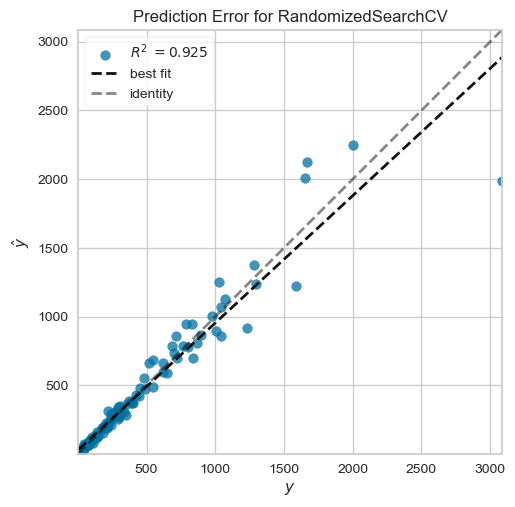

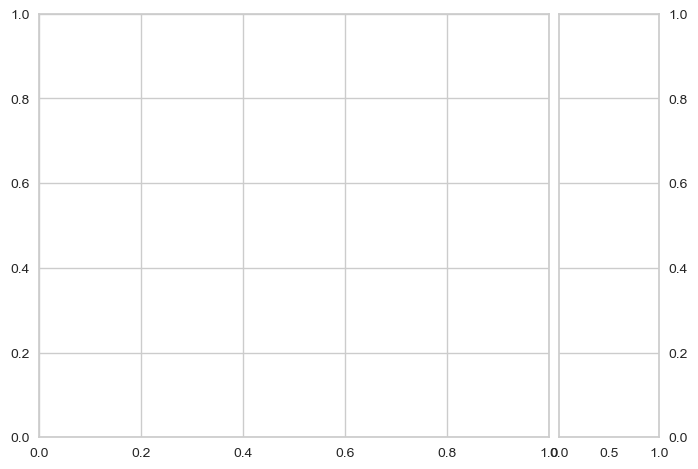

In [137]:
param_grid = {'learning_rate': [0.2,0.4,0.5,0.8,1.0],
              'loss': ['squared_error','absolute_error','poisson','quantile'],
              'max_bins': np.arange(0,255,50),
              'interaction_cst': ['pairwise','no_interaction']}

grid_hgb = RandomizedSearchCV(HistGradientBoostingRegressor(),param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_hgb)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Mean Absolute Error: 185.72573799862315
Mean Squared Error: 68858.95289243577
Root Mean Squared Error: 262.40989480664746
Mean Absolute Percentage Error: 4.478392478189952
R2 Score: 0.6806849962881634
Training Time: 21.667222023010254


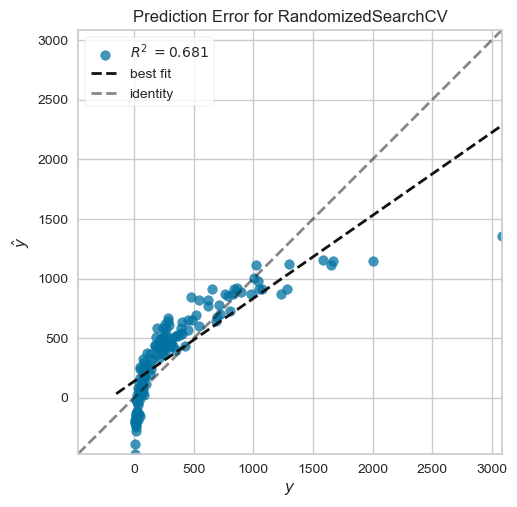

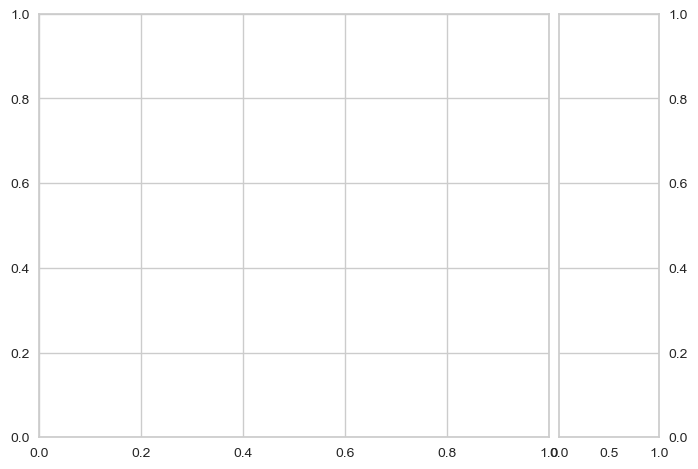

In [138]:
param_grid = {'loss': ['epsilon_insensitive','squared_epsilon_insensitive'],
             'C': [0.0001,0.001,0.01,0.1,1],
             'epsilon': np.linspace(0.001,1,5)}

grid_lsvr = RandomizedSearchCV(LinearSVR(),param_grid,cv=5,verbose=2,n_jobs=10)
train_and_evaluate_model(grid_lsvr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=poisson, max_features=sqrt, splitter=random; total time=   0.0s
[CV] END criterion=poisson, max_features=sqrt, splitter=random; total time=   0.0s
[CV] END criterion=poisson, max_features=sqrt, splitter=random; total time=   0.0s
[CV] END criterion=poisson, max_features=sqrt, splitter=random; total time=   0.0s
[CV] END criterion=poisson, max_features=sqrt, splitter=random; total time=   0.0s
[CV] END criterion=friedman_mse, max_features=auto, splitter=best; total time=   0.0s
[CV] END criterion=friedman_mse, max_features=auto, splitter=best; total time=   0.0s
[CV] END criterion=friedman_mse, max_features=auto, splitter=best; total time=   0.0s
[CV] END criterion=friedman_mse, max_features=auto, splitter=best; total time=   0.0s
[CV] END criterion=friedman_mse, max_features=auto, splitter=best; total time=   0.0s
[CV] END criterion=friedman_mse, max_features=log2, splitter=best; total time=   0.0s
[CV] END

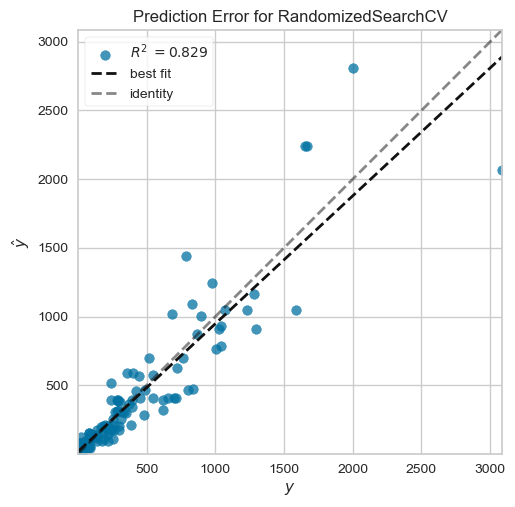

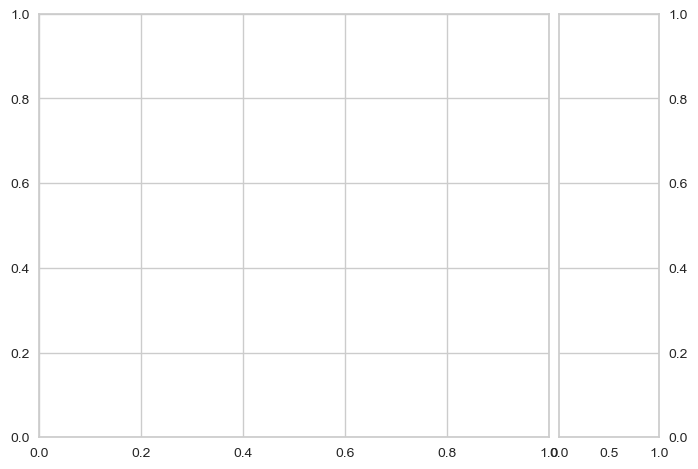

In [139]:
param_grid = {'criterion': ['squared_error','friedman_mse','absolute_error','poisson'],
              'splitter': ['best','random'],
              'max_features': ['auto','sqrt','log2']
             }

grid_dt = RandomizedSearchCV(DecisionTreeRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_dt)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END criterion=squared_error, learning_rate=1, loss=squared_error, max_features=auto, n_estimators=700;, score=nan total time=   0.0s
[CV 2/5] END criterion=squared_error, learning_rate=1, loss=squared_error, max_features=auto, n_estimators=700;, score=nan total time=   0.0s
[CV 3/5] END criterion=squared_error, learning_rate=1, loss=squared_error, max_features=auto, n_estimators=700;, score=nan total time=   0.0s
[CV 4/5] END criterion=squared_error, learning_rate=1, loss=squared_error, max_features=auto, n_estimators=700;, score=nan total time=   0.0s
[CV 5/5] END criterion=squared_error, learning_rate=1, loss=squared_error, max_features=auto, n_estimators=700;, score=nan total time=   0.0s
[CV 1/5] END criterion=friedman_mse, learning_rate=0.2, loss=huber, max_features=log2, n_estimators=700;, score=0.968 total time=   5.2s
[CV 2/5] END criterion=friedman_mse, learning_rate=0.2, loss=huber, max_features=log2, n_est

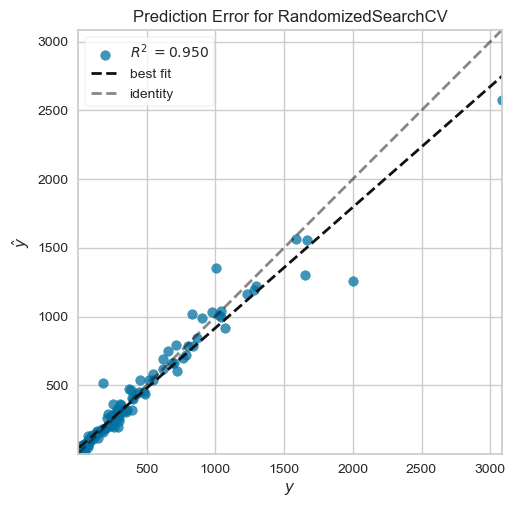

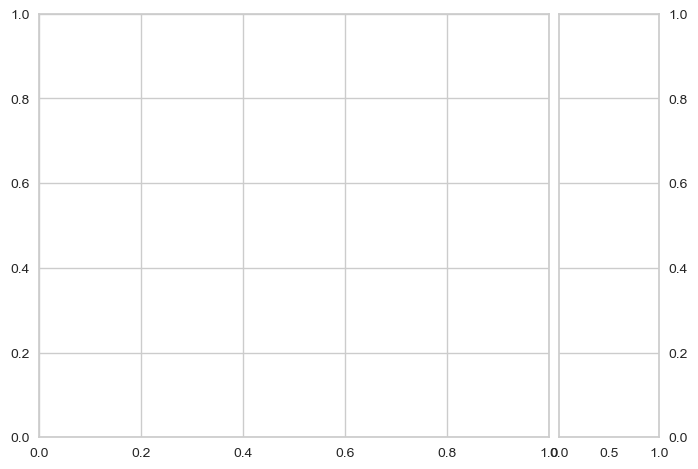

In [140]:
param_grid =  {'loss': ['squared_error','absolute_error','huber','quantile'],
                'n_estimators': [100,400,700,1000],
                'learning_rate': [0.2,0.4,0.7,1],
                'criterion': ['friedman_mse','squared_error'],
                'max_features': ['auto','sqrt','log2']
                }
    
grid_gb = RandomizedSearchCV(GradientBoostingRegressor(),param_grid,verbose=4,cv=5)
train_and_evaluate_model(grid_gb)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END .learning_rate=1, n_estimators=400;, score=0.953 total time=   0.6s
[CV 2/5] END .learning_rate=1, n_estimators=400;, score=0.946 total time=   0.8s
[CV 3/5] END .learning_rate=1, n_estimators=400;, score=0.901 total time=   0.7s
[CV 4/5] END .learning_rate=1, n_estimators=400;, score=0.866 total time=   0.8s
[CV 5/5] END .learning_rate=1, n_estimators=400;, score=0.792 total time=   1.0s
[CV 1/5] END learning_rate=0.2, n_estimators=400;, score=0.932 total time=   1.0s
[CV 2/5] END learning_rate=0.2, n_estimators=400;, score=0.972 total time=   1.0s
[CV 3/5] END learning_rate=0.2, n_estimators=400;, score=0.965 total time=   0.9s
[CV 4/5] END learning_rate=0.2, n_estimators=400;, score=0.833 total time=   1.0s
[CV 5/5] END learning_rate=0.2, n_estimators=400;, score=0.908 total time=   0.9s
[CV 1/5] END learning_rate=0.7, n_estimators=100;, score=0.940 total time=   0.2s
[CV 2/5] END learning_rate=0.7, n_estimato

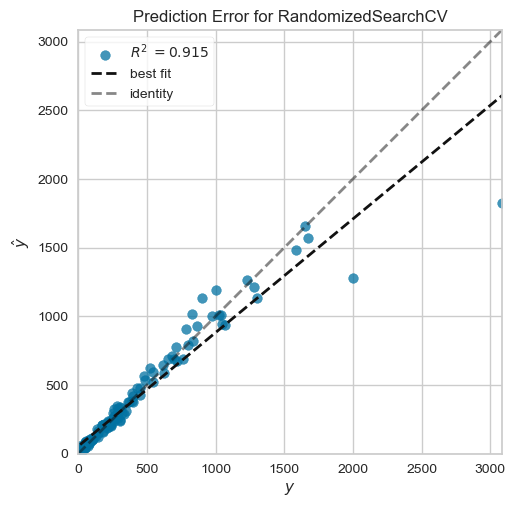

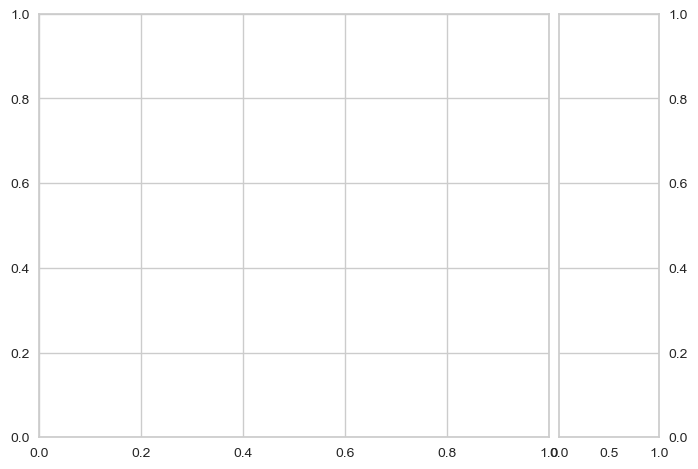

In [141]:
param_grid = {'learning_rate': [0.2,0.4,0.5,0.7,1],
'n_estimators': [100,400,700,800,1000]
}
    
grid_cat = RandomizedSearchCV(CatBoostRegressor(silent=True),param_grid,verbose=5,cv=5)
train_and_evaluate_model(grid_cat)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000183 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 304
[LightGBM] [Info] Number of data points in the train set: 244, number of used features: 9
[LightGBM] [Info] Start training from score 357.646553
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[CV 4/5] END boosting_type=gbdt, importance_type=split, learning_rate=0.4, min_split_gain=0.79, n_estimators=500;, score=0.787 total time=   0.0s
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000053 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 306
[LightGBM] [Info] Number of data points in the train set: 245, number of used features: 9
[LightGBM] [Info] Start training from score 405.080053
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[CV 1/5] END boosting_type=gbdt, importance_type=gain, learning_rate=0.2, min_split_gain=0.79, n_estimators=500;, score=0.849 total time=   0.0s
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000087 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 302
[LightGBM] [Info] Number of data points in the train set: 245, number of used features: 9
[LightGBM] [Info] Start training from score 381.251366
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[CV 3/5] END boosting_type=gbdt, importance_type=gain, learning_rate=0.2, min_split_gain=0.79, n_estimators=500;, score=0.806 total time=   0.0s
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 307
[LightGBM] [Info] Number of data points in the train set: 245, number of used features: 9
[LightGBM] [Info] Start training from score 369.923240
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[CV 1/5] END boosting_type=rf, importance_type=gain, learning_rate=0.8, min_split_gain=0.87, n_estimators=300;, score=nan total time=   0.0s
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[CV 2/5] END boosting_type=rf, importance_type=gain, learning_rate=0.8, min_split_gain=0.87, n_estimators=300;, score=nan total time=   0.0s
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[CV 3/5] END boosting_type=rf, importance_type=gain, learning_rate=0.8, min_split_gain=0.87, n_estimators=300;, score=nan total time=   0.0s
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[CV 4/5] END boosting_type=rf, importance_type=gain, learning_rate=0.8, min_split_gain=0.87, n_estimators=300;, score=nan total time=   0.0s
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[CV 5/5] END boosting_type=rf, importance_type=gain, learning_rate=0.8, min_split_gain=0.87, n_estimators=300;, scor

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[CV 1/5] END boosting_type=goss, importance_type=split, learning_rate=0.6000000000000001, min_split_gain=0.87, n_estimators=1000;, score=0.735 total time=   0.1s
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000057 seconds.
You can set `fo

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[CV 5/5] END boosting_type=goss, importance_type=split, learning_rate=0.6000000000000001, min_split_gain=0.87, n_estimators=1000;, score=0.541 total time=   0.1s
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 304
[LightGBM] [Info] Number of data points in the train set: 244, number of used features: 9
[LightGBM] [Info] Start training from score 357.646553
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[CV 4/5] END boosting_type=dart, importance_type=gain, learning_rate=0.8, min_split_gain=0.79, n_estimators=800;, score=0.788 total time=   0.6s
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000075 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 306
[LightGBM] [Info] Number of data points in the train set: 245, number of used features: 9
[LightGBM] [Info] Start training from score 405.080053
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000032 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 302
[LightGBM] [Info] Number of data points in the train set: 245, number of used features: 9
[LightGBM] [Info] Start training from score 381.251366
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[CV 4/5] END boosting_type=dart, importance_type=gain, learning_rate=0.2, min_split_gain=0.79, n_estimators=800;, score=0.780 total time=   0.6s
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 306
[LightGBM] [Info] Number of data points in the train set: 245, number of used features: 9
[LightGBM] [Info] Start training from score 405.080053
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[CV 1/5] END boosting_type=dart, importance_type=gain, learning_rate=0.6000000000000001, min_split_gain=0.79, n_estimators=300;, score=0.858 total time=   0.1s
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000111 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 302
[LightGBM] [Info] Number of data points in the train set: 245, number of used features: 9
[LightGBM] [Info] Start training from score 381.251366
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 305
[LightGBM] [Info] Number of data points in the train set: 245, number of used features: 9
[LightGBM] [Info] Start training from score 391.081398
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 351
[LightGBM] [Info] Number of data points in the train set: 306, number of used features: 9
[LightGBM] [Info] Start training from score 381.015599
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

Mean Absolute Error: 60.17847610953971
Mean Squared Error: 29383.440033937477
Root Mean Squared Error: 171.41598535124277
Mean Absolute Percentage Error: 0.42302726032447313
R2 Score: 0.863742144348902
Training Time: 14.178929090499878


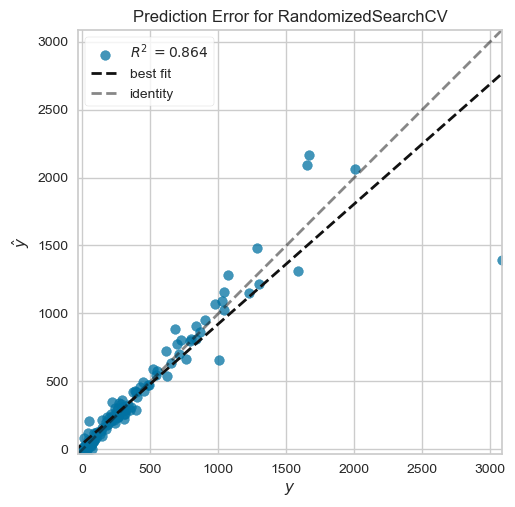

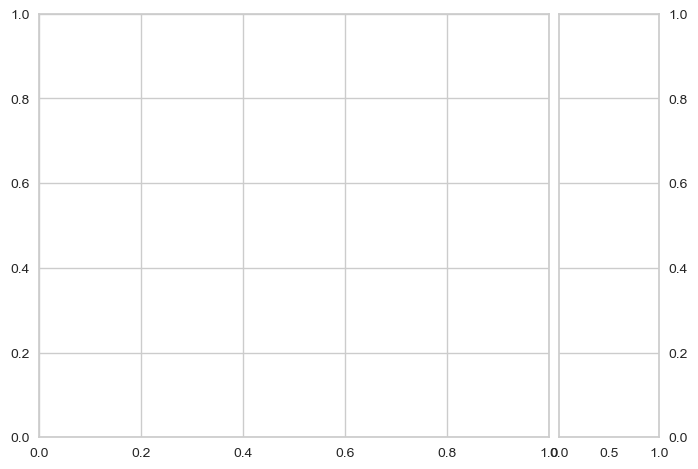

In [142]:
param_grid = {'boosting_type': ['gbdt','dart','goss','rf'],
            'learning_rate': np.linspace(0,1,6)[1:],
            'n_estimators': [100,300,500,800,1000],
            'importance_type': ['split','gain'],
            'min_split_gain': [0.68,0.79,0.87,1]}

grid_lgbm = RandomizedSearchCV(LGBMRegressor(),param_grid,verbose=3,cv=5)
train_and_evaluate_model(grid_lgbm)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[15:18:43] WARNING: C:/Users/administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "grow_policy", "sampling_method" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV 1/5] END booster=gblinear, grow_policy=0, importance_type=weight, learning_rate=0.4, n_estimators=700, sampling_method=uniform;, score=0.665 total time=   0.4s
[15:18:44] WARNING: C:/Users/administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "grow_policy", "sampling_method" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actu

[CV 1/5] END booster=gblinear, grow_policy=0, importance_type=weight, learning_rate=0.4, n_estimators=700, sampling_method=gradient_based;, score=0.665 total time=   0.3s
[15:18:48] WARNING: C:/Users/administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "grow_policy", "sampling_method" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV 2/5] END booster=gblinear, grow_policy=0, importance_type=weight, learning_rate=0.4, n_estimators=700, sampling_method=gradient_based;, score=0.741 total time=   0.3s
[15:18:48] WARNING: C:/Users/administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "grow_policy", "sampling_method" } might not be used.

  This could be a false alarm, with some paramet

Mean Absolute Error: 189.13177563753996
Mean Squared Error: 68806.07195062329
Root Mean Squared Error: 262.3091152640779
Mean Absolute Percentage Error: 4.561798061656496
R2 Score: 0.6809302175327778
Training Time: 10.315755605697632


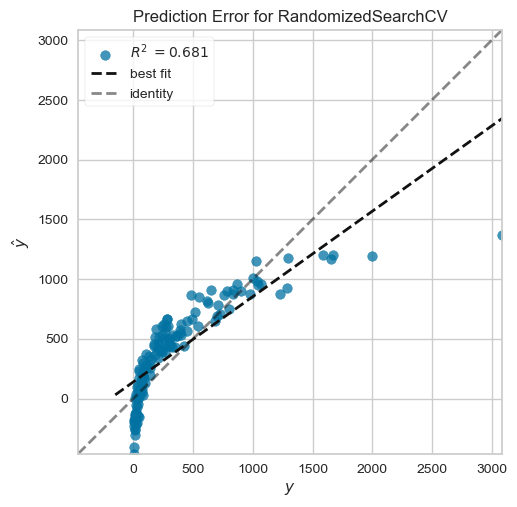

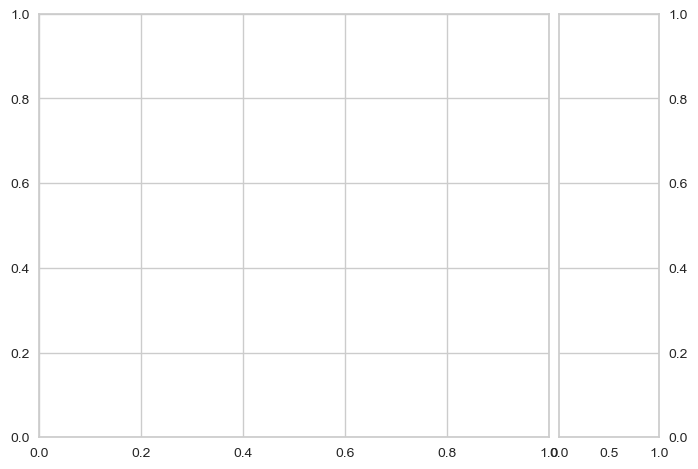

In [143]:
param_grid = {'n_estimators': [100,400,700,1000],
        'grow_policy': [0,1],
        'learning_rate': [0.1,0.4,0.7,1],
        'booster': ['gbtree','gblinear','dart'],
        'sampling_method': ['uniform','gradient_based'],
        'importance_type': ['gain','weight','cover','total_gain','total_cover']
}

grid_xgb = RandomizedSearchCV(XGBRegressor(),param_grid,verbose=3,cv=5)
train_and_evaluate_model(grid_xgb)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END alpha=0.001, average=True, epsilon=66.667, l1_ratio=0.15, learning_rate=adaptive, loss=huber, penalty=l1, shuffle=True;, score=0.530 total time=   0.0s
[CV 2/5] END alpha=0.001, average=True, epsilon=66.667, l1_ratio=0.15, learning_rate=adaptive, loss=huber, penalty=l1, shuffle=True;, score=0.627 total time=   0.0s
[CV 3/5] END alpha=0.001, average=True, epsilon=66.667, l1_ratio=0.15, learning_rate=adaptive, loss=huber, penalty=l1, shuffle=True;, score=0.674 total time=   0.0s
[CV 4/5] END alpha=0.001, average=True, epsilon=66.667, l1_ratio=0.15, learning_rate=adaptive, loss=huber, penalty=l1, shuffle=True;, score=0.474 total time=   0.0s
[CV 5/5] END alpha=0.001, average=True, epsilon=66.667, l1_ratio=0.15, learning_rate=adaptive, loss=huber, penalty=l1, shuffle=True;, score=0.729 total time=   0.0s
[CV 1/5] END alpha=0.1, average=True, epsilon=77.77799999999999, l1_ratio=0.97, learning_rate=adaptive, loss=huber

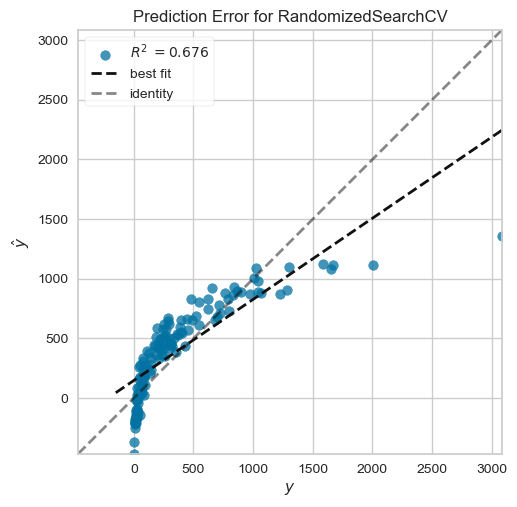

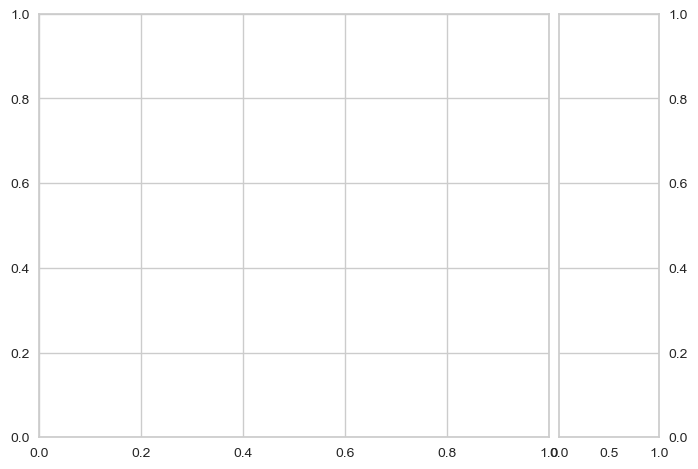

In [144]:
param_grid = {  
                'loss': ['squared_error','huber','epsilon_insensitive','squared_epsilon_insensitive'],
                'penalty': ['l2', 'l1', 'elasticnet'],
                'l1_ratio': [0.15,0.45,0.68,0.81,0.97],
                'alpha': [0.0001,0.001,0.01,0.1,1],
                'shuffle': [True,False],
                'learning_rate': ['adaptive','constant','optimal','invscaling'],
                'epsilon': np.linspace(0.001,100,10),
                'average': [True,False]
             }

grid_sgd = RandomizedSearchCV(SGDRegressor(),param_grid,verbose=3,cv=5)
train_and_evaluate_model(grid_sgd)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END ..........................alpha=5.5556, epsilon=9.0; total time=   0.0s
[CV] END ..........................alpha=5.5556, epsilon=9.0; total time=   0.0s
[CV] END ..........................alpha=5.5556, epsilon=9.0; total time=   0.0s
[CV] END ..........................alpha=5.5556, epsilon=9.0; total time=   0.0s
[CV] END ..........................alpha=5.5556, epsilon=9.0; total time=   0.0s
[CV] END ..........................alpha=5.5556, epsilon=5.0; total time=   0.0s
[CV] END ..........................alpha=5.5556, epsilon=5.0; total time=   0.0s
[CV] END ..........................alpha=5.5556, epsilon=5.0; total time=   0.0s
[CV] END ..........................alpha=5.5556, epsilon=5.0; total time=   0.0s
[CV] END ..........................alpha=5.5556, epsilon=5.0; total time=   0.0s
[CV] END ..........................alpha=0.0001, epsilon=3.0; total time=   0.0s
[CV] END ..........................alpha=0.0001,

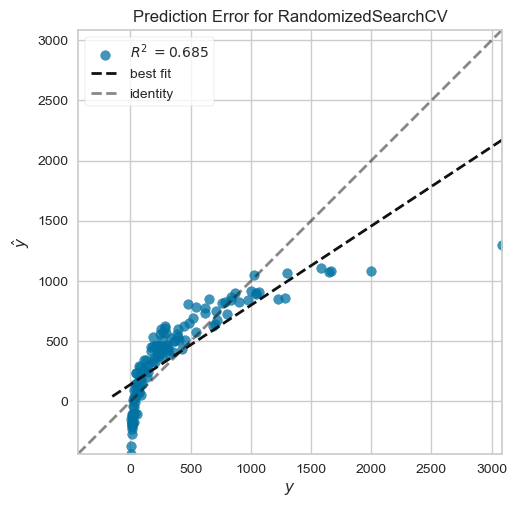

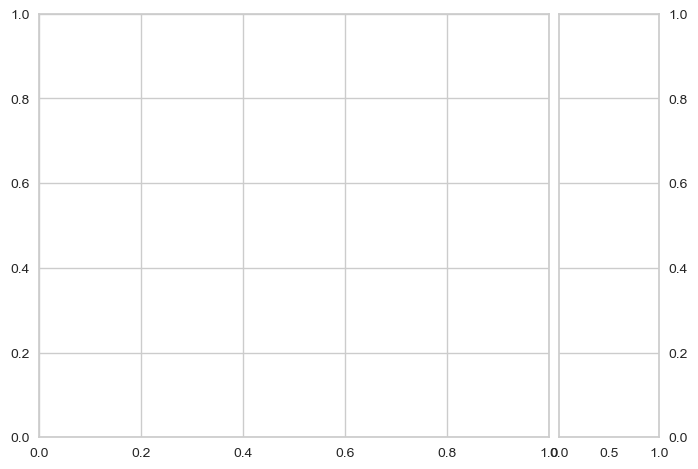

In [145]:
param_grid = {'epsilon': np.linspace(1,10,10),
'alpha': np.linspace(0.0001,10,10)}

grid_huber = RandomizedSearchCV(HuberRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_huber)

In [146]:
param_grid = {'link': ['auto', 'identity', 'log'],
'solver': ['lbfgs', 'newton-cholesky'],
'alpha': np.linspace(0.0001,10,10)}

grid_tweedie = RandomizedSearchCV(TweedieRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_tweedie)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END .....alpha=8.8889, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=8.8889, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=8.8889, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=8.8889, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=8.8889, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END ...............alpha=6.6667, link=log, solver=lbfgs; total time=   0.0s
[CV] END ...............alpha=6.6667, link=log, solver=lbfgs; total time=   0.0s
[CV] END ...............alpha=6.6667, link=log, solver=lbfgs; total time=   0.0s
[CV] END ...............alpha=6.6667, link=log, solver=lbfgs; total time=   0.0s
[CV] END ...............alpha=6.6667, link=log, solver=lbfgs; total time=   0.0s
[CV] END .................alpha=10.0, link=log, solver=lbfgs; total time=   0.0s
[CV] END .................alpha=10.0, link=log, 

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END C=0.001, average=False, epsilon=1.0, loss=squared_epsilon_insensitive, shuffle=True; total time=   0.0s
[CV] END C=0.001, average=False, epsilon=1.0, loss=squared_epsilon_insensitive, shuffle=True; total time=   0.0s
[CV] END C=0.001, average=False, epsilon=1.0, loss=squared_epsilon_insensitive, shuffle=True; total time=   0.0s
[CV] END C=0.001, average=False, epsilon=1.0, loss=squared_epsilon_insensitive, shuffle=True; total time=   0.0s
[CV] END C=0.001, average=False, epsilon=1.0, loss=squared_epsilon_insensitive, shuffle=True; total time=   0.0s
[CV] END C=0.001, average=False, epsilon=1.0, loss=epsilon_insensitive, shuffle=True; total time=   0.0s
[CV] END C=0.001, average=False, epsilon=1.0, loss=epsilon_insensitive, shuffle=True; total time=   0.0s
[CV] END C=0.001, average=False, epsilon=1.0, loss=epsilon_insensitive, shuffle=True; total time=   0.0s
[CV] END C=0.001, average=False, epsilon=1.0, loss=epsilon_

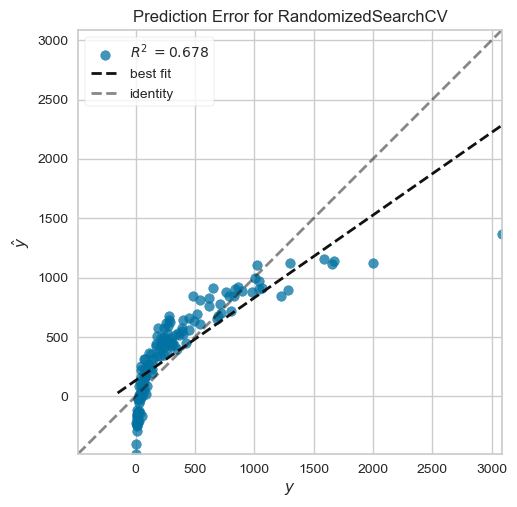

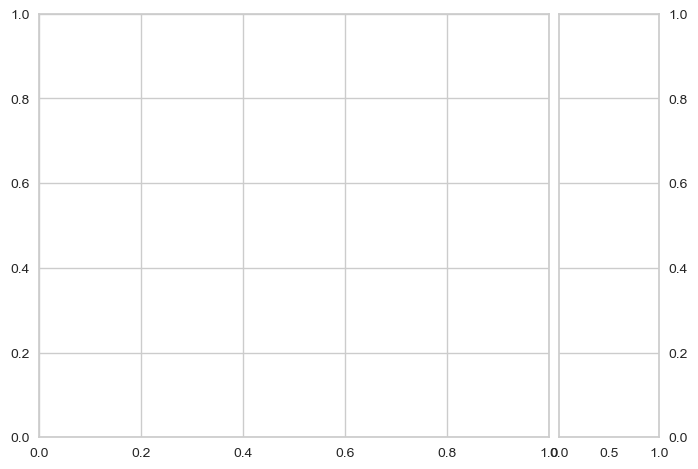

In [147]:
param_grid = {'C': [0.0001,0.001,0.01,0.1,1,10],
            'loss': ['epsilon_insensitive','squared_epsilon_insensitive'],
            'epsilon': np.linspace(0.001,1,5),
            'shuffle': [True,False],
            'average': [True,False]}

grid_pa = RandomizedSearchCV(PassiveAggressiveRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_pa)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.001, fit_intercept=False, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, positive=True, selection=random; total time=  

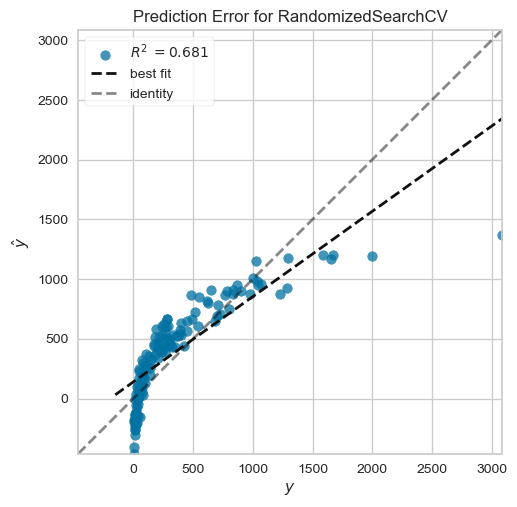

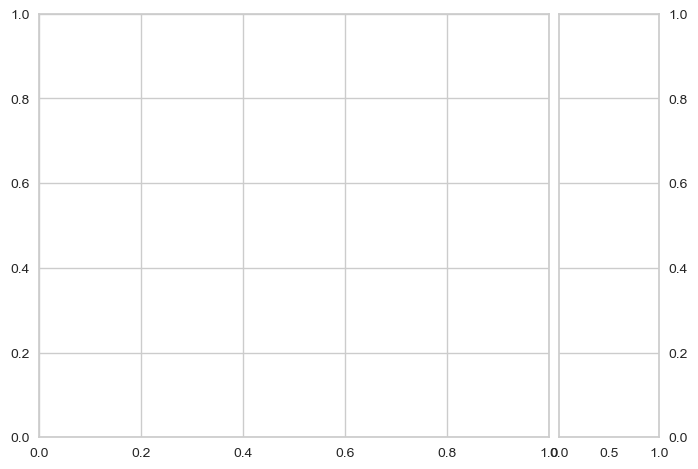

In [148]:
param_grid = {
            'alpha': [0.001,0.01,0.1],
            'positive': [True,False],
            'selection': ['cyclic','random'],
            'fit_intercept': [True,False]
}

grid_lasso = RandomizedSearchCV(Lasso(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_lasso)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.001, fit_intercept=True, positive=False, solver=lbfgs; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, positive=False, solver=lbfgs; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, positive=False, solver=lbfgs; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, positive=False, solver=lbfgs; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, positive=False, solver=lbfgs; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, positive=True, solver=svd; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, positive=True, solver=svd; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, positive=True, solver=svd; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, positive=True, solver=svd; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, positive=True, solver=svd; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, po

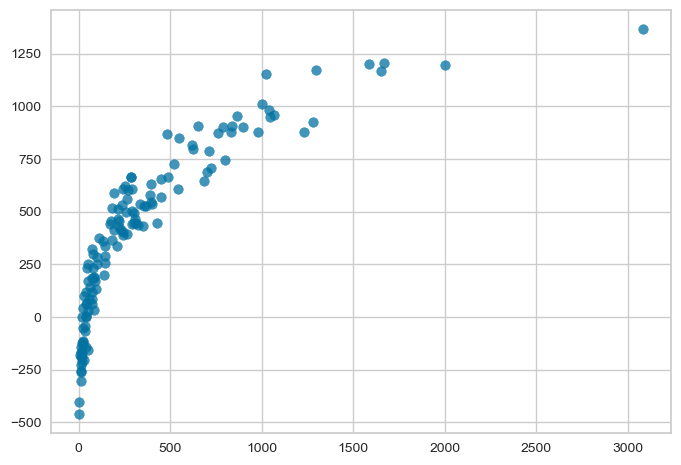

In [149]:
param_grid = {
            'alpha': [0.001,0.01,0.1],
            'positive': [True,False],
            'fit_intercept': [True,False],
            'solver': ['svd','cholesky','lsqr','sparse_cg','sag','saga','lbfgs']
}

grid_ridge = RandomizedSearchCV(Ridge(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_ridge)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.01, fit_intercept=True, l1_ratio=0.8, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, l1_ratio=0.8, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, l1_ratio=0.8, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, l1_ratio=0.8, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, l1_ratio=0.8, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, l1_ratio=0.3, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, l1_ratio=0.3, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, l1_ratio=0.3, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, l1_ratio=0.3, positive=False, selection

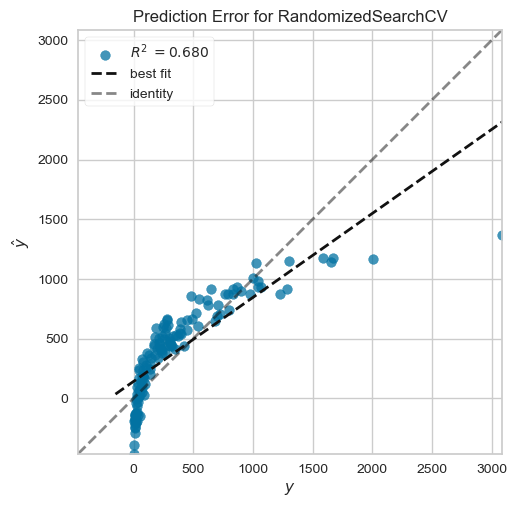

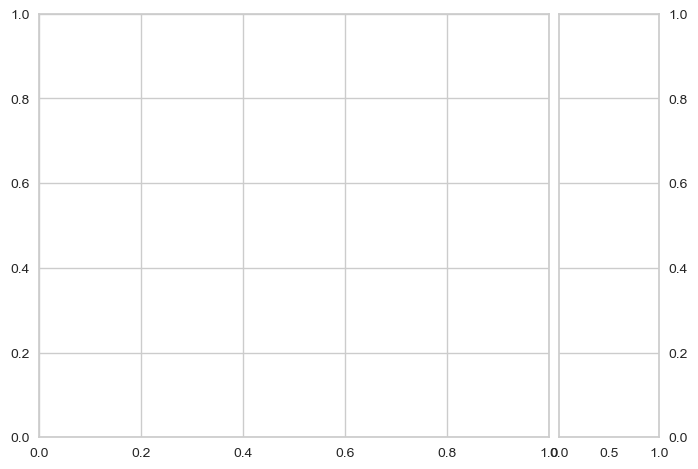

In [150]:
param_grid = {
    'alpha': [0.001,0.01,0.1],
    'selection': ['cyclic','random'],
    'l1_ratio': [0.1,0.3,0.5,0.8,1],
    'positive': [True,False],
    'fit_intercept': [True,False]
}

grid_elasticnet = RandomizedSearchCV(ElasticNet(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_elasticnet)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha_1=1e-07, alpha_2=1e-06, compute_score=False, fit_intercept=False, lambda_1=1e-07, lambda_2=1e-05; total time=   0.0s
[CV] END alpha_1=1e-07, alpha_2=1e-06, compute_score=False, fit_intercept=False, lambda_1=1e-07, lambda_2=1e-05; total time=   0.0s
[CV] END alpha_1=1e-07, alpha_2=1e-06, compute_score=False, fit_intercept=False, lambda_1=1e-07, lambda_2=1e-05; total time=   0.1s
[CV] END alpha_1=1e-07, alpha_2=1e-06, compute_score=False, fit_intercept=False, lambda_1=1e-07, lambda_2=1e-05; total time=   0.1s
[CV] END alpha_1=1e-07, alpha_2=1e-06, compute_score=False, fit_intercept=False, lambda_1=1e-07, lambda_2=1e-05; total time=   0.0s
[CV] END alpha_1=1e-06, alpha_2=1e-05, compute_score=True, fit_intercept=True, lambda_1=1e-07, lambda_2=1e-07; total time=   0.0s
[CV] END alpha_1=1e-06, alpha_2=1e-05, compute_score=True, fit_intercept=True, lambda_1=1e-07, lambda_2=1e-07; total time=   0.0s
[CV] END alpha_1=1e

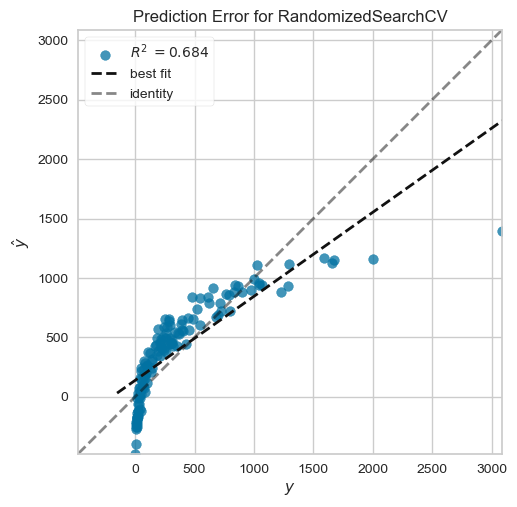

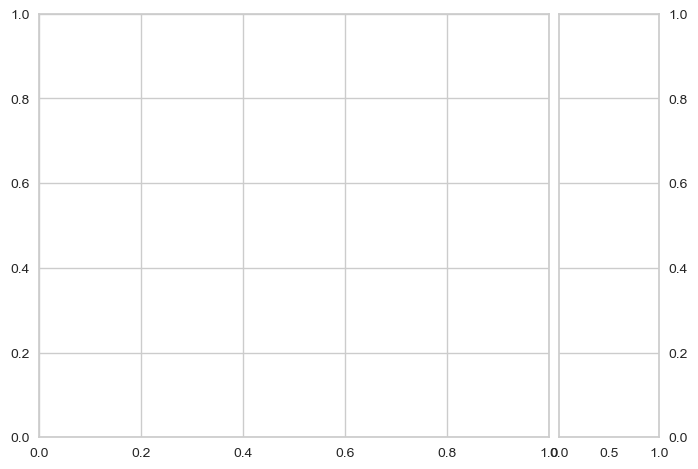

In [151]:
param_grid = {'alpha_1': [1e-5,1e-6,1e-7,1e-8],
'alpha_2': [1e-5,1e-6,1e-7,1e-8],
'lambda_1': [1e-5,1e-6,1e-7,1e-8],
'lambda_2': [1e-5,1e-6,1e-7,1e-8],
'fit_intercept': [True,False],
'compute_score': [True,False]}

grid_ard = RandomizedSearchCV(ARDRegression(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_ard)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=False, positive=True; total time=   0.0s
[CV] END .................fit_intercept=False, po

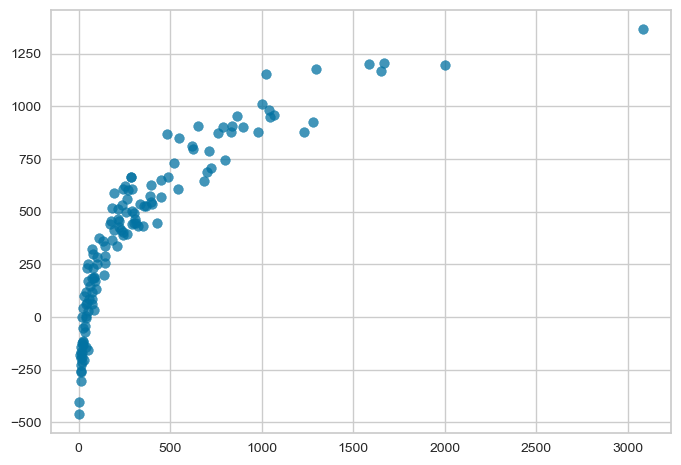

In [152]:
param_grid = {'fit_intercept': [True,False],
'positive': [True,False]}

grid_lr = RandomizedSearchCV(LinearRegression(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_lr)

In [153]:
param_grid = {
    'alpha': [0.001,0.01,0.1],
    'fit_intercept': [True,False],
    'solver': ['lbfgs','newton-cholesky'],
    'warm_start': [True,False]
}

grid_poisson = RandomizedSearchCV(estimator=PoissonRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_poisson)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.001, fit_intercept=True, solver=lbfgs, warm_start=True; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, solver=lbfgs, warm_start=True; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, solver=lbfgs, warm_start=True; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, solver=lbfgs, warm_start=True; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, solver=lbfgs, warm_start=True; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, solver=newton-cholesky, warm_start

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END loss=squared_error, min_samples=1.0, stop_probability=1.0; total time=   0.1s
[CV] END loss=squared_error, min_samples=1.0, stop_probability=1.0; total time=   0.0s
[CV] END loss=squared_error, min_samples=1.0, stop_probability=1.0; total time=   0.0s
[CV] END loss=squared_error, min_samples=1.0, stop_probability=1.0; total time=   0.0s
[CV] END loss=squared_error, min_samples=1.0, stop_probability=1.0; total time=   0.0s
[CV] END loss=absolute_error, min_samples=1.0, stop_probability=0.75; total time=   0.0s
[CV] END loss=absolute_error, min_samples=1.0, stop_probability=0.75; total time=   0.0s
[CV] END loss=absolute_error, min_samples=1.0, stop_probability=0.75; total time=   0.0s
[CV] END loss=absolute_error, min_samples=1.0, stop_probability=0.75; total time=   0.0s
[CV] END loss=absolute_error, min_samples=1.0, stop_probability=0.75; total time=   0.0s
[CV] END loss=absolute_error, min_samples=0.25, stop_probab

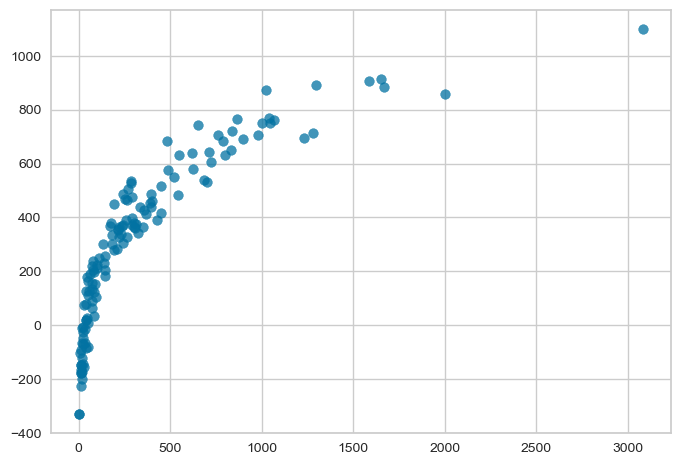

In [154]:
param_grid = {
    'stop_probability': np.linspace(0,1,5),
    'loss': ['absolute_error','squared_error'],
    'min_samples': np.linspace(0,1,5)[1:]
}

grid_ransac = RandomizedSearchCV(estimator=RANSACRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_ransac)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END bootstrap=True, criterion=squared_error, max_features=auto, max_samples=1.0, n_estimators=800, oob_score=True, warm_start=True; total time=   0.0s
[CV] END bootstrap=True, criterion=squared_error, max_features=auto, max_samples=1.0, n_estimators=800, oob_score=True, warm_start=True; total time=   0.0s
[CV] END bootstrap=True, criterion=squared_error, max_features=auto, max_samples=1.0, n_estimators=800, oob_score=True, warm_start=True; total time=   0.0s
[CV] END bootstrap=True, criterion=squared_error, max_features=auto, max_samples=1.0, n_estimators=800, oob_score=True, warm_start=True; total time=   0.0s
[CV] END bootstrap=True, criterion=squared_error, max_features=auto, max_samples=1.0, n_estimators=800, oob_score=True, warm_start=True; total time=   0.0s
[CV] END bootstrap=False, criterion=squared_error, max_features=log2, max_samples=1.0, n_estimators=200, oob_score=True, warm_start=True; total time=   0.0s
[C

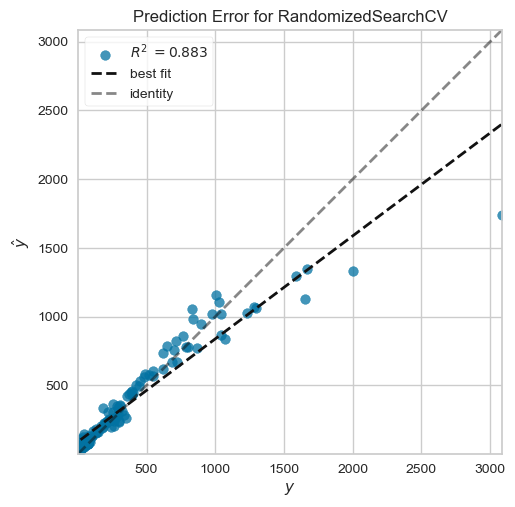

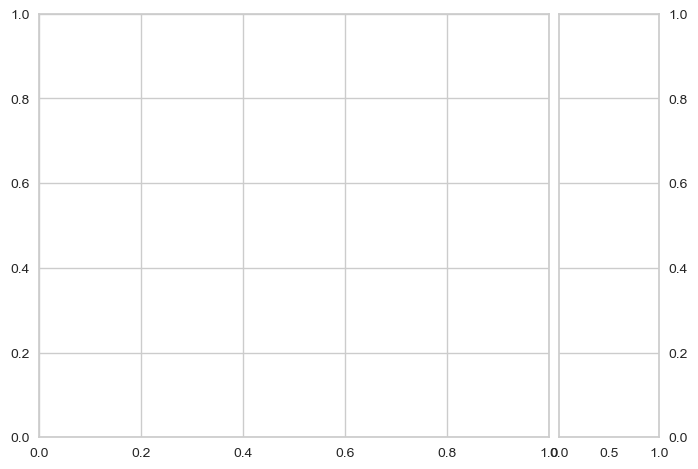

In [155]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'criterion': ['squared_error','absolute_error','friedman_mse','poisson'],
    'max_features': ['auto','sqrt','log2'],
    'bootstrap': [True,False],
    'oob_score': [True,False],
    'warm_start': [True,False],
    'max_samples': [0.25,0.5,0.75,1.0]
}

grid_rf = RandomizedSearchCV(estimator=RandomForestRegressor(),param_distributions=param_grid,verbose=2,return_train_score=True,scoring='r2')
train_and_evaluate_model(grid_rf)

In [156]:
param_grid = {
    'alpha': [0.001,0.01,0.1],
    'fit_intercept': [True,False],
    'solver': ['lbfgs','newton-cholesky'],
    'warm_start': [True,False]
}

grid_gamma = RandomizedSearchCV(estimator=GammaRegressor(),param_distributions=param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_gamma)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.1, fit_intercept=False, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, solver=newton-cholesky, warm_start=False; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, solver=newton-cholesky, warm_start=False; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, solver=newton-cholesky, warm_start=False; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, solver=newton-cholesky, warm_start=False; total time=   0.0s
[CV] END alpha=0.01, f

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END C=0.01, degree=4, epsilon=0.01, gamma=scale, kernel=sigmoid, shrinking=True; total time=   0.0s
[CV] END C=0.01, degree=4, epsilon=0.01, gamma=scale, kernel=sigmoid, shrinking=True; total time=   0.0s
[CV] END C=0.01, degree=4, epsilon=0.01, gamma=scale, kernel=sigmoid, shrinking=True; total time=   0.0s
[CV] END C=0.01, degree=4, epsilon=0.01, gamma=scale, kernel=sigmoid, shrinking=True; total time=   0.0s
[CV] END C=0.01, degree=4, epsilon=0.01, gamma=scale, kernel=sigmoid, shrinking=True; total time=   0.0s
[CV] END C=1, degree=3, epsilon=0.001, gamma=auto, kernel=linear, shrinking=True; total time=   0.0s
[CV] END C=1, degree=3, epsilon=0.001, gamma=auto, kernel=linear, shrinking=True; total time=   0.0s
[CV] END C=1, degree=3, epsilon=0.001, gamma=auto, kernel=linear, shrinking=True; total time=   0.0s
[CV] END C=1, degree=3, epsilon=0.001, gamma=auto, kernel=linear, shrinking=True; total time=   0.0s
[CV] END C

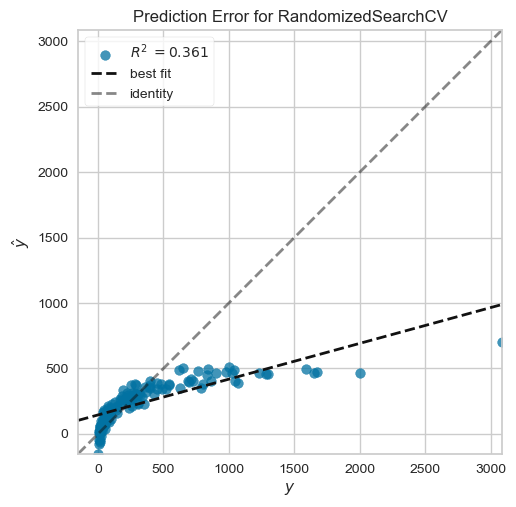

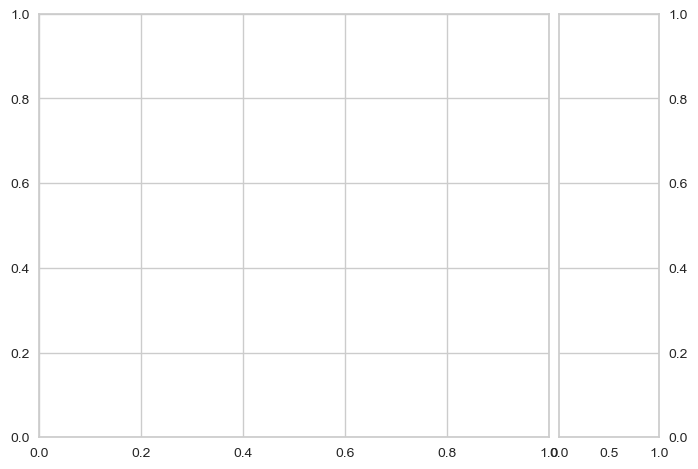

In [157]:
param_grid = {
    'kernel': ['linear','poly','rbf','sigmoid'],
    'degree': [1,2,3,4],
    'C': [0.01,0.1,1,10],
    'gamma': ['scale','auto'],
    'shrinking': [True,False],
    'epsilon': [0.001,0.01,0.1,1]
}

grid_svr = RandomizedSearchCV(estimator=SVR(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_svr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END C=1, degree=4, kernel=linear, nu=0.5, shrinking=True; total time=   0.0s
[CV] END C=1, degree=4, kernel=linear, nu=0.5, shrinking=True; total time=   0.0s
[CV] END C=1, degree=4, kernel=linear, nu=0.5, shrinking=True; total time=   0.0s
[CV] END C=1, degree=4, kernel=linear, nu=0.5, shrinking=True; total time=   0.0s
[CV] END C=1, degree=4, kernel=linear, nu=0.5, shrinking=True; total time=   0.0s
[CV] END C=0.1, degree=3, kernel=sigmoid, nu=1, shrinking=False; total time=   0.0s
[CV] END C=0.1, degree=3, kernel=sigmoid, nu=1, shrinking=False; total time=   0.0s
[CV] END C=0.1, degree=3, kernel=sigmoid, nu=1, shrinking=False; total time=   0.0s
[CV] END C=0.1, degree=3, kernel=sigmoid, nu=1, shrinking=False; total time=   0.0s
[CV] END C=0.1, degree=3, kernel=sigmoid, nu=1, shrinking=False; total time=   0.0s
[CV] END C=0.1, degree=3, kernel=poly, nu=0.001, shrinking=False; total time=   0.0s
[CV] END C=0.1, degree=3

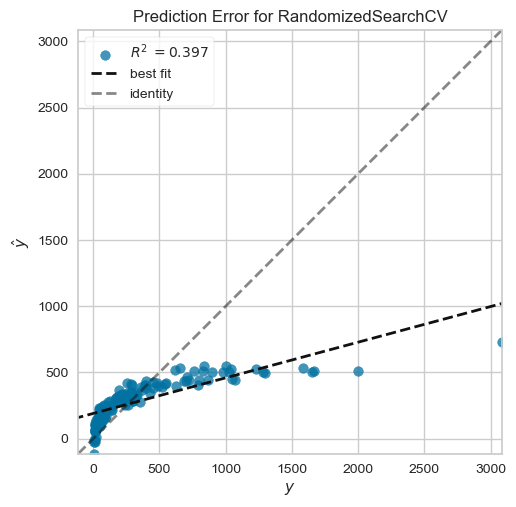

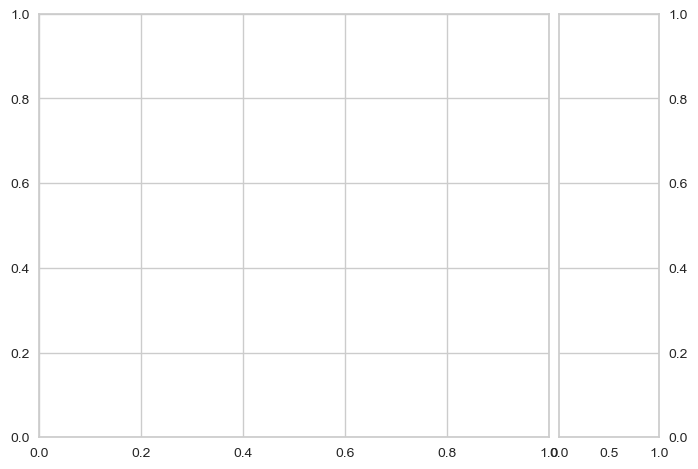

In [158]:
param_grid = {
    'nu': [0.001,0.01,0.1,0.5,1],
    'C': [0.1,1,10],
    'kernel': ['linear','poly','rbf','sigmoid'],
    'degree': [1,2,3,4],
    'shrinking': [True,False]
}

grid_nusvr = RandomizedSearchCV(estimator=NuSVR(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_nusvr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END copy_X=True, fit_intercept=False, max_subpopulation=100000, n_subsamples=None; total time=  15.1s
[CV] END copy_X=True, fit_intercept=False, max_subpopulation=100000, n_subsamples=None; total time=   8.9s
[CV] END copy_X=True, fit_intercept=False, max_subpopulation=100000, n_subsamples=None; total time=   9.6s
[CV] END copy_X=True, fit_intercept=False, max_subpopulation=100000, n_subsamples=None; total time=  11.7s
[CV] END copy_X=True, fit_intercept=False, max_subpopulation=100000, n_subsamples=None; total time=   9.4s
[CV] END copy_X=True, fit_intercept=False, max_subpopulation=1, n_subsamples=None; total time=   0.0s
[CV] END copy_X=True, fit_intercept=False, max_subpopulation=1, n_subsamples=None; total time=   0.0s
[CV] END copy_X=True, fit_intercept=False, max_subpopulation=1, n_subsamples=None; total time=   0.0s
[CV] END copy_X=True, fit_intercept=False, max_subpopulation=1, n_subsamples=None; total time=   0

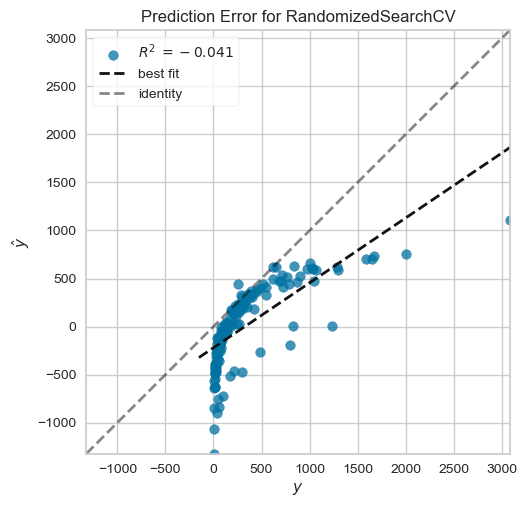

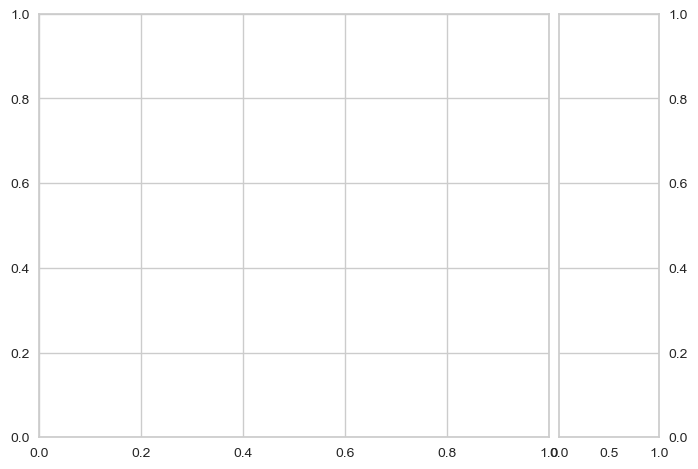

In [159]:
param_grid = {
    'fit_intercept': [True,False],
    'copy_X': [True,False],
    'max_subpopulation': [1,10,100,1000,10000,100000],
    'n_subsamples': [300,500,753,None]
}

grid_tsr = RandomizedSearchCV(estimator=TheilSenRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_tsr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha_1=1e-07, alpha_2=1e-08, compute_score=True, fit_intercept=False, lambda_1=1e-08, lambda_2=1e-07; total time=   0.0s
[CV] END alpha_1=1e-07, alpha_2=1e-08, compute_score=True, fit_intercept=False, lambda_1=1e-08, lambda_2=1e-07; total time=   0.0s
[CV] END alpha_1=1e-07, alpha_2=1e-08, compute_score=True, fit_intercept=False, lambda_1=1e-08, lambda_2=1e-07; total time=   0.0s
[CV] END alpha_1=1e-07, alpha_2=1e-08, compute_score=True, fit_intercept=False, lambda_1=1e-08, lambda_2=1e-07; total time=   0.0s
[CV] END alpha_1=1e-07, alpha_2=1e-08, compute_score=True, fit_intercept=False, lambda_1=1e-08, lambda_2=1e-07; total time=   0.0s
[CV] END alpha_1=1e-07, alpha_2=1e-06, compute_score=False, fit_intercept=True, lambda_1=1e-06, lambda_2=1e-08; total time=   0.0s
[CV] END alpha_1=1e-07, alpha_2=1e-06, compute_score=False, fit_intercept=True, lambda_1=1e-06, lambda_2=1e-08; total time=   0.0s
[CV] END alpha_1=1e-07

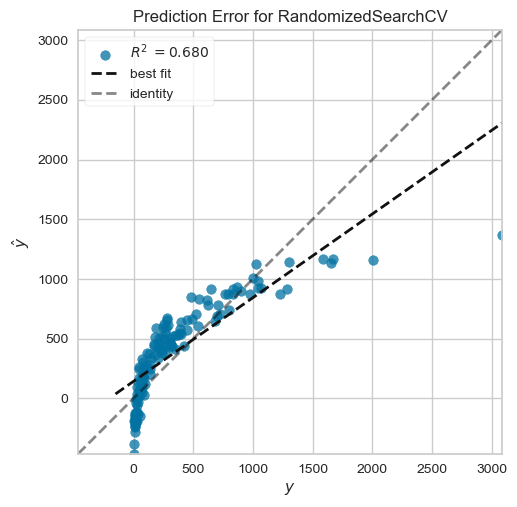

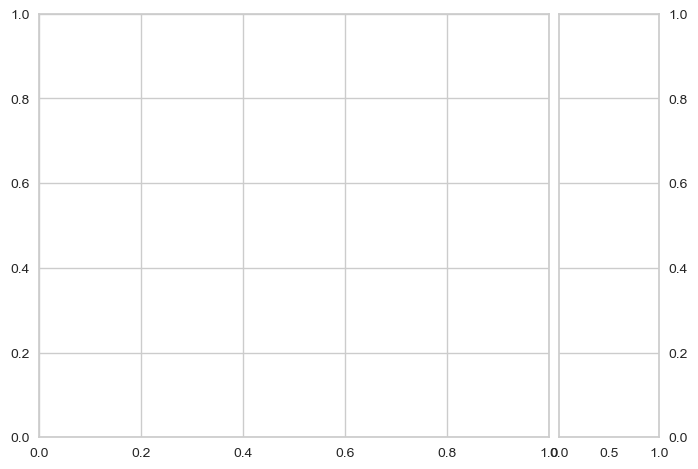

In [160]:
param_grid = {'alpha_1': [1e-5,1e-6,1e-7,1e-8],
'alpha_2': [1e-5,1e-6,1e-7,1e-8],
'lambda_1': [1e-5,1e-6,1e-7,1e-8],
'lambda_2': [1e-5,1e-6,1e-7,1e-8],
'fit_intercept': [True,False],
'compute_score': [True,False]
             }

grid_bayesian_ridge = RandomizedSearchCV(BayesianRidge(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_bayesian_ridge)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END .learning_rate=0.001, loss=linear, n_estimators=800; total time=   3.4s
[CV] END .learning_rate=0.001, loss=linear, n_estimators=800; total time=   3.8s
[CV] END .learning_rate=0.001, loss=linear, n_estimators=800; total time=   4.3s
[CV] END .learning_rate=0.001, loss=linear, n_estimators=800; total time=   3.8s
[CV] END .learning_rate=0.001, loss=linear, n_estimators=800; total time=   3.7s
[CV] END ...learning_rate=0.1, loss=square, n_estimators=200; total time=   0.8s
[CV] END ...learning_rate=0.1, loss=square, n_estimators=200; total time=   0.7s
[CV] END ...learning_rate=0.1, loss=square, n_estimators=200; total time=   0.8s
[CV] END ...learning_rate=0.1, loss=square, n_estimators=200; total time=   0.7s
[CV] END ...learning_rate=0.1, loss=square, n_estimators=200; total time=   1.0s
[CV] END ..learning_rate=0.1, loss=square, n_estimators=1000; total time=   4.8s
[CV] END ..learning_rate=0.1, loss=square, n_est

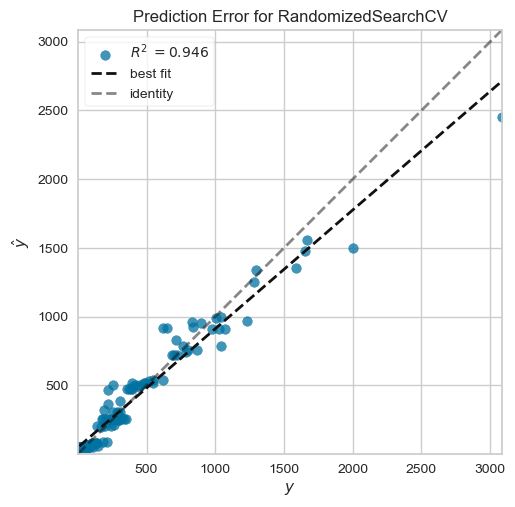

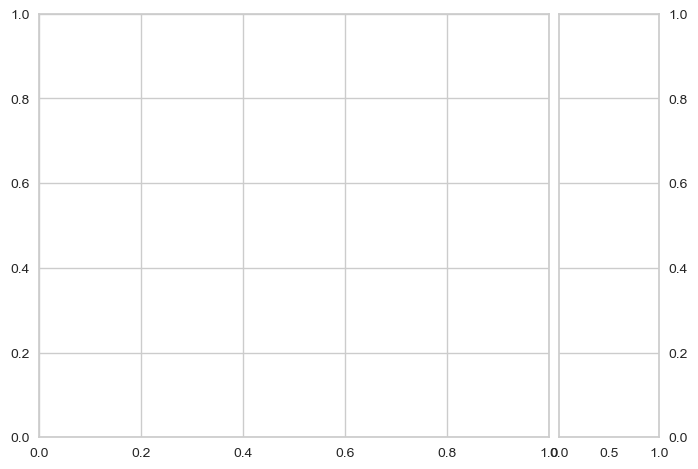

In [161]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'learning_rate': [0.001,0.01,0.1,1],
    'loss': ['linear','square','exponential']
}

grid_ab = RandomizedSearchCV(estimator=AdaBoostRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_ab)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END bootstrap=True, criterion=absolute_error, max_features=auto, max_samples=1, n_estimators=200, oob_score=True; total time=   0.0s
[CV] END bootstrap=True, criterion=absolute_error, max_features=auto, max_samples=1, n_estimators=200, oob_score=True; total time=   0.0s
[CV] END bootstrap=True, criterion=absolute_error, max_features=auto, max_samples=1, n_estimators=200, oob_score=True; total time=   0.0s
[CV] END bootstrap=True, criterion=absolute_error, max_features=auto, max_samples=1, n_estimators=200, oob_score=True; total time=   0.0s
[CV] END bootstrap=True, criterion=absolute_error, max_features=auto, max_samples=1, n_estimators=200, oob_score=True; total time=   0.0s
[CV] END bootstrap=True, criterion=friedman_mse, max_features=sqrt, max_samples=1, n_estimators=200, oob_score=True; total time=   0.5s
[CV] END bootstrap=True, criterion=friedman_mse, max_features=sqrt, max_samples=1, n_estimators=200, oob_score=Tr

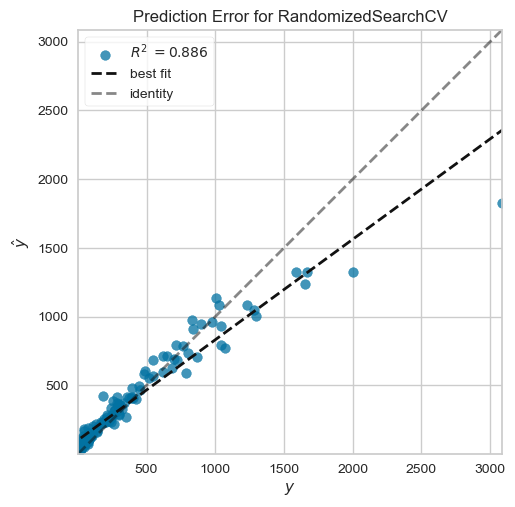

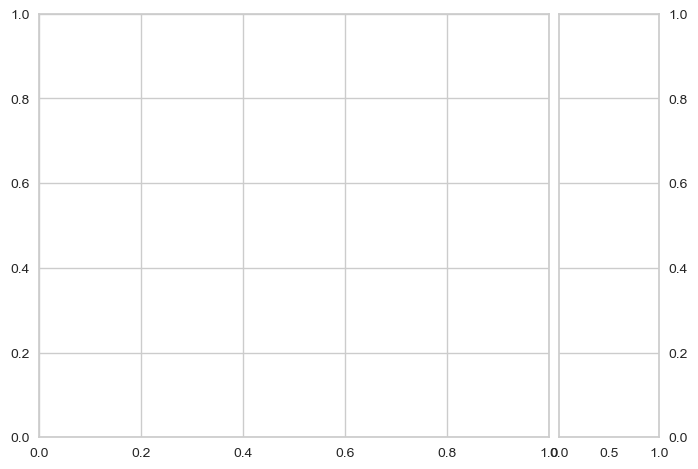

In [162]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'criterion': ['squared_error','absolute_error','friedman_mse','poisson'],
    'max_features': ['auto','sqrt','log2'],
    'bootstrap': [True,False],
    'oob_score': [True,False],
    'max_samples': [0.5,0.75,0.9,1]
}

grid_et = RandomizedSearchCV(estimator=ExtraTreesRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_et)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[15:23:03] WARNING: C:/Users/administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "colsample_bynode", "num_parallel_tree", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END booster=gblinear, importance_type=weight, learning_rate=0.1, n_estimators=800; total time=   0.0s
[15:23:03] WARNING: C:/Users/administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "colsample_bynode", "num_parallel_tree", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
 

[15:23:10] WARNING: C:/Users/administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "colsample_bynode", "num_parallel_tree", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[CV] END booster=gblinear, importance_type=total_cover, learning_rate=0.001, n_estimators=1000; total time=   0.0s
[15:23:10] WARNING: C:/Users/administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "colsample_bynode", "num_parallel_tree", "subsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an iss

Mean Absolute Error: 37.34209881516659
Mean Squared Error: 4654.9877591642435
Root Mean Squared Error: 68.22747070765736
Mean Absolute Percentage Error: 0.1448526667466465
R2 Score: 0.9784137374856978
Training Time: 11.410333156585693


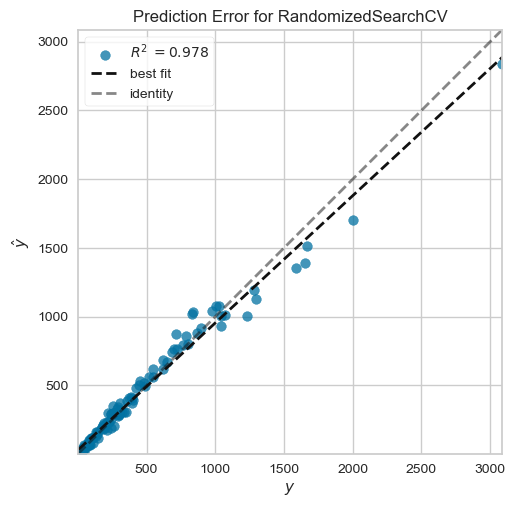

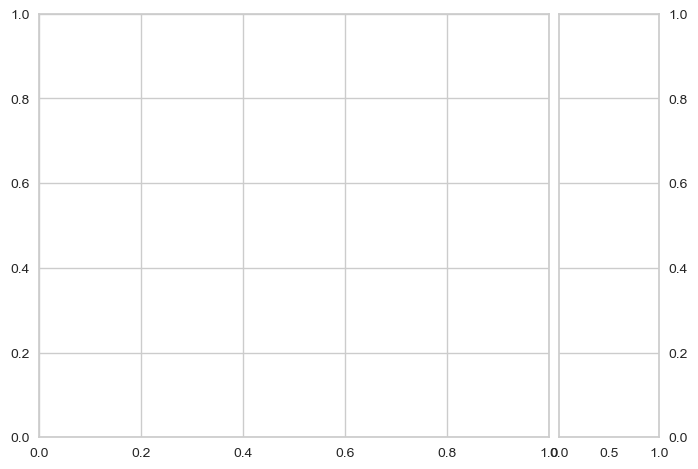

In [163]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'learning_rate': [0.001,0.01,0.1,1],
    'booster': ['gbtree','dart','gblinear'],
    'importance_type': ['gain','weight','cover','total_gain','total_cover']
}

grid_xgbrf = RandomizedSearchCV(estimator=XGBRFRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_xgbrf)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END bootstrap=False, bootstrap_features=False, max_features=0.5, max_samples=0.75, n_estimators=500, oob_score=True, warm_start=False; total time=   0.0s
[CV] END bootstrap=False, bootstrap_features=False, max_features=0.5, max_samples=0.75, n_estimators=500, oob_score=True, warm_start=False; total time=   0.0s
[CV] END bootstrap=False, bootstrap_features=False, max_features=0.5, max_samples=0.75, n_estimators=500, oob_score=True, warm_start=False; total time=   0.0s
[CV] END bootstrap=False, bootstrap_features=False, max_features=0.5, max_samples=0.75, n_estimators=500, oob_score=True, warm_start=False; total time=   0.0s
[CV] END bootstrap=False, bootstrap_features=False, max_features=0.5, max_samples=0.75, n_estimators=500, oob_score=True, warm_start=False; total time=   0.0s
[CV] END bootstrap=True, bootstrap_features=True, max_features=1, max_samples=0.25, n_estimators=800, oob_score=False, warm_start=False; total t

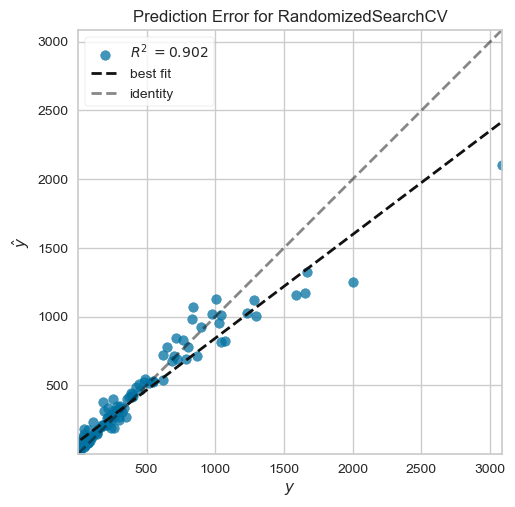

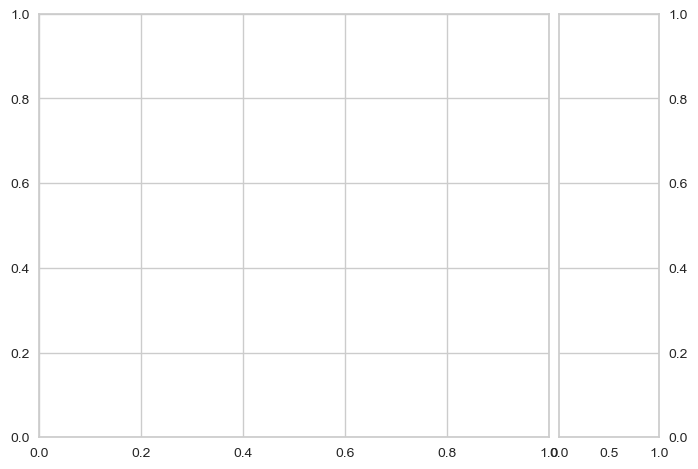

In [164]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'max_samples': [0.25,0.5,0.75,1],
    'max_features': [0.5,0.65,0.85,1],
    'bootstrap': [True,False],
    'oob_score': [True,False],
    'bootstrap_features': [True,False],
    'warm_start': [True,False]
}

grid_bag = RandomizedSearchCV(estimator=BaggingRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_bag)

## Optimized Models Performance Comparison

In [165]:
model_perfs = pd.DataFrame({'Model': models, 
                            'R2': r2_scores, 
                            'RMSE': rmse_scores, 
                            'MAPE': mape_scores, 
                            'MSE': mse_scores, 
                            'Training Time': training_times}).sort_values('R2',ascending=False).reset_index(drop=True)
model_perfs[:20]

,Model,R2,RMSE,MAPE,MSE,Training Time
0,"XGBRegressor(base_score=0.5, booster='gbtree',...",0.989089,48.507258,0.113584,2352.954124,0.171520
1,"(ExtraTreeRegressor(random_state=1460934559), ...",0.987658,51.589133,0.109924,2661.438608,0.458542
2,"XGBRFRegressor(base_score=0.5, booster='gbtree...",0.978542,68.024895,0.137388,4627.386357,0.082002
3,"RandomizedSearchCV(cv=5,\n e...",0.978414,68.227471,0.144853,4654.987759,11.410333
4,NGBRegressor(random_state=RandomState(MT19937)...,0.976563,71.092660,0.168087,5054.166286,18.884388
5,([DecisionTreeRegressor(criterion='friedman_ms...,0.974587,74.028561,0.173144,5480.227788,0.243016
6,(DecisionTreeRegressor(random_state=1864396907...,0.970623,79.592386,0.123258,6334.947836,0.094003
7,"(DecisionTreeRegressor(max_features=1.0, rando...",0.967426,83.811634,0.119897,7024.390065,0.826060
8,"RandomizedSearchCV(cv=5, estimator=GradientBoo...",0.949545,104.309116,0.317888,10880.391587,134.977190
9,"RandomizedSearchCV(cv=5, estimator=AdaBoostReg...",0.946109,107.802770,0.779388,11621.437178,126.335016


Even after tuning the hyperparameters of all the models, the Extra Trees Regressor model stays intact as the best performing model with an outstanding R2 score of more than 98%.

## Saving the best performing model for deployment into production

In [166]:
best_model = model_perfs['Model'].iloc[0]
best_model

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)

In [167]:
pipeline = Pipeline(steps=[
        ('transformer',transformer),
        ('scaler',scaler),
        ('model',best_model)
])
pipeline

Pipeline(steps=[('transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('log_transform',
                                                  FunctionTransformer(func=<ufunc 'log1p'>),
                                                  ['Quantity']),
                                                 ('sqrt_transform',
                                                  FunctionTransformer(func=<ufunc 'sqrt'>),
                                                  ['Discount']),
                                                 ('power_transform',
                                                  PowerTransformer(),
                                                  ['Discount Percentage',
                                                   'Operating Expenses'])])),
                ('scaler', StandardScaler()),
                ('mode...
                              gamma=0, gpu_id=-1, grow_policy='depthwise',
                              importance_type=None, interaction_constraints='',
                              learning_rate=0.300000012, max_bin=256,
                              max_cat_to_onehot=4, max_delta_step=0,
                              max_depth=6, max_leaves=0, min_child_weight=1,
                              missing=nan, monotone_constraints='()',
                              n_estimators=100, n_jobs=0, num_parallel_tree=1,
                              predictor='auto', random_state=0, reg_alpha=0,
                              reg_lambda=1, ...))])

In [168]:
joblib.dump(pipeline,'pipeline.pkl')

['pipeline.pkl']

In [169]:
joblib.load('pipeline.pkl')

Pipeline(steps=[('transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('log_transform',
                                                  FunctionTransformer(func=<ufunc 'log1p'>),
                                                  ['Quantity']),
                                                 ('sqrt_transform',
                                                  FunctionTransformer(func=<ufunc 'sqrt'>),
                                                  ['Discount']),
                                                 ('power_transform',
                                                  PowerTransformer(),
                                                  ['Discount Percentage',
                                                   'Operating Expenses'])])),
                ('scaler', StandardScaler()),
                ('mode...
                              gamma=0, gpu_id=-1, grow_policy='depthwise',
                              importance_type=None, interaction_constraints='',
                              learning_rate=0.300000012, max_bin=256,
                              max_cat_to_onehot=4, max_delta_step=0,
                              max_depth=6, max_leaves=0, min_child_weight=1,
                              missing=nan, monotone_constraints='()',
                              n_estimators=100, n_jobs=0, num_parallel_tree=1,
                              predictor='auto', random_state=0, reg_alpha=0,
                              reg_lambda=1, ...))])

In [170]:
for col in final_X_train.columns:
    print(f"Min value of {col}:",df[col].min())
    print(f"Max value of {col}:",df[col].max())

Min value of Discount Percentage: 0.0
Max value of Discount Percentage: 30.181086519114686
Min value of Postal Code: 1841.0
Max value of Postal Code: 99207.0
Min value of Discount: 0.0
Max value of Discount: 0.7
Min value of Order Day: 1.0
Max value of Order Day: 31.0
Min value of Order Month: 1.0
Max value of Order Month: 12.0
Min value of Quantity: 1.0
Max value of Quantity: 14.0
Min value of Operating Expenses: 1.5423000000000002
Max value of Operating Expenses: 4748.4822
Min value of Ship Day: 1.0
Max value of Ship Day: 31.0
Min value of Order Weekday: 0.0
Max value of Order Weekday: 6.0


In [171]:
list(final_X_train.columns)

['Discount Percentage',
 'Postal Code',
 'Discount',
 'Order Day',
 'Order Month',
 'Quantity',
 'Operating Expenses',
 'Ship Day',
 'Order Weekday']

### Making a test prediction

In [172]:
pipeline.predict(pd.DataFrame([[79.42479138,5937,0.5,8.0,5.0,9.0,6293.46,29.0,3.0]],columns=list(final_X_train.columns)))

array([2773.145], dtype=float32)

In [173]:
gc.collect()

8026

In [174]:
import sklearn
print(sklearn.__version__)

1.4.2
